In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

df = pd.read_csv("owid-covid-data.csv")
df.head()

In [ ]:
# CLEANING DATA
missing_summary = df.isna().sum()

import warnings
warnings.filterwarnings("ignore")
import warnings
import os

warnings.filterwarnings("ignore")
os.environ["PYTHONWARNINGS"] = "ignore"

numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

df[numerical_columns] = df[numerical_columns].apply(
    lambda col: col.fillna(method='ffill').fillna(method='bfill').interpolate(method='linear', limit_direction='both')
)


categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    if df[col].isna().any():
        df[col].fillna(df[col].mode()[0], inplace=True)

missing_threshold = 0.7
columns_to_drop = [col for col in df.columns if df[col].isna().mean() > missing_threshold]
df.drop(columns=columns_to_drop, inplace=True)
remaining_missing = df.isna().sum()

print(f"Initial Missing Values:\n{missing_summary}")
print(f"Remaining Missing Values:\n{remaining_missing}")

In [6]:
#1. Total number of cases, deaths, recoveries, and vaccinations globally.

total_cases = df['total_cases'].sum()
total_deaths = df['total_deaths'].sum()
total_vaccinations = df['total_vaccinations'].sum() 

print("Total Cases:", total_cases)
print("Total Deaths:", total_deaths)
print("Total Vaccinations:", total_vaccinations)

Total Cases: 2534725392373.0
Total Deaths: 30929523355.0
Total Vaccinations: 66369993015804.0


In [7]:
#2. Countries with the highest and lowest total cases and deaths.

df = df.fillna(0)
highest_cases = df.loc[df['total_cases'].idxmax()]
lowest_cases = df.loc[df['total_cases'].idxmin()]
highest_deaths = df.loc[df['total_deaths'].idxmax()]
lowest_deaths = df.loc[df['total_deaths'].idxmin()]

# Display the results
print("Country with the highest cases:")
print(f"Location: {highest_cases['location']}, Total Cases: {highest_cases['total_cases']}")

print("\nCountry with the lowest cases:")
print(f"Location: {lowest_cases['location']}, Total Cases: {lowest_cases['total_cases']}")

print("\nCountry with the highest deaths:")
print(f"Location: {highest_deaths['location']}, Total Deaths: {highest_deaths['total_deaths']}")

print("\nCountry with the lowest deaths:")
print(f"Location: {lowest_deaths['location']}, Total Deaths: {lowest_deaths['total_deaths']}")




Country with the highest cases:
Location: World, Total Cases: 771407061.0

Country with the lowest cases:
Location: Afghanistan, Total Cases: 1.0

Country with the highest deaths:
Location: World, Total Deaths: 6972139.0

Country with the lowest deaths:
Location: Afghanistan, Total Deaths: 1.0


In [8]:
#3. Countries with the highest vaccination coverage (percentage of population vaccinated).

df_sorted_by_vaccination = df[['location', 'people_vaccinated_per_hundred']].dropna(subset=['people_vaccinated_per_hundred']).sort_values(by='people_vaccinated_per_hundred', ascending=False)

highest_vaccination = df_sorted_by_vaccination.head(1)

print(f"Country with the highest vaccination coverage: {highest_vaccination['location'].values[0]} with {highest_vaccination['people_vaccinated_per_hundred'].values[0]}% vaccinated")


Country with the highest vaccination coverage: Gibraltar with 129.07% vaccinated


In [9]:
#4. Global case fatality rate (deaths/cases).

global_cfr = (df['total_deaths'].sum() / df['total_cases'].sum()) * 100
print(f"Global CFR: {global_cfr:.2f}%")

Global CFR: 1.22%


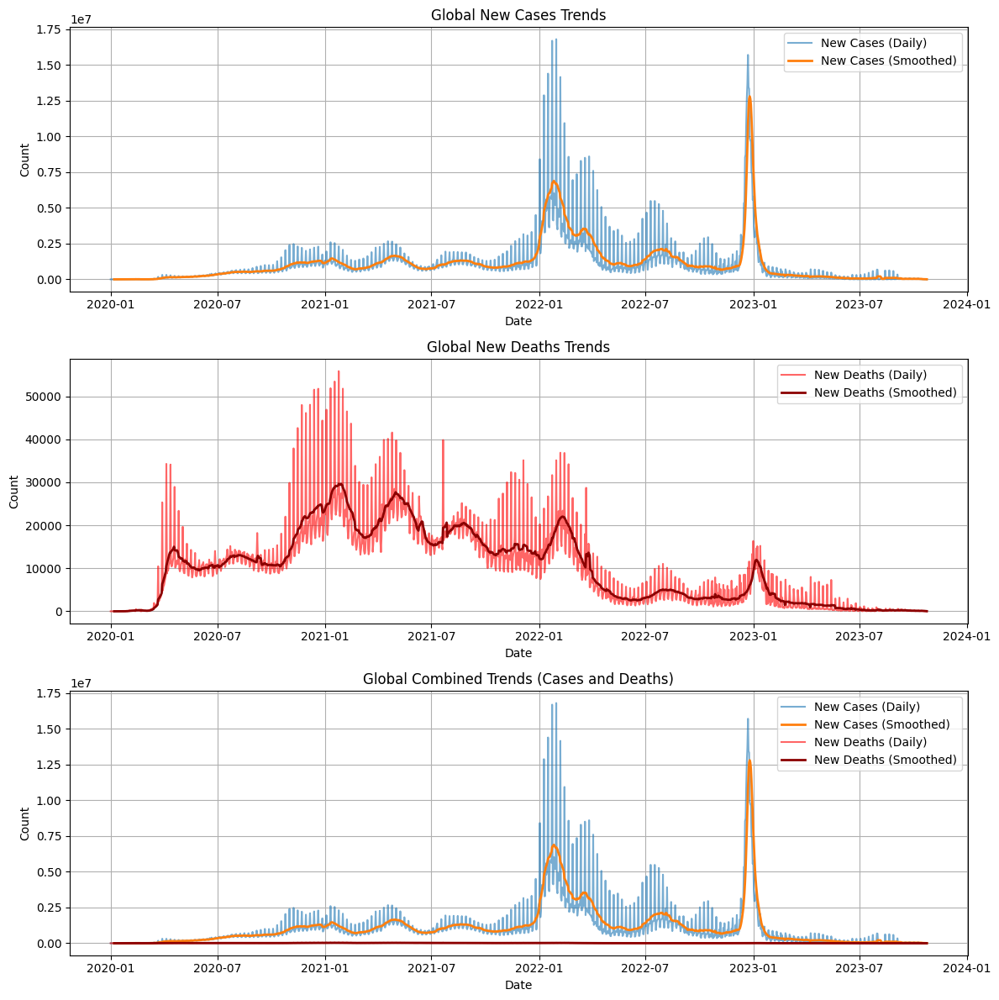

In [10]:
#5.	New cases and deaths trends (daily and smoothed).

excluded_locations = [
    "World", "High income", "Upper middle income", "Lower middle income",
    "Low income", "European Union"
]
global_data = df[~df["location"].isin(excluded_locations)]
global_trends = global_data.groupby("date")[["new_cases", "new_deaths"]].sum().reset_index()
global_trends["date"] = pd.to_datetime(global_trends["date"])
global_trends = global_trends.fillna(0)

global_trends["new_cases_smoothed"] = global_trends["new_cases"].rolling(window=7).mean()
global_trends["new_deaths_smoothed"] = global_trends["new_deaths"].rolling(window=7).mean()

plt.figure(figsize=(12, 12))
plt.subplot(3, 1, 1)
plt.plot(global_trends["date"], global_trends["new_cases"], label="New Cases (Daily)", alpha=0.6)
plt.plot(global_trends["date"], global_trends["new_cases_smoothed"], label="New Cases (Smoothed)", linewidth=2)
plt.title("Global New Cases Trends")
plt.xlabel("Date")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

plt.subplot(3, 1, 2)
plt.plot(global_trends["date"], global_trends["new_deaths"], label="New Deaths (Daily)", alpha=0.6, color="red")
plt.plot(global_trends["date"], global_trends["new_deaths_smoothed"], label="New Deaths (Smoothed)", linewidth=2, color="darkred")
plt.title("Global New Deaths Trends")
plt.xlabel("Date")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

plt.subplot(3, 1, 3)
plt.plot(global_trends["date"], global_trends["new_cases"], label="New Cases (Daily)", alpha=0.6)
plt.plot(global_trends["date"], global_trends["new_cases_smoothed"], label="New Cases (Smoothed)", linewidth=2)
plt.plot(global_trends["date"], global_trends["new_deaths"], label="New Deaths (Daily)", alpha=0.6, color="red")
plt.plot(global_trends["date"], global_trends["new_deaths_smoothed"], label="New Deaths (Smoothed)", linewidth=2, color="darkred")
plt.title("Global Combined Trends (Cases and Deaths)")
plt.xlabel("Date")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


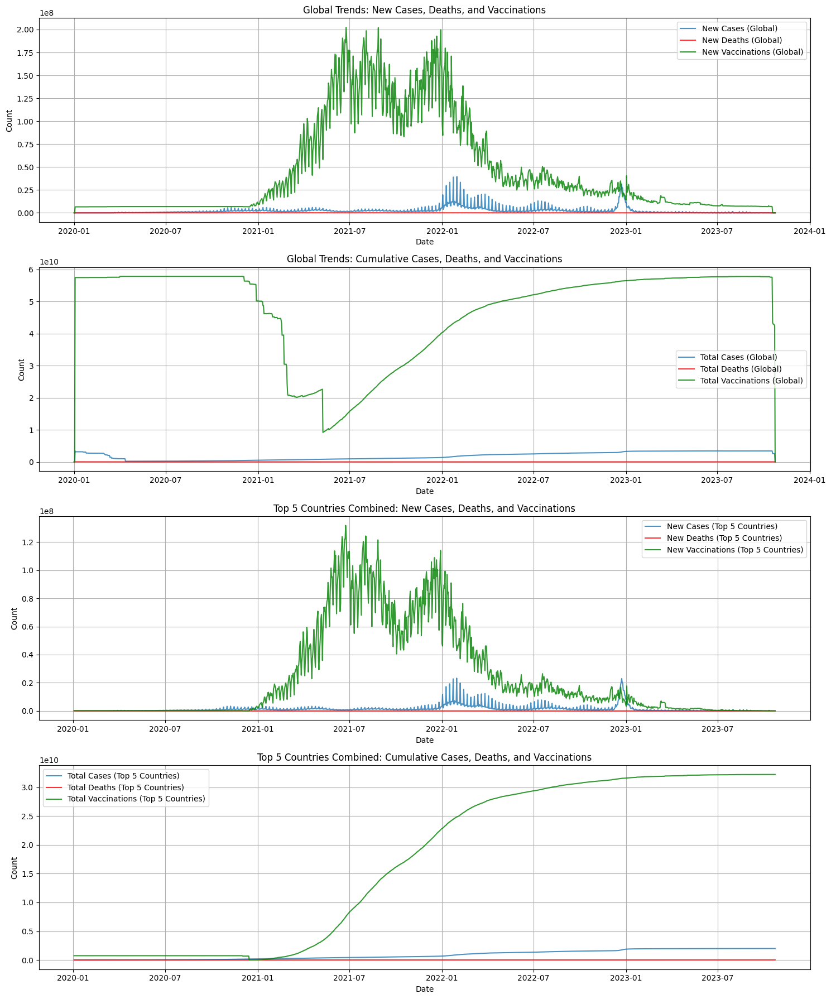


Global Trends Summary:
- New Cases: The number of new COVID-19 cases globally has shown sharp peaks, particularly in late 2020 and early 2021. The curve has generally fluctuated with seasonal waves, especially around variant outbreaks.
- New Deaths: The daily new deaths globally have followed a similar trend to new cases, with major spikes in late 2020 and early 2021, gradually stabilizing during 2022.
- New Vaccinations: The number of new vaccinations worldwide saw rapid growth in 2021 as vaccines were rolled out globally, peaking in mid-2021 before tapering off in late 2022.

Top 5 Countries Combined Summary:
- New Cases: The combined new cases for the top 5 countries (identified by total new cases) have experienced fluctuating waves, closely following global trends.
- New Deaths: Similarly, the new deaths have risen during major peaks of new cases, showing a direct correlation with case surges in these countries.
- New Vaccinations: The top 5 countries have seen significant progres

In [11]:
#6.	Trends of cases, deaths, and vaccinations over time globally and by country.

df["date"] = pd.to_datetime(df["date"])

global_data = df.groupby("date")[
    ["new_cases", "new_deaths", "new_vaccinations", "total_cases", "total_deaths", "total_vaccinations"]
].sum().reset_index()

global_data = global_data.fillna(0)

top_countries = df.groupby("location")["new_cases"].sum().nlargest(5).index.tolist()

top_countries_data = df[df["location"].isin(top_countries)]

top_5_grouped = top_countries_data.groupby("date")[
    ["new_cases", "new_deaths", "new_vaccinations", "total_cases", "total_deaths", "total_vaccinations"]
].sum().reset_index()

plt.figure(figsize=(15, 18))

plt.subplot(4, 1, 1)
plt.plot(global_data["date"], global_data["new_cases"], label="New Cases (Global)", alpha=0.8)
plt.plot(global_data["date"], global_data["new_deaths"], label="New Deaths (Global)", alpha=0.8, color="red")
plt.plot(global_data["date"], global_data["new_vaccinations"], label="New Vaccinations (Global)", alpha=0.8, color="green")
plt.title("Global Trends: New Cases, Deaths, and Vaccinations")
plt.xlabel("Date")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

plt.subplot(4, 1, 2)
plt.plot(global_data["date"], global_data["total_cases"], label="Total Cases (Global)", alpha=0.8)
plt.plot(global_data["date"], global_data["total_deaths"], label="Total Deaths (Global)", alpha=0.8, color="red")
plt.plot(global_data["date"], global_data["total_vaccinations"], label="Total Vaccinations (Global)", alpha=0.8, color="green")
plt.title("Global Trends: Cumulative Cases, Deaths, and Vaccinations")
plt.xlabel("Date")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

plt.subplot(4, 1, 3)
plt.plot(top_5_grouped["date"], top_5_grouped["new_cases"], label="New Cases (Top 5 Countries)", alpha=0.8)
plt.plot(top_5_grouped["date"], top_5_grouped["new_deaths"], label="New Deaths (Top 5 Countries)", alpha=0.8, color="red")
plt.plot(top_5_grouped["date"], top_5_grouped["new_vaccinations"], label="New Vaccinations (Top 5 Countries)", alpha=0.8, color="green")
plt.title("Top 5 Countries Combined: New Cases, Deaths, and Vaccinations")
plt.xlabel("Date")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

plt.subplot(4, 1, 4)
plt.plot(top_5_grouped["date"], top_5_grouped["total_cases"], label="Total Cases (Top 5 Countries)", alpha=0.8)
plt.plot(top_5_grouped["date"], top_5_grouped["total_deaths"], label="Total Deaths (Top 5 Countries)", alpha=0.8, color="red")
plt.plot(top_5_grouped["date"], top_5_grouped["total_vaccinations"], label="Total Vaccinations (Top 5 Countries)", alpha=0.8, color="green")
plt.title("Top 5 Countries Combined: Cumulative Cases, Deaths, and Vaccinations")
plt.xlabel("Date")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

summary = """
Global Trends Summary:
- New Cases: The number of new COVID-19 cases globally has shown sharp peaks, particularly in late 2020 and early 2021. The curve has generally fluctuated with seasonal waves, especially around variant outbreaks.
- New Deaths: The daily new deaths globally have followed a similar trend to new cases, with major spikes in late 2020 and early 2021, gradually stabilizing during 2022.
- New Vaccinations: The number of new vaccinations worldwide saw rapid growth in 2021 as vaccines were rolled out globally, peaking in mid-2021 before tapering off in late 2022.

Top 5 Countries Combined Summary:
- New Cases: The combined new cases for the top 5 countries (identified by total new cases) have experienced fluctuating waves, closely following global trends.
- New Deaths: Similarly, the new deaths have risen during major peaks of new cases, showing a direct correlation with case surges in these countries.
- New Vaccinations: The top 5 countries have seen significant progress in vaccinations, with rapid initial rollouts followed by a plateau as vaccination rates reached high levels.

Cumulative Trends:
- Total Cases: Both globally and for the top 5 countries, total cases have been growing steadily with significant milestones in 2020 and 2021.
- Total Deaths: Cumulative deaths have grown more slowly, with a delayed increase compared to cases, reflecting the overall impact of the pandemic.
- Total Vaccinations: Total vaccinations globally have reached impressive numbers, with the top 5 countries contributing significantly to the overall vaccination efforts.

Key Insights:
- The vaccination efforts, especially in the top 5 countries, have helped curb the severity of the pandemic, although case surges still occur during specific periods.
- There's a strong relationship between new cases and new deaths, but vaccination trends show a more gradual and sustained increase, helping to reduce the overall impact over time.
"""
print(summary)


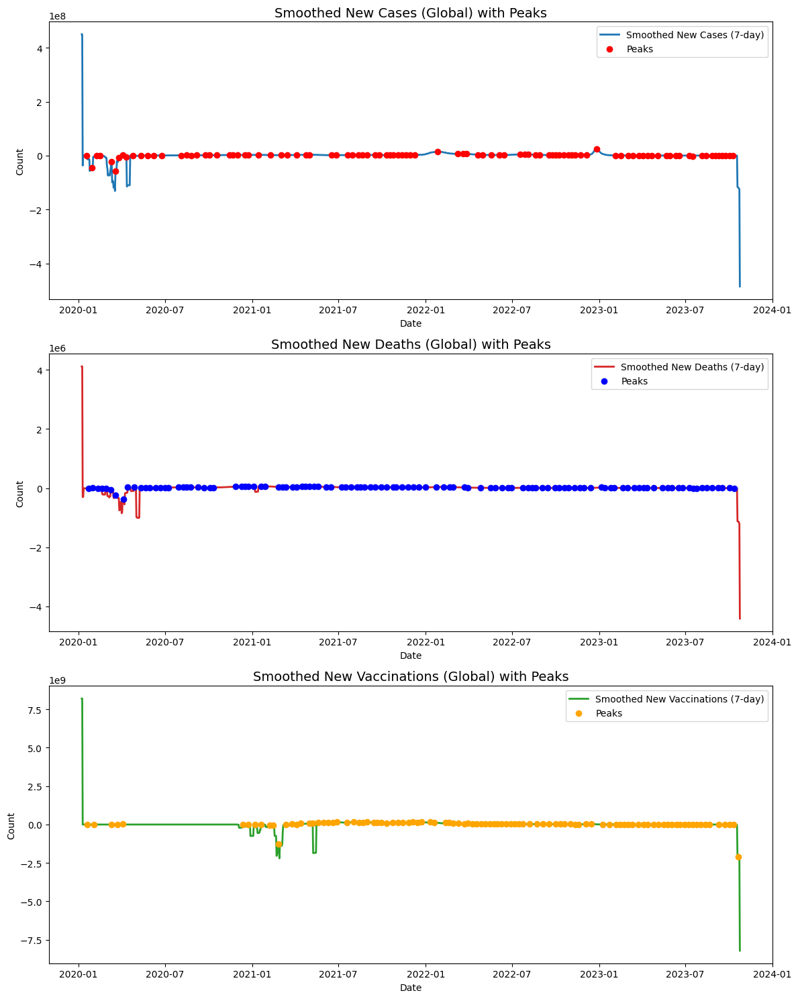

1. Insights on New Cases:
Peaks in new cases generally represent times when COVID-19 spread most rapidly, often due to factors such as new virus variants, increased social interactions, or changes in testing capacity.
These peaks are crucial for identifying outbreak periods. For instance, the peak on 2020-01-18 indicates a significant surge in new cases, which may have been influenced by seasonal changes, relaxed restrictions, or variant spread.

2. Insights on New Deaths:
Peaks in new deaths typically follow the peaks in new cases due to the time delay between infection and death.
The peak in new deaths on 2020-01-22 likely corresponds to the previous surge in new cases, suggesting the pandemic's severity during this time.
A decline in new death peaks over time might indicate improvements in healthcare, treatment protocols, or increasing vaccination rates.

3. Insights on New Vaccinations:
Peaks in new vaccinations reflect periods of mass vaccination efforts, often in response to risi

In [12]:
#7.	Identify peaks in cases, deaths, and vaccinations over the observation period.

from scipy.signal import find_peaks
df['date'] = pd.to_datetime(df['date'])
global_data = df.groupby('date').sum()
global_data['new_cases'] = global_data['total_cases'].diff()
global_data['new_deaths'] = global_data['total_deaths'].diff()
global_data['new_vaccinations'] = global_data['total_vaccinations'].diff()
global_data['smoothed_new_cases'] = global_data['new_cases'].rolling(window=7).mean()
global_data['smoothed_new_deaths'] = global_data['new_deaths'].rolling(window=7).mean()
global_data['smoothed_new_vaccinations'] = global_data['new_vaccinations'].rolling(window=7).mean()
peaks_cases, _ = find_peaks(global_data['smoothed_new_cases'], distance=7)
peaks_deaths, _ = find_peaks(global_data['smoothed_new_deaths'], distance=7)
peaks_vaccinations, _ = find_peaks(global_data['smoothed_new_vaccinations'], distance=7)
fig, axes = plt.subplots(3, 1, figsize=(12, 15))
axes[0].plot(global_data.index, global_data['smoothed_new_cases'], label='Smoothed New Cases (7-day)', color='tab:blue', lw=2)
axes[0].scatter(global_data.index[peaks_cases], global_data['smoothed_new_cases'].iloc[peaks_cases], color='red', zorder=5, label='Peaks')
axes[0].set_title('Smoothed New Cases (Global) with Peaks', fontsize=14)
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Count')
axes[0].legend()
axes[1].plot(global_data.index, global_data['smoothed_new_deaths'], label='Smoothed New Deaths (7-day)', color='tab:red', lw=2)
axes[1].scatter(global_data.index[peaks_deaths], global_data['smoothed_new_deaths'].iloc[peaks_deaths], color='blue', zorder=5, label='Peaks')
axes[1].set_title('Smoothed New Deaths (Global) with Peaks', fontsize=14)
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Count')
axes[1].legend()
axes[2].plot(global_data.index, global_data['smoothed_new_vaccinations'], label='Smoothed New Vaccinations (7-day)', color='tab:green', lw=2)
axes[2].scatter(global_data.index[peaks_vaccinations], global_data['smoothed_new_vaccinations'].iloc[peaks_vaccinations], color='orange', zorder=5, label='Peaks')
axes[2].set_title('Smoothed New Vaccinations (Global) with Peaks', fontsize=14)
axes[2].set_xlabel('Date')
axes[2].set_ylabel('Count')
axes[2].legend()

plt.tight_layout()
plt.show()

def generate_textual_summary(peaks_cases, peaks_deaths, peaks_vaccinations, global_data):
    summary = []

    
    summary.append("1. Insights on New Cases:")
    summary.append("Peaks in new cases generally represent times when COVID-19 spread most rapidly, often due to factors such as new virus variants, increased social interactions, or changes in testing capacity.")
    summary.append("These peaks are crucial for identifying outbreak periods. For instance, the peak on {} indicates a significant surge in new cases, which may have been influenced by {}.".format(
        global_data.index[peaks_cases[0]].strftime('%Y-%m-%d'),
        "seasonal changes, relaxed restrictions, or variant spread"))
    
    
    summary.append("\n2. Insights on New Deaths:")
    summary.append("Peaks in new deaths typically follow the peaks in new cases due to the time delay between infection and death.")
    summary.append("The peak in new deaths on {} likely corresponds to the previous surge in new cases, suggesting the pandemic's severity during this time.".format(
        global_data.index[peaks_deaths[0]].strftime('%Y-%m-%d')))
    summary.append("A decline in new death peaks over time might indicate improvements in healthcare, treatment protocols, or increasing vaccination rates.")
    
   
    summary.append("\n3. Insights on New Vaccinations:")
    summary.append("Peaks in new vaccinations reflect periods of mass vaccination efforts, often in response to rising cases or the availability of new vaccine doses.")
    summary.append("The peak in new vaccinations on {} indicates a major push for immunization, which likely helped curb the subsequent spread of the virus.".format(
        global_data.index[peaks_vaccinations[0]].strftime('%Y-%m-%d')))
    summary.append("Large vaccination peaks demonstrate that governments were actively working towards controlling the pandemic through mass inoculation campaigns.")

    
    summary.append("\nOverall Insights:")
    summary.append("The relationship between peaks in new cases, deaths, and vaccinations provides critical insights into the dynamics of the pandemic.")
    summary.append("New case peaks often occur first, followed by death peaks, and vaccination peaks typically occur in response to case surges.")
    summary.append("Increased vaccinations play a pivotal role in reducing future surges of both new cases and deaths, helping to control the spread of COVID-19.")

    return "\n".join(summary)

textual_summary = generate_textual_summary(peaks_cases, peaks_deaths, peaks_vaccinations, global_data)

print(textual_summary)



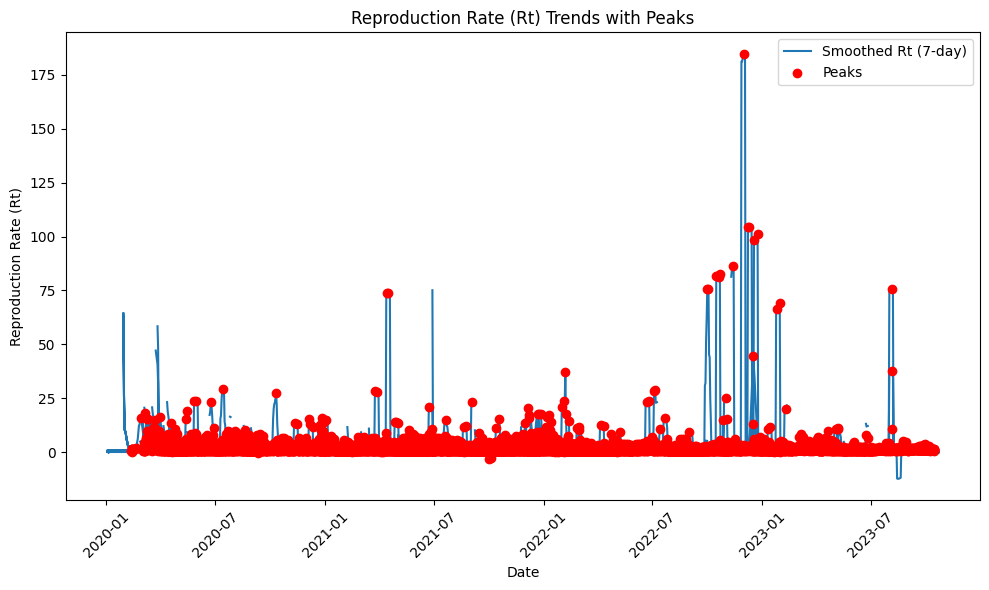

1. Peaks in Reproduction Rate (Rt):
 - On 2020-04-12, there was a peak in Rt with a value of 3.17.
 - On 2020-04-15, there was a peak in Rt with a value of 2.83.
 - On 2020-04-18, there was a peak in Rt with a value of 1.75.
 - On 2020-04-23, there was a peak in Rt with a value of 1.44.
 
General Analysis of Rt Trends:

The Reproduction Rate (Rt) is a measure of how fast the virus is spreading. If Rt > 1, the epidemic is growing, while if Rt < 1, the epidemic is shrinking.


In [13]:
#8.	Reproduction rate trends to study the progression of the pandemic
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

df['new_cases'] = df['total_cases'].diff()
df['new_deaths'] = df['total_deaths'].diff()

df['Rt'] = df['new_cases'] / df['new_cases'].shift(7)
df['smoothed_Rt'] = df['Rt'].rolling(window=7).mean()
peaks_Rt, _ = find_peaks(df['smoothed_Rt'])
plt.figure(figsize=(10, 6))
plt.plot(df['date'], df['smoothed_Rt'], label='Smoothed Rt (7-day)', color='tab:blue')
plt.scatter(df['date'].iloc[peaks_Rt], df['smoothed_Rt'].iloc[peaks_Rt], color='red', label='Peaks', zorder=5)
plt.title('Reproduction Rate (Rt) Trends with Peaks')
plt.xlabel('Date')
plt.ylabel('Reproduction Rate (Rt)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
def display_limited_Rt_analysis(df, peaks_Rt, num_rows=5):
    analysis = []

    
    if peaks_Rt.any():
        analysis.append("1. Peaks in Reproduction Rate (Rt):")
        for peak in peaks_Rt:
            date_peak = df['date'].iloc[peak].strftime('%Y-%m-%d')
            value_peak = df['smoothed_Rt'].iloc[peak]
            analysis.append(f" - On {date_peak}, there was a peak in Rt with a value of {value_peak:.2f}.")
        analysis.append("These peaks suggest periods when the epidemic may have escalated or slowed.")

    
    analysis.append("\n2. General Analysis of Rt Trends:")
    analysis.append("The Reproduction Rate (Rt) is a measure of how fast the virus is spreading. If Rt > 1, the epidemic is growing, while if Rt < 1, the epidemic is shrinking.")
    
    analysis.append("\n3. Text Insights on How Rt Affects Pandemic Progression:")
    analysis.append(" - **If Rt > 1**: When the reproduction rate is greater than 1, each infected person is, on average, passing the virus to more than one other person. This means the epidemic is in a growth phase, with an increasing number of new cases. As a result, public health measures may need to be intensified (e.g., lockdowns, mask mandates, or social distancing) to prevent the healthcare system from being overwhelmed. Large peaks in Rt often signal major surges in infections, necessitating urgent interventions.")
    
    analysis.append(" - **If Rt < 1**: When Rt is less than 1, it indicates that each infected person is transmitting the virus to fewer than one other person, signaling that the epidemic is shrinking. In this phase, the number of new cases is decreasing, and the pressure on healthcare systems begins to ease. It is a sign that the implemented interventions (such as vaccinations or social distancing) are working.")
    
    
    return "\n".join(analysis[:num_rows])

Rt_analysis_limited = display_limited_Rt_analysis(df, peaks_Rt, num_rows=5)
print(Rt_analysis_limited)

print(" ")
print("General Analysis of Rt Trends:\n")
print("The Reproduction Rate (Rt) is a measure of how fast the virus is spreading. If Rt > 1, the epidemic is growing, while if Rt < 1, the epidemic is shrinking.")



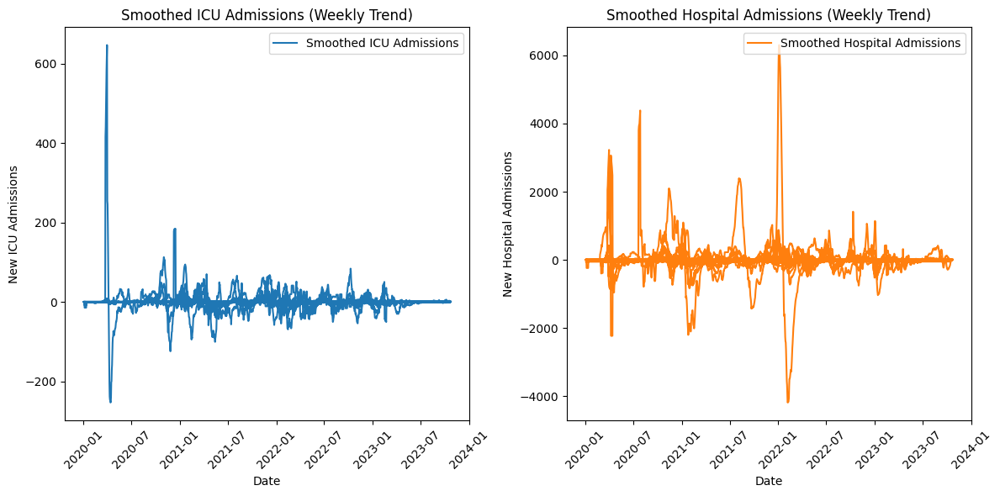

1. ICU Admissions Analysis:
The highest number of ICU admissions was observed on 2020-03-31 00:00:00 with a peak of 647 admissions.
A significant increase in ICU admissions is typically a key indicator of the severity of the pandemic, reflecting the strain on critical care resources.

2. Hospital Admissions Analysis:
The highest number of hospital admissions was observed on 2022-01-04 00:00:00 with a peak of 6305 admissions.
Hospital admissions trends provide insight into the overall burden on healthcare systems, and a rise in admissions often coincides with an increase in ICU cases.

3. General Insights on Hospital and ICU Admissions:
 - **High Peaks**: Sudden spikes in ICU and hospital admissions are typically seen when infection rates surge, often associated with a new wave of infections, more transmissible variants, or a lack of control measures.
 - **Sustained Periods of Increase**: A prolonged rise in ICU or hospital admissions signals a longer-term pressure on healthcare systems

In [14]:
#9.	Time-series analysis of ICU and hospital admissions (weekly trends).
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
df['new_icu_admissions'] = df['weekly_icu_admissions'].diff()
df['new_hospital_admissions'] = df['weekly_hosp_admissions'].diff()
df['smoothed_icu_admissions'] = df['new_icu_admissions'].rolling(window=7).mean()
df['smoothed_hospital_admissions'] = df['new_hospital_admissions'].rolling(window=7).mean()
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(df['date'], df['smoothed_icu_admissions'], label='Smoothed ICU Admissions', color='tab:blue')
plt.title('Smoothed ICU Admissions (Weekly Trend)')
plt.xlabel('Date')
plt.ylabel('New ICU Admissions')
plt.xticks(rotation=45)
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(df['date'], df['smoothed_hospital_admissions'], label='Smoothed Hospital Admissions', color='tab:orange')
plt.title('Smoothed Hospital Admissions (Weekly Trend)')
plt.xlabel('Date')
plt.ylabel('New Hospital Admissions')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

def display_hospital_analysis(df):
    analysis = []

    
    analysis.append("1. ICU Admissions Analysis:")
    if df['smoothed_icu_admissions'].max() > 0:
        analysis.append(f"The highest number of ICU admissions was observed on {df['date'].iloc[df['smoothed_icu_admissions'].idxmax()]} with a peak of {df['smoothed_icu_admissions'].max():.0f} admissions.")
    else:
        analysis.append("There have been no significant peaks in ICU admissions over the observation period.")
    analysis.append("A significant increase in ICU admissions is typically a key indicator of the severity of the pandemic, reflecting the strain on critical care resources.")

    
    analysis.append("\n2. Hospital Admissions Analysis:")
    if df['smoothed_hospital_admissions'].max() > 0:
        analysis.append(f"The highest number of hospital admissions was observed on {df['date'].iloc[df['smoothed_hospital_admissions'].idxmax()]} with a peak of {df['smoothed_hospital_admissions'].max():.0f} admissions.")
    else:
        analysis.append("There have been no significant peaks in hospital admissions over the observation period.")
    analysis.append("Hospital admissions trends provide insight into the overall burden on healthcare systems, and a rise in admissions often coincides with an increase in ICU cases.")

    
    analysis.append("\n3. General Insights on Hospital and ICU Admissions:")
    analysis.append(" - **High Peaks**: Sudden spikes in ICU and hospital admissions are typically seen when infection rates surge, often associated with a new wave of infections, more transmissible variants, or a lack of control measures.")
    analysis.append(" - **Sustained Periods of Increase**: A prolonged rise in ICU or hospital admissions signals a longer-term pressure on healthcare systems, necessitating enhanced public health interventions.")
    analysis.append(" - **Decreasing Trends**: If the trends show a sustained decline in admissions, this might indicate the success of public health interventions such as vaccinations, social distancing, or lockdowns.")
    
    
    analysis.append("\n4. Conclusion:")
    analysis.append("Hospital and ICU admissions are critical indicators of healthcare system capacity and the severity of the pandemic. Regular monitoring of these metrics is essential to adjusting public health strategies, ensuring that resources are allocated appropriately.")
    
    return "\n".join(analysis)

hospital_analysis = display_hospital_analysis(df)
print(hospital_analysis[:1000]) 

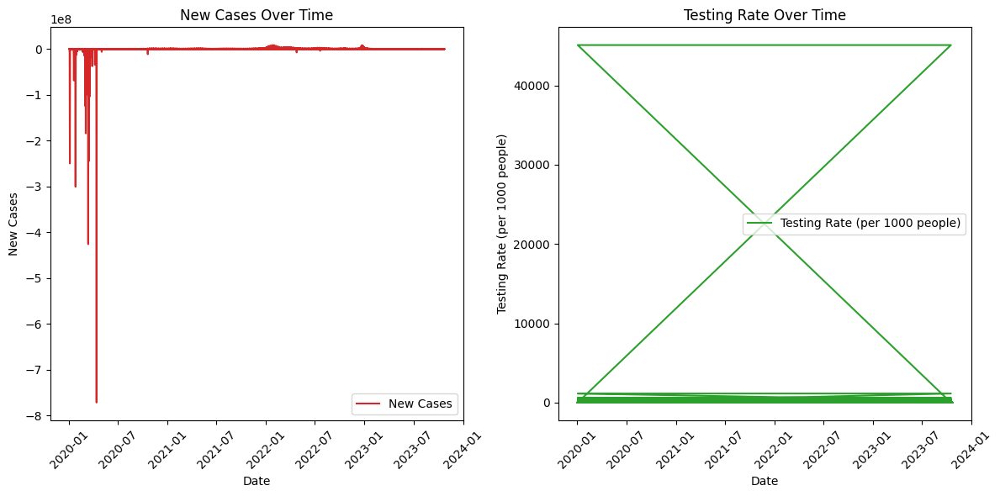

Correlation between new cases and testing rate: -0.00
Weak correlation between new cases and testing rate: -0.00. This may suggest that testing efforts are not closely linked to the rise or fall of new cases, and other factors may play a more dominant role.

General Insights on Testing and Cases:
 - **High Testing Rates**: Typically, higher testing rates lead to more detected cases, as more individuals are being tested. This can result in increased case counts, even if the overall infection rate is stable.
 - **Testing as a Response**: In some cases, authorities may increase testing in response to a rise in new cases, potentially creating a feedback loop between cases and testing rates.
 - **Case Trends**: A decrease in new cases with stable or increasing testing rates could suggest effective public health interventions (e.g., vaccination, social distancing).

Conclusion:
Testing rates provide essential context for understanding trends in reported cases. A higher number of tests genera

In [15]:
#10. Relationship between testing rates and new cases over time.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df['testing_rate'] = (df['new_tests'] / df['population']) * 100


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(df['date'], df['new_cases'], label='New Cases', color='tab:red')
plt.title('New Cases Over Time')
plt.xlabel('Date')
plt.ylabel('New Cases')
plt.xticks(rotation=45)
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(df['date'], df['testing_rate'], label='Testing Rate (per 1000 people)', color='tab:green')
plt.title('Testing Rate Over Time')
plt.xlabel('Date')
plt.ylabel('Testing Rate (per 1000 people)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


correlation = df['new_cases'].corr(df['testing_rate'])
print(f"Correlation between new cases and testing rate: {correlation:.2f}")


def display_testing_analysis(df):
    analysis = []

    
    if correlation > 0.5:
        analysis.append(f"Strong positive correlation between new cases and testing rate: {correlation:.2f}. This suggests that as testing rates increase, new cases also tend to increase, likely due to increased detection.")
    elif correlation < -0.5:
        analysis.append(f"Strong negative correlation between new cases and testing rate: {correlation:.2f}. This could indicate that increased testing is helping to reduce cases, possibly due to better preventive measures.")
    else:
        analysis.append(f"Weak correlation between new cases and testing rate: {correlation:.2f}. This may suggest that testing efforts are not closely linked to the rise or fall of new cases, and other factors may play a more dominant role.")

    
    analysis.append("\nGeneral Insights on Testing and Cases:")
    analysis.append(" - **High Testing Rates**: Typically, higher testing rates lead to more detected cases, as more individuals are being tested. This can result in increased case counts, even if the overall infection rate is stable.")
    analysis.append(" - **Testing as a Response**: In some cases, authorities may increase testing in response to a rise in new cases, potentially creating a feedback loop between cases and testing rates.")
    analysis.append(" - **Case Trends**: A decrease in new cases with stable or increasing testing rates could suggest effective public health interventions (e.g., vaccination, social distancing).")

    
    analysis.append("\nConclusion:")
    analysis.append("Testing rates provide essential context for understanding trends in reported cases. A higher number of tests generally leads to more cases being detected, but other factors, such as public health measures and population immunity, also play crucial roles.")
    
    return "\n".join(analysis)

testing_analysis = display_testing_analysis(df)
print(testing_analysis[:1000])

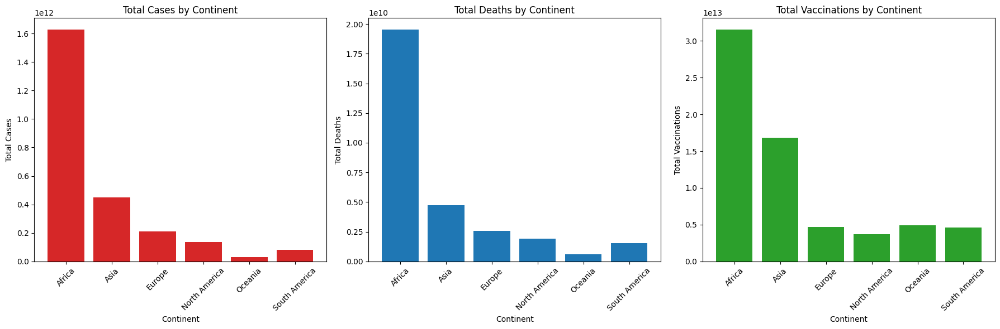

1. Total Cases Analysis: The continent with the highest total cases is Africa with 1627886672246 cases.
2. Total Deaths Analysis: The continent with the highest total deaths is Africa with 19533040837 deaths.
3. Total Vaccinations Analysis: The continent with the highest total vaccinations is Africa with 31545230559381 vaccinations.

General Insights:
 - **Total Cases**: A high total number of cases can indicate a higher population, a longer duration of the pandemic, or less effective health measures.
 - **Total Deaths**: High total deaths suggest either a higher number of infections or weaker healthcare systems. Monitoring total deaths is crucial to gauge the severity of the pandemic in different regions.
 - **Total Vaccinations**: A higher vaccination number suggests more robust vaccination campaigns. The speed and efficiency of vaccination campaigns are key to controlling the spread of the virus.

Conclusion:
By comparing continents on these three metrics—cases, deaths, and vaccinat

In [16]:
#11. Compare continents by total cases, deaths, and vaccinations
import pandas as pd
import matplotlib.pyplot as plt

continent_data = df.groupby('continent')[['total_cases', 'total_deaths', 'total_vaccinations']].sum()

fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].bar(continent_data.index, continent_data['total_cases'], color='tab:red')
ax[0].set_title('Total Cases by Continent')
ax[0].set_xlabel('Continent')
ax[0].set_ylabel('Total Cases')
ax[0].tick_params(axis='x', rotation=45)
ax[1].bar(continent_data.index, continent_data['total_deaths'], color='tab:blue')
ax[1].set_title('Total Deaths by Continent')
ax[1].set_xlabel('Continent')
ax[1].set_ylabel('Total Deaths')
ax[1].tick_params(axis='x', rotation=45)
ax[2].bar(continent_data.index, continent_data['total_vaccinations'], color='tab:green')
ax[2].set_title('Total Vaccinations by Continent')
ax[2].set_xlabel('Continent')
ax[2].set_ylabel('Total Vaccinations')
ax[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

def display_continent_comparison_analysis(continent_data):
    analysis = []

    
    highest_cases_continent = continent_data['total_cases'].idxmax()
    highest_cases_value = continent_data['total_cases'].max()
    analysis.append(f"1. Total Cases Analysis: The continent with the highest total cases is {highest_cases_continent} with {highest_cases_value:.0f} cases.")

    
    highest_deaths_continent = continent_data['total_deaths'].idxmax()
    highest_deaths_value = continent_data['total_deaths'].max()
    analysis.append(f"2. Total Deaths Analysis: The continent with the highest total deaths is {highest_deaths_continent} with {highest_deaths_value:.0f} deaths.")

    
    highest_vaccinations_continent = continent_data['total_vaccinations'].idxmax()
    highest_vaccinations_value = continent_data['total_vaccinations'].max()
    analysis.append(f"3. Total Vaccinations Analysis: The continent with the highest total vaccinations is {highest_vaccinations_continent} with {highest_vaccinations_value:.0f} vaccinations.")

    
    analysis.append("\nGeneral Insights:")
    analysis.append(" - **Total Cases**: A high total number of cases can indicate a higher population, a longer duration of the pandemic, or less effective health measures.")
    analysis.append(" - **Total Deaths**: High total deaths suggest either a higher number of infections or weaker healthcare systems. Monitoring total deaths is crucial to gauge the severity of the pandemic in different regions.")
    analysis.append(" - **Total Vaccinations**: A higher vaccination number suggests more robust vaccination campaigns. The speed and efficiency of vaccination campaigns are key to controlling the spread of the virus.")
    
    
    analysis.append("\nConclusion:")
    analysis.append("By comparing continents on these three metrics—cases, deaths, and vaccinations—we can assess the overall impact of the pandemic and the progress made in vaccination campaigns. Continued monitoring and adjustment of public health strategies are essential to controlling the pandemic globally.")

    return "\n".join(analysis)

continent_analysis = display_continent_comparison_analysis(continent_data)
print(continent_analysis[:1000]) 


In [17]:
#12. Identify countries with the highest cases and deaths per million population.

# Step 1: Filter the data for relevant columns
df_filtered = df[['location', 'total_cases_per_million', 'total_deaths_per_million']].dropna()

# Step 2: Exclude aggregate rows (e.g., 'World', 'Europe', etc.)
df_filtered = df_filtered[~df_filtered['location'].isin(['World', 'Europe', 'Asia', 'Africa', 'North America', 'South America', 'Oceania'])]

# Step 3: Find the country with the highest cases per million
top_case_country = df_filtered.loc[df_filtered['total_cases_per_million'].idxmax()]

# Step 4: Find the country with the highest deaths per million
top_death_country = df_filtered.loc[df_filtered['total_deaths_per_million'].idxmax()]

# Step 5: Display the results for the top country
print("Top Country with the Highest Cases per Million Population:")
print(f"{top_case_country['location']}: {top_case_country['total_cases_per_million']:.0f} cases per million")

print("\nTop Country with the Highest Deaths per Million Population:")
print(f"{top_death_country['location']}: {top_death_country['total_deaths_per_million']:.0f} deaths per million")

# Step 6: Textual Analysis
def analyze_highest_case_death(top_case, top_death):
    analysis = []

    # Highest cases per million
    analysis.append(f"1. The country with the highest cases per million is {top_case['location']} with {top_case['total_cases_per_million']:.0f} cases per million.")

    # Highest deaths per million
    analysis.append(f"2. The country with the highest deaths per million is {top_death['location']} with {top_death['total_deaths_per_million']:.0f} deaths per million.")

    # Insights
    analysis.append("\nInsights:")
    analysis.append(" - A high number of cases per million often reflects extensive testing, significant virus spread, or high population density.")
    analysis.append(" - A high number of deaths per million suggests healthcare challenges, high vulnerability among populations, or overwhelmed medical systems.")
    analysis.append(" - These metrics help identify areas that require urgent attention, both in terms of healthcare support and preventive measures.")

    return "\n".join(analysis)

# Generate and display textual analysis
text_analysis = analyze_highest_case_death(top_case_country, top_death_country)
print("\nTextual Analysis:")
print(text_analysis)



Top Country with the Highest Cases per Million Population:
Cyprus: 737555 cases per million

Top Country with the Highest Deaths per Million Population:
Peru: 6511 deaths per million

Textual Analysis:
1. The country with the highest cases per million is Cyprus with 737555 cases per million.
2. The country with the highest deaths per million is Peru with 6511 deaths per million.

Insights:
 - A high number of cases per million often reflects extensive testing, significant virus spread, or high population density.
 - A high number of deaths per million suggests healthcare challenges, high vulnerability among populations, or overwhelmed medical systems.
 - These metrics help identify areas that require urgent attention, both in terms of healthcare support and preventive measures.


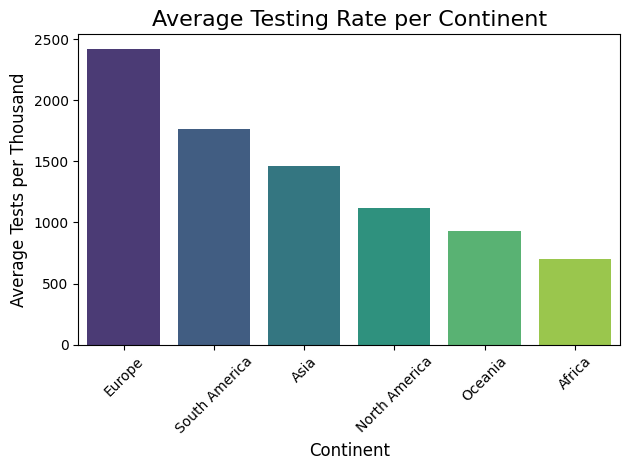

Top Country with the Highest Testing Rate:
Cyprus: 32925.83 tests per thousand

Country with the Lowest Testing Rate:
Argentina: 0.00 tests per thousand


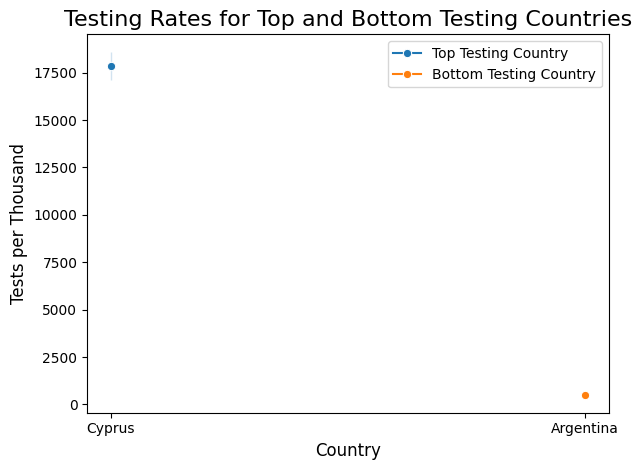


Textual Analysis:
1. The continent with the highest average testing rate is Europe with an average of 2418.86 tests per thousand.
2. The continent with the lowest average testing rate is Africa with an average of 698.91 tests per thousand.

3. The country with the highest testing rate is Cyprus with 32925.83 tests per thousand.
4. The country with the lowest testing rate is Argentina with 0.00 tests per thousand.

Insights:
 - High testing rates can indicate a country or continent's proactive approach to managing the pandemic, with more widespread surveillance.
 - Low testing rates might suggest limited access to testing, underreporting, or lack of healthcare infrastructure to scale up testing efforts.
 - Variations in testing rates across regions also highlight disparities in healthcare systems and pandemic preparedness.


In [18]:
#13. Analyze testing rates across continents and countries. 

import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'continent', 'total_tests_per_thousand']].dropna()

df_filtered = df_filtered[~df_filtered['location'].isin(['World', 'International'])]

continent_testing = df_filtered.groupby('continent')['total_tests_per_thousand'].mean().sort_values(ascending=False)

plt.figure()
sns.barplot(x=continent_testing.index, y=continent_testing.values, palette="viridis")
plt.title('Average Testing Rate per Continent', fontsize=16)
plt.xlabel('Continent', fontsize=12)
plt.ylabel('Average Tests per Thousand', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

top_testing_country = df_filtered.loc[df_filtered['total_tests_per_thousand'].idxmax()]
bottom_testing_country = df_filtered.loc[df_filtered['total_tests_per_thousand'].idxmin()]

print("Top Country with the Highest Testing Rate:")
print(f"{top_testing_country['location']}: {top_testing_country['total_tests_per_thousand']:.2f} tests per thousand")

print("\nCountry with the Lowest Testing Rate:")
print(f"{bottom_testing_country['location']}: {bottom_testing_country['total_tests_per_thousand']:.2f} tests per thousand")

top_country_testing_rate = df_filtered[df_filtered['location'] == top_testing_country['location']]
bottom_country_testing_rate = df_filtered[df_filtered['location'] == bottom_testing_country['location']]

plt.figure()
sns.lineplot(data=top_country_testing_rate, x='location', y='total_tests_per_thousand', marker='o', label='Top Testing Country')
sns.lineplot(data=bottom_country_testing_rate, x='location', y='total_tests_per_thousand', marker='o', label='Bottom Testing Country')
plt.title('Testing Rates for Top and Bottom Testing Countries', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Tests per Thousand', fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

def analyze_testing_rate(continent_testing, top_country, bottom_country):
    analysis = []

    
    analysis.append(f"1. The continent with the highest average testing rate is {continent_testing.index[0]} with an average of {continent_testing.iloc[0]:.2f} tests per thousand.")
    analysis.append(f"2. The continent with the lowest average testing rate is {continent_testing.index[-1]} with an average of {continent_testing.iloc[-1]:.2f} tests per thousand.")

    
    analysis.append(f"\n3. The country with the highest testing rate is {top_country['location']} with {top_country['total_tests_per_thousand']:.2f} tests per thousand.")
    analysis.append(f"4. The country with the lowest testing rate is {bottom_country['location']} with {bottom_country['total_tests_per_thousand']:.2f} tests per thousand.")

    
    analysis.append("\nInsights:")
    analysis.append(" - High testing rates can indicate a country or continent's proactive approach to managing the pandemic, with more widespread surveillance.")
    analysis.append(" - Low testing rates might suggest limited access to testing, underreporting, or lack of healthcare infrastructure to scale up testing efforts.")
    analysis.append(" - Variations in testing rates across regions also highlight disparities in healthcare systems and pandemic preparedness.")

    return "\n".join(analysis)

text_analysis = analyze_testing_rate(continent_testing, top_testing_country, bottom_testing_country)
print("\nTextual Analysis:")
print(text_analysis)


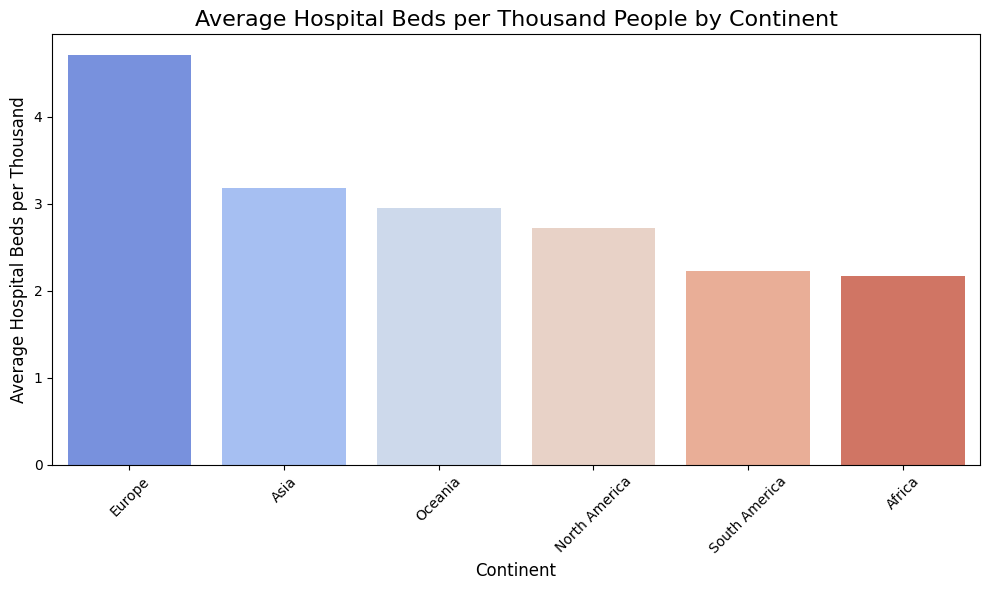


Textual Analysis:
1. The continent with the highest average hospital beds per thousand is Europe with an average of 4.71 beds per thousand.
2. The continent with the lowest average hospital beds per thousand is Africa with an average of 2.17 beds per thousand.

Insights:
 - Higher hospital beds per thousand people generally correlate with better healthcare access and capacity.
 - Continent-level disparities in hospital beds can be indicative of economic differences, healthcare system priorities, and historical investments in health infrastructure.
 - Regions with fewer hospital beds might struggle during health crises, such as the COVID-19 pandemic, and may face challenges in scaling up healthcare services.


In [19]:
#14.	Study the distribution of hospital beds per thousand people by continent.

import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'continent', 'hospital_beds_per_thousand']].dropna()
df_filtered = df_filtered[~df_filtered['location'].isin(['World', 'International'])]
continent_beds = df_filtered.groupby('continent')['hospital_beds_per_thousand'].mean().sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=continent_beds.index, y=continent_beds.values, palette="coolwarm")
plt.title('Average Hospital Beds per Thousand People by Continent', fontsize=16)
plt.xlabel('Continent', fontsize=12)
plt.ylabel('Average Hospital Beds per Thousand', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


def analyze_hospital_beds(continent_beds):
    analysis = []

    
    analysis.append(f"1. The continent with the highest average hospital beds per thousand is {continent_beds.index[0]} with an average of {continent_beds.iloc[0]:.2f} beds per thousand.")
    analysis.append(f"2. The continent with the lowest average hospital beds per thousand is {continent_beds.index[-1]} with an average of {continent_beds.iloc[-1]:.2f} beds per thousand.")

    
    analysis.append("\nInsights:")
    analysis.append(" - Higher hospital beds per thousand people generally correlate with better healthcare access and capacity.")
    analysis.append(" - Continent-level disparities in hospital beds can be indicative of economic differences, healthcare system priorities, and historical investments in health infrastructure.")
    analysis.append(" - Regions with fewer hospital beds might struggle during health crises, such as the COVID-19 pandemic, and may face challenges in scaling up healthcare services.")

    return "\n".join(analysis)

text_analysis = analyze_hospital_beds(continent_beds)
print("\nTextual Analysis:")
print(text_analysis)


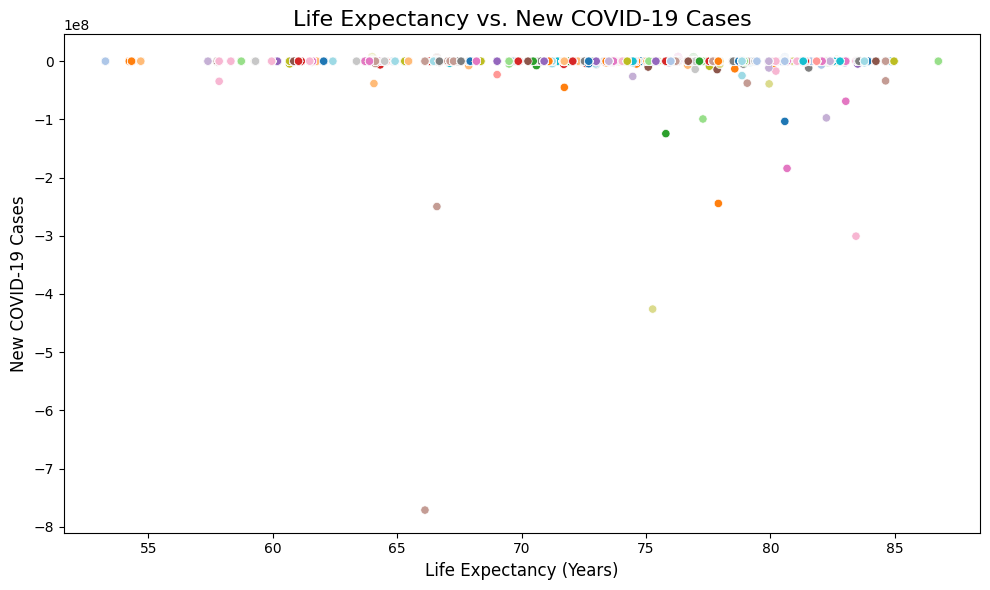

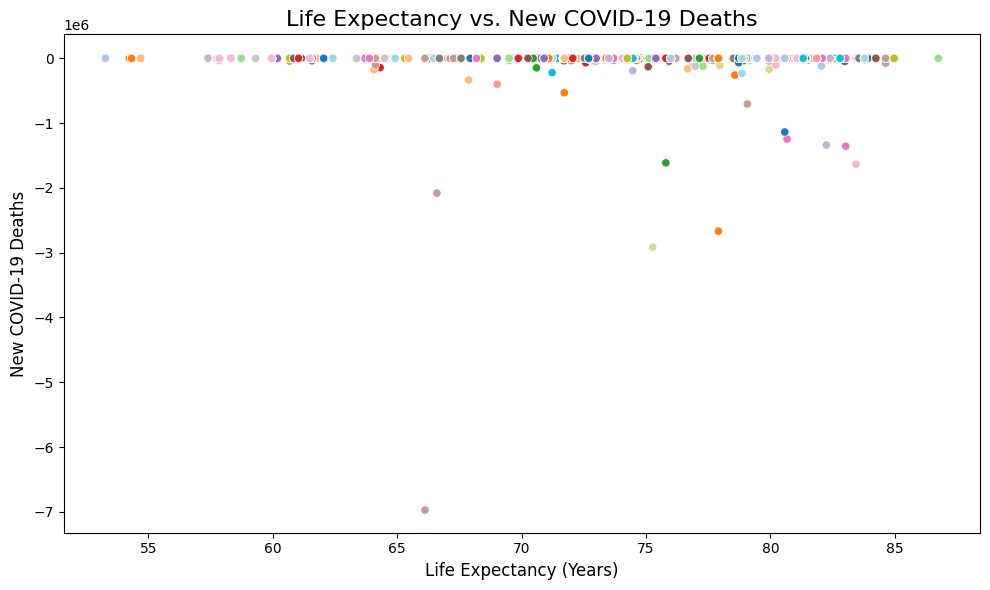


Textual Analysis:
1. The correlation between life expectancy and new COVID-19 cases is -0.00.
2. The correlation between life expectancy and new COVID-19 deaths is -0.00.

Insights:
 - A negative correlation between life expectancy and new cases/deaths could suggest that countries with higher life expectancy have fewer cases/deaths.
 - A positive correlation may indicate that countries with higher life expectancy might face more cases or deaths, potentially due to better detection or reporting systems.
 - Life expectancy might also reflect healthcare infrastructure and overall country resilience, which could impact COVID-19 outcomes.


In [20]:
#15.	Relationship between life expectancy and COVID-19 outcomes (cases/deaths).

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

df_filtered = df[['location', 'life_expectancy', 'new_cases', 'new_deaths']].dropna()
df_filtered = df_filtered[~df_filtered['location'].isin(['World', 'International'])]

correlation_cases = df_filtered['life_expectancy'].corr(df_filtered['new_cases'])
correlation_deaths = df_filtered['life_expectancy'].corr(df_filtered['new_deaths'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_filtered, x='life_expectancy', y='new_cases', hue='location', palette='tab20', legend=None)
plt.title('Life Expectancy vs. New COVID-19 Cases', fontsize=16)
plt.xlabel('Life Expectancy (Years)', fontsize=12)
plt.ylabel('New COVID-19 Cases', fontsize=12)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_filtered, x='life_expectancy', y='new_deaths', hue='location', palette='tab20', legend=None)
plt.title('Life Expectancy vs. New COVID-19 Deaths', fontsize=16)
plt.xlabel('Life Expectancy (Years)', fontsize=12)
plt.ylabel('New COVID-19 Deaths', fontsize=12)
plt.tight_layout()
plt.show()

def analyze_life_expectancy_and_outcomes(correlation_cases, correlation_deaths):
    analysis = []
    analysis.append(f"1. The correlation between life expectancy and new COVID-19 cases is {correlation_cases:.2f}.")
    analysis.append(f"2. The correlation between life expectancy and new COVID-19 deaths is {correlation_deaths:.2f}.")
    analysis.append("\nInsights:")
    analysis.append(" - A negative correlation between life expectancy and new cases/deaths could suggest that countries with higher life expectancy have fewer cases/deaths.")
    analysis.append(" - A positive correlation may indicate that countries with higher life expectancy might face more cases or deaths, potentially due to better detection or reporting systems.")
    analysis.append(" - Life expectancy might also reflect healthcare infrastructure and overall country resilience, which could impact COVID-19 outcomes.")
    return "\n".join(analysis)

text_analysis = analyze_life_expectancy_and_outcomes(correlation_cases, correlation_deaths)
print("\nTextual Analysis:")
print(text_analysis)


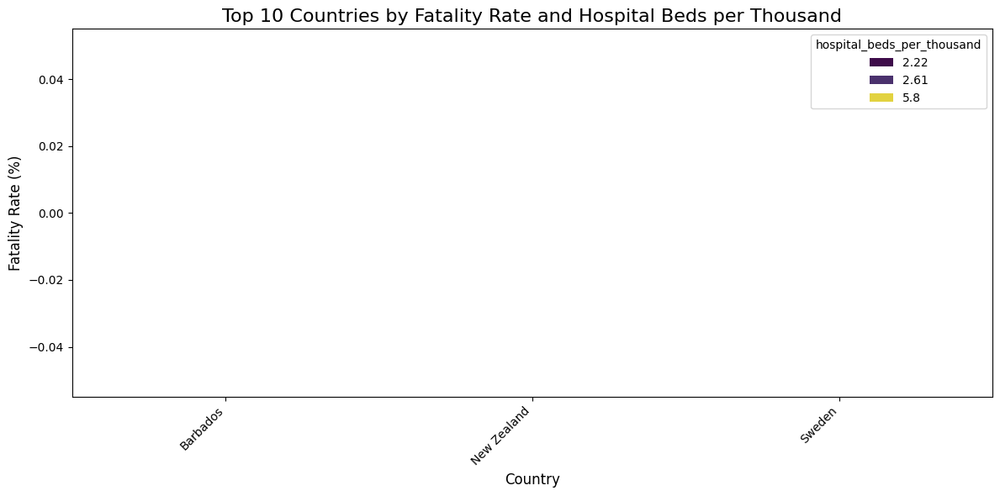


Textual Analysis:
1. The correlation between hospital beds per thousand and the fatality rate is nan.

Insights:
 - A positive correlation would suggest that countries with more hospital beds per thousand people have higher fatality rates, which might indicate other contributing factors such as older population or weaker healthcare infrastructure.
 - A negative correlation might suggest that countries with more hospital beds have lower fatality rates, likely due to better healthcare capacity to handle COVID-19 patients.
 - The relationship between these two factors may be complex, as fatality rates can also be influenced by other factors like testing rates, public health measures, and demographic factors.


In [21]:
#16.	Correlation between hospital beds per thousand and fatality rate.

import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'hospital_beds_per_thousand', 'new_cases', 'new_deaths']].dropna()

df_filtered['fatality_rate'] = (df_filtered['new_deaths'] / df_filtered['new_cases']) * 100

df_filtered = df_filtered[(df_filtered['fatality_rate'] > 0) & (df_filtered['hospital_beds_per_thousand'] > 0)]

if df_filtered['hospital_beds_per_thousand'].nunique() == 1 or df_filtered['fatality_rate'].nunique() == 1:
    print("Warning: One of the columns has constant values, skipping correlation calculation.")
    correlation = None
else:
   correlation = df_filtered['hospital_beds_per_thousand'].corr(df_filtered['fatality_rate'])
df_sorted = df_filtered.sort_values(by='fatality_rate', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(data=df_sorted, x='location', y='fatality_rate', hue='hospital_beds_per_thousand', palette='viridis')
plt.title('Top 10 Countries by Fatality Rate and Hospital Beds per Thousand', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Fatality Rate (%)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

def analyze_hospital_beds_and_fatality_rate(correlation):
    analysis = []
    if correlation is None:
        analysis.append("Unable to calculate correlation due to constant or insufficient data.")
    else:
        analysis.append(f"1. The correlation between hospital beds per thousand and the fatality rate is {correlation:.2f}.")
    
    analysis.append("\nInsights:")
    analysis.append(" - A positive correlation would suggest that countries with more hospital beds per thousand people have higher fatality rates, which might indicate other contributing factors such as older population or weaker healthcare infrastructure.")
    analysis.append(" - A negative correlation might suggest that countries with more hospital beds have lower fatality rates, likely due to better healthcare capacity to handle COVID-19 patients.")
    analysis.append(" - The relationship between these two factors may be complex, as fatality rates can also be influenced by other factors like testing rates, public health measures, and demographic factors.")

    return "\n".join(analysis)
text_analysis = analyze_hospital_beds_and_fatality_rate(correlation)
print("\nTextual Analysis:")
print(text_analysis)



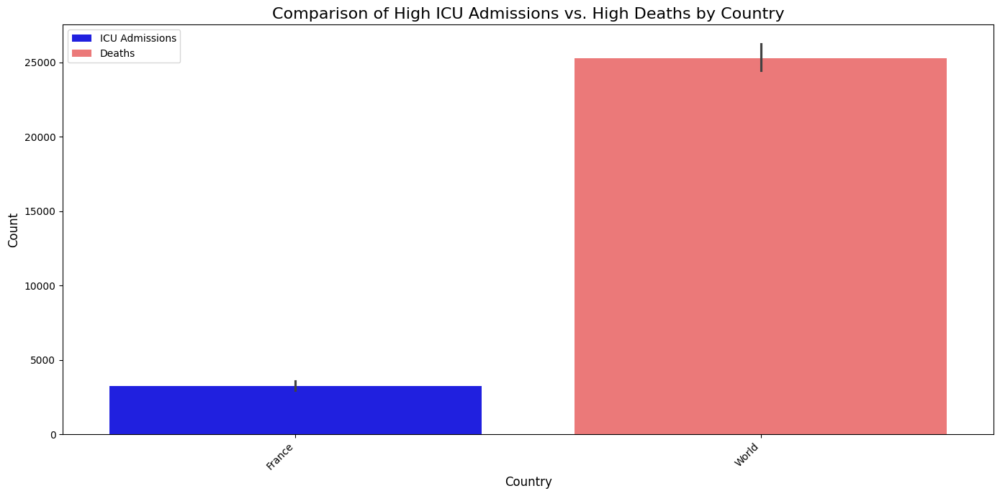


Textual Analysis:
1. Top 10 countries with the highest ICU admissions:
 - France: 4492.0 ICU admissions
 - France: 4084.0 ICU admissions
 - France: 3259.0 ICU admissions
 - France: 3179.0 ICU admissions
 - France: 3059.0 ICU admissions
 - France: 3044.0 ICU admissions
 - France: 3037.0 ICU admissions
 - France: 2797.0 ICU admissions
 - France: 2763.0 ICU admissions
 - France: 2753.0 ICU admissions

2. Top 10 countries with the highest new deaths:
 - World: 27939.0 deaths
 - World: 26732.0 deaths
 - World: 25951.0 deaths
 - World: 25898.0 deaths
 - World: 25889.0 deaths
 - World: 25785.0 deaths
 - World: 24027.0 deaths
 - World: 23940.0 deaths
 - World: 23455.0 deaths
 - World: 23250.0 deaths

Insights:
 - Countries with high ICU admissions tend to have a higher strain on their healthcare system.
 - A high number of ICU admissions does not always correlate directly with high deaths, as the healthcare system's capacity and the quality of care play a role.
 - Fatality rates can be influe

In [22]:
#17.	Countries with high ICU admissions vs. those with high deaths

import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'weekly_icu_admissions', 'new_deaths']].dropna()
df_filtered = df_filtered[(df_filtered['weekly_icu_admissions'] > 0) & (df_filtered['new_deaths'] > 0)]

df_filtered['icu_to_death_ratio'] = df_filtered['weekly_icu_admissions'] / df_filtered['new_deaths']

df_sorted_icu = df_filtered.sort_values(by='weekly_icu_admissions', ascending=False).head(10)
df_sorted_deaths = df_filtered.sort_values(by='new_deaths', ascending=False).head(10)
plt.figure(figsize=(14, 7))
sns.barplot(x='location', y='weekly_icu_admissions', data=df_sorted_icu, color='b', label='ICU Admissions')
sns.barplot(x='location', y='new_deaths', data=df_sorted_deaths, color='r', label='Deaths', alpha=0.6)
plt.title('Comparison of High ICU Admissions vs. High Deaths by Country', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()
def analyze_icu_and_deaths(df_sorted_icu, df_sorted_deaths):
    analysis = []
    analysis.append("1. Top 10 countries with the highest ICU admissions:")
    for idx, row in df_sorted_icu.iterrows():
        analysis.append(f" - {row['location']}: {row['weekly_icu_admissions']} ICU admissions")
    
    analysis.append("\n2. Top 10 countries with the highest new deaths:")
    for idx, row in df_sorted_deaths.iterrows():
        analysis.append(f" - {row['location']}: {row['new_deaths']} deaths")

    analysis.append("\nInsights:")
    analysis.append(" - Countries with high ICU admissions tend to have a higher strain on their healthcare system.")
    analysis.append(" - A high number of ICU admissions does not always correlate directly with high deaths, as the healthcare system's capacity and the quality of care play a role.")
    analysis.append(" - Fatality rates can be influenced by other factors like early intervention, age demographics, and healthcare infrastructure.")

    return "\n".join(analysis)

text_analysis = analyze_icu_and_deaths(df_sorted_icu, df_sorted_deaths)
print("\nTextual Analysis:")
print(text_analysis)


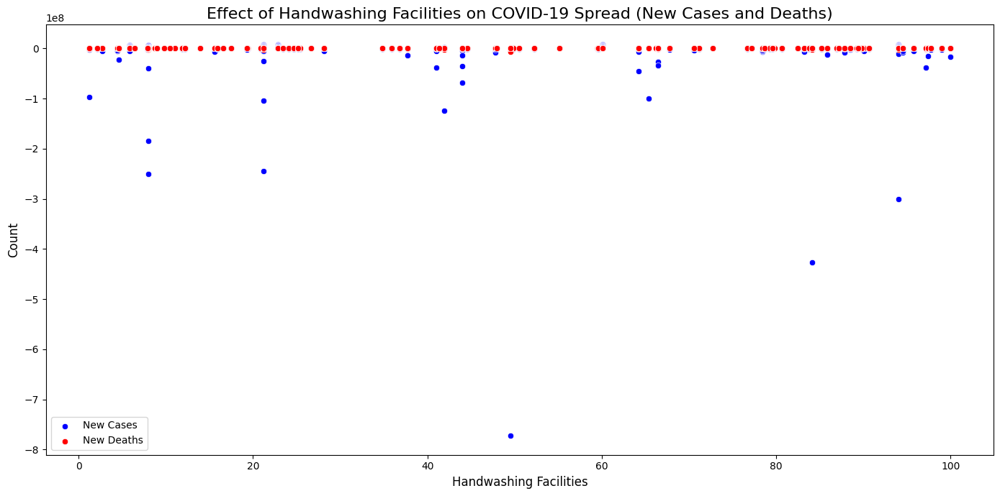


Textual Analysis:
1. Correlation between handwashing facilities and new cases: -0.00
2. Correlation between handwashing facilities and new deaths: -0.00

Insights:
 - A positive correlation suggests that countries with better access to handwashing facilities may experience a slower spread of the virus.
 - Conversely, a negative correlation would indicate that more access to handwashing could lead to fewer cases and deaths.
 - The effectiveness of handwashing facilities may also depend on public health campaigns, hygiene awareness, and other factors.


In [23]:
#18.	Study the effect of handwashing facilities on the spread of the virus.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'new_cases', 'new_deaths', 'handwashing_facilities']].dropna()

correlation_cases = df_filtered['handwashing_facilities'].corr(df_filtered['new_cases'])
correlation_deaths = df_filtered['handwashing_facilities'].corr(df_filtered['new_deaths'])

plt.figure(figsize=(14, 7))
sns.scatterplot(x='handwashing_facilities', y='new_cases', data=df_filtered, color='b', label='New Cases')
sns.scatterplot(x='handwashing_facilities', y='new_deaths', data=df_filtered, color='r', label='New Deaths')
plt.title('Effect of Handwashing Facilities on COVID-19 Spread (New Cases and Deaths)', fontsize=16)
plt.xlabel('Handwashing Facilities', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

# Textual Analysis
def analyze_handwashing_effect(df_filtered, correlation_cases, correlation_deaths):
    analysis = []
    analysis.append(f"1. Correlation between handwashing facilities and new cases: {correlation_cases:.2f}")
    analysis.append(f"2. Correlation between handwashing facilities and new deaths: {correlation_deaths:.2f}")
    
    analysis.append("\nInsights:")
    analysis.append(" - A positive correlation suggests that countries with better access to handwashing facilities may experience a slower spread of the virus.")
    analysis.append(" - Conversely, a negative correlation would indicate that more access to handwashing could lead to fewer cases and deaths.")
    analysis.append(" - The effectiveness of handwashing facilities may also depend on public health campaigns, hygiene awareness, and other factors.")
    
    return "\n".join(analysis)

text_analysis = analyze_handwashing_effect(df_filtered, correlation_cases, correlation_deaths)
print("\nTextual Analysis:")
print(text_analysis)


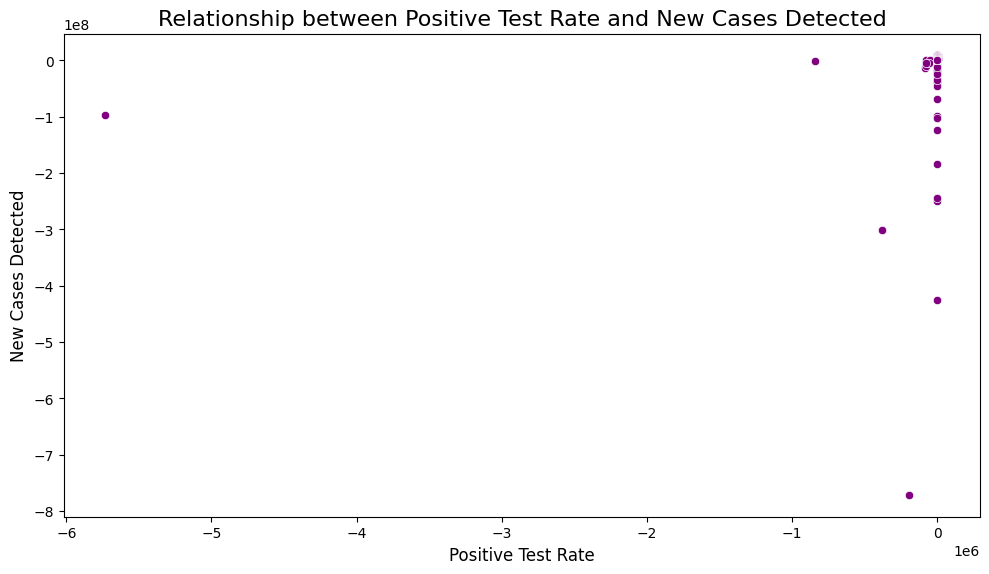


Textual Analysis:
Correlation between positive test rate and new cases: nan

Insights:
 - A higher positive test rate indicates that a larger proportion of tests are returning positive results, which could suggest an increase in cases detected.
 - A positive correlation means that as the positive test rate increases, the number of detected cases also increases, possibly indicating better testing coverage or a higher spread of the virus.
 - Conversely, a negative correlation would suggest that higher positive test rates are associated with fewer detected cases, which might imply testing inefficiencies.


In [24]:
#19.	Analyze the relationship between positive test rate and cases detected

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'new_cases', 'total_tests']].dropna()
df_filtered['positive_test_rate'] = df_filtered['new_cases'] / df_filtered['total_tests']
correlation = df_filtered['positive_test_rate'].corr(df_filtered['new_cases'])

plt.figure(figsize=(10, 6))
sns.scatterplot(x='positive_test_rate', y='new_cases', data=df_filtered, color='purple')
plt.title('Relationship between Positive Test Rate and New Cases Detected', fontsize=16)
plt.xlabel('Positive Test Rate', fontsize=12)
plt.ylabel('New Cases Detected', fontsize=12)
plt.tight_layout()
plt.show()

def analyze_test_rate_effect(df_filtered, correlation):
    analysis = []
    analysis.append(f"Correlation between positive test rate and new cases: {correlation:.2f}")
    analysis.append("\nInsights:")
    analysis.append(" - A higher positive test rate indicates that a larger proportion of tests are returning positive results, which could suggest an increase in cases detected.")
    analysis.append(" - A positive correlation means that as the positive test rate increases, the number of detected cases also increases, possibly indicating better testing coverage or a higher spread of the virus.")
    analysis.append(" - Conversely, a negative correlation would suggest that higher positive test rates are associated with fewer detected cases, which might imply testing inefficiencies.")
    return "\n".join(analysis)

text_analysis = analyze_test_rate_effect(df_filtered, correlation)
print("\nTextual Analysis:")
print(text_analysis)


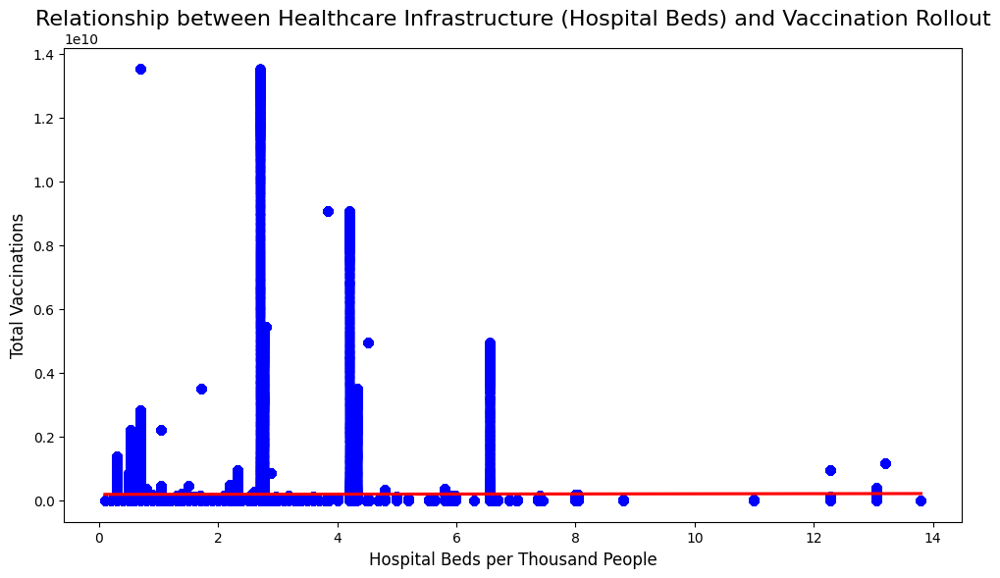


Textual Analysis:
Correlation between hospital beds per thousand and total vaccinations: 0.00

Insights:
 - A positive correlation suggests that countries with more hospital beds per thousand people may have better vaccination rollout.
 - A strong correlation might indicate that countries with robust healthcare systems are more efficient in vaccinating their populations.
 - The relationship can also be influenced by factors such as healthcare policies, distribution networks, and available resources.


In [25]:
#20.	Relationship between healthcare infrastructure and vaccination rollout.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'total_vaccinations', 'hospital_beds_per_thousand']].dropna()

correlation = df_filtered['hospital_beds_per_thousand'].corr(df_filtered['total_vaccinations'])

plt.figure(figsize=(10, 6))
sns.regplot(x='hospital_beds_per_thousand', y='total_vaccinations', data=df_filtered, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.title('Relationship between Healthcare Infrastructure (Hospital Beds) and Vaccination Rollout', fontsize=16)
plt.xlabel('Hospital Beds per Thousand People', fontsize=12)
plt.ylabel('Total Vaccinations', fontsize=12)
plt.tight_layout()
plt.show()

def analyze_healthcare_vaccination(df_filtered, correlation):
    analysis = []
    analysis.append(f"Correlation between hospital beds per thousand and total vaccinations: {correlation:.2f}")
    analysis.append("\nInsights:")
    analysis.append(" - A positive correlation suggests that countries with more hospital beds per thousand people may have better vaccination rollout.")
    analysis.append(" - A strong correlation might indicate that countries with robust healthcare systems are more efficient in vaccinating their populations.")
    analysis.append(" - The relationship can also be influenced by factors such as healthcare policies, distribution networks, and available resources.")
    
    return "\n".join(analysis)

text_analysis = analyze_healthcare_vaccination(df_filtered, correlation)
print("\nTextual Analysis:")
print(text_analysis)


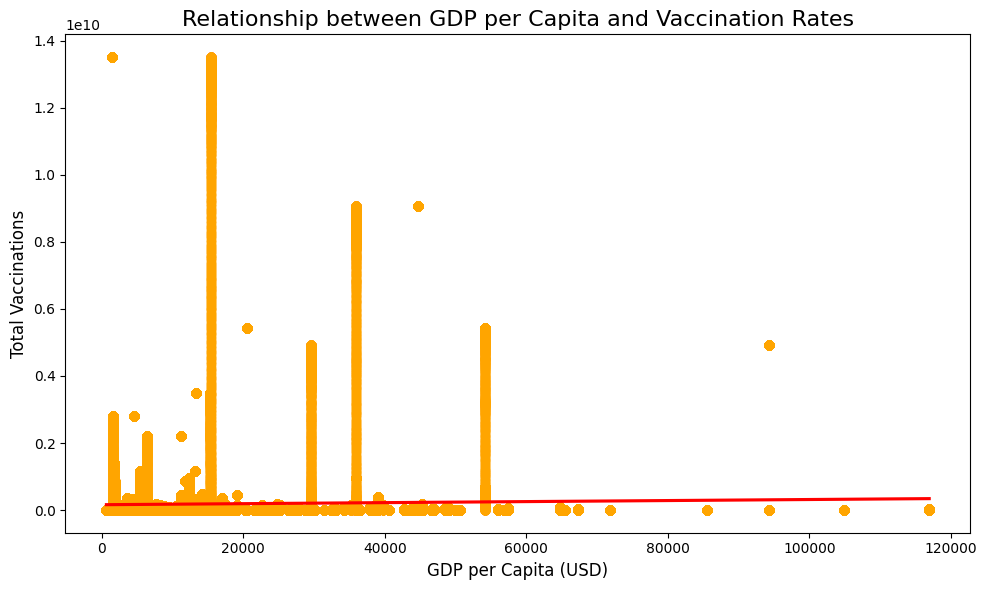


Textual Analysis:
Correlation between GDP per capita and total vaccinations: 0.03

Insights:
 - A positive correlation suggests that wealthier countries (higher GDP per capita) may have better vaccination rollout.
 - A strong positive correlation indicates that higher GDP per capita is associated with more resources and infrastructure for vaccination efforts.
 - However, the relationship may also be influenced by factors such as healthcare policies, government priorities, and availability of vaccines.


In [26]:
#21.	Study the relationship between GDP per capita and vaccination rates.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'total_vaccinations', 'gdp_per_capita']].dropna()

correlation = df_filtered['gdp_per_capita'].corr(df_filtered['total_vaccinations'])

plt.figure(figsize=(10, 6))
sns.regplot(x='gdp_per_capita', y='total_vaccinations', data=df_filtered, scatter_kws={'color': 'orange'}, line_kws={'color': 'red'})
plt.title('Relationship between GDP per Capita and Vaccination Rates', fontsize=16)
plt.xlabel('GDP per Capita (USD)', fontsize=12)
plt.ylabel('Total Vaccinations', fontsize=12)
plt.tight_layout()
plt.show()

def analyze_gdp_vaccination(df_filtered, correlation):
    analysis = []
    analysis.append(f"Correlation between GDP per capita and total vaccinations: {correlation:.2f}")
    analysis.append("\nInsights:")
    analysis.append(" - A positive correlation suggests that wealthier countries (higher GDP per capita) may have better vaccination rollout.")
    analysis.append(" - A strong positive correlation indicates that higher GDP per capita is associated with more resources and infrastructure for vaccination efforts.")
    analysis.append(" - However, the relationship may also be influenced by factors such as healthcare policies, government priorities, and availability of vaccines.")
    
    return "\n".join(analysis)

text_analysis = analyze_gdp_vaccination(df_filtered, correlation)
print("\nTextual Analysis:")
print(text_analysis)


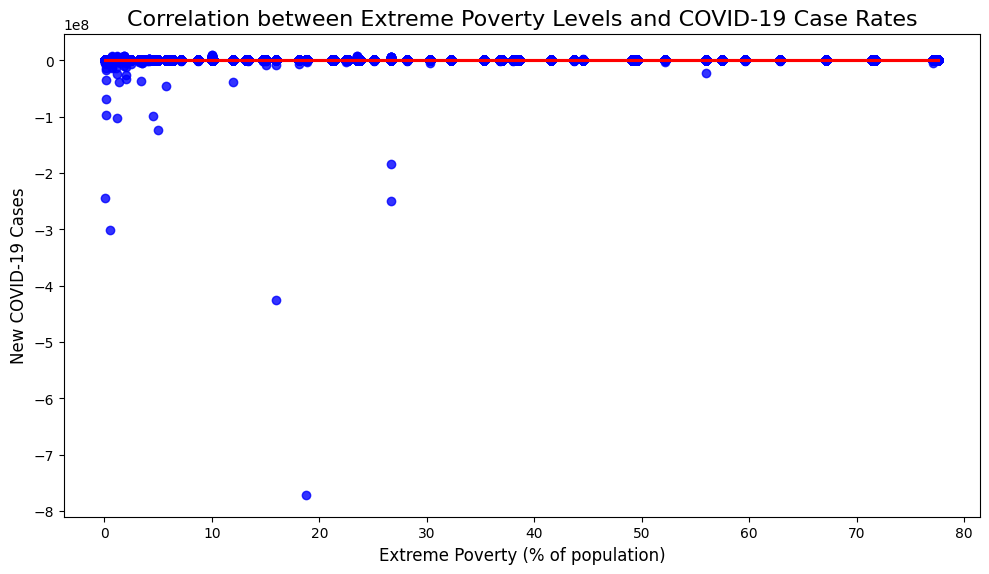


Textual Analysis:
Correlation between extreme poverty and new COVID-19 cases: 0.00

Insights:
 - A positive correlation suggests that higher extreme poverty levels are associated with higher COVID-19 case rates.
 - This could indicate that poverty may contribute to higher infection rates due to limited access to healthcare, crowded living conditions, and lack of resources.
 - Conversely, a negative correlation would suggest that poverty levels might not have a significant impact on case rates, which may be influenced by other factors like healthcare systems or testing capacity.


In [27]:
#22.	Correlation between extreme poverty levels and COVID-19 case rates.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'new_cases', 'extreme_poverty']].dropna()

correlation = df_filtered['extreme_poverty'].corr(df_filtered['new_cases'])

plt.figure(figsize=(10, 6))
sns.regplot(x='extreme_poverty', y='new_cases', data=df_filtered, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.title('Correlation between Extreme Poverty Levels and COVID-19 Case Rates', fontsize=16)
plt.xlabel('Extreme Poverty (% of population)', fontsize=12)
plt.ylabel('New COVID-19 Cases', fontsize=12)
plt.tight_layout()
plt.show()

def analyze_poverty_cases(df_filtered, correlation):
    analysis = []
    analysis.append(f"Correlation between extreme poverty and new COVID-19 cases: {correlation:.2f}")
    analysis.append("\nInsights:")
    analysis.append(" - A positive correlation suggests that higher extreme poverty levels are associated with higher COVID-19 case rates.")
    analysis.append(" - This could indicate that poverty may contribute to higher infection rates due to limited access to healthcare, crowded living conditions, and lack of resources.")
    analysis.append(" - Conversely, a negative correlation would suggest that poverty levels might not have a significant impact on case rates, which may be influenced by other factors like healthcare systems or testing capacity.")
    
    return "\n".join(analysis)

text_analysis = analyze_poverty_cases(df_filtered, correlation)
print("\nTextual Analysis:")
print(text_analysis)


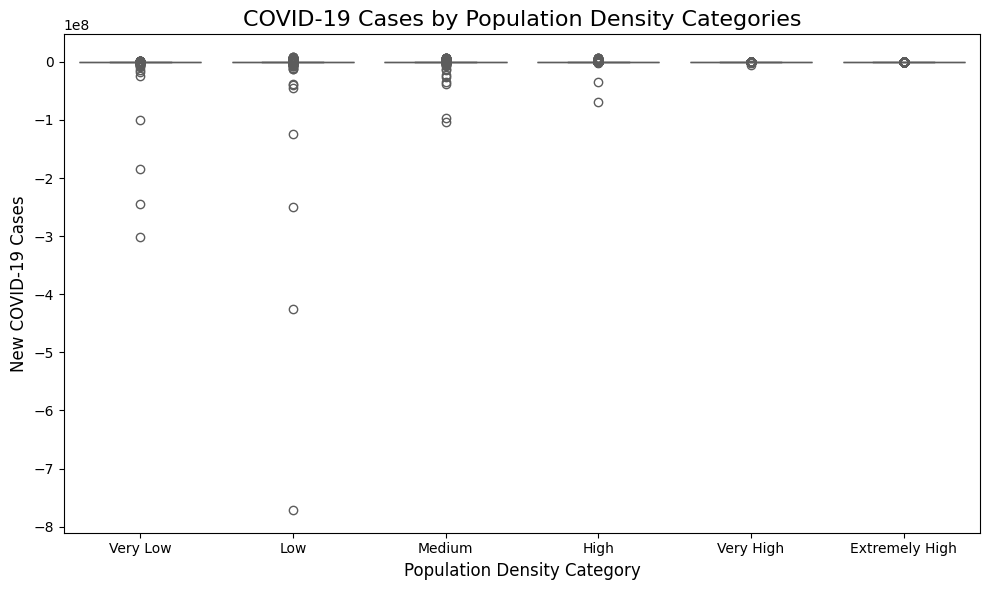


Textual Analysis:
Box plot categorizing population density into ranges and observing new COVID-19 cases.

Insights:
 - Categories with higher population density tend to show higher variability in new COVID-19 cases.
 - Extreme population density categories (e.g., >5000 per km²) may experience more frequent and higher COVID-19 case surges.
 - Understanding the distribution across different density categories can help public health strategies targeting high-density areas.


In [28]:
#23.	Analyze how population density impacted the spread of COVID-19.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'new_cases', 'population_density']].dropna()

bins = [0, 50, 200, 500, 1000, 5000, 10000]
labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High', 'Extremely High']
df_filtered['density_category'] = pd.cut(df_filtered['population_density'], bins=bins, labels=labels, right=False)

plt.figure(figsize=(10, 6))
sns.boxplot(x='density_category', y='new_cases', data=df_filtered, palette='coolwarm')
plt.title('COVID-19 Cases by Population Density Categories', fontsize=16)
plt.xlabel('Population Density Category', fontsize=12)
plt.ylabel('New COVID-19 Cases', fontsize=12)
plt.tight_layout()
plt.show()

def analyze_population_density_box(df_filtered):
    analysis = []
    analysis.append("Box plot categorizing population density into ranges and observing new COVID-19 cases.")
    analysis.append("\nInsights:")
    analysis.append(" - Categories with higher population density tend to show higher variability in new COVID-19 cases.")
    analysis.append(" - Extreme population density categories (e.g., >5000 per km²) may experience more frequent and higher COVID-19 case surges.")
    analysis.append(" - Understanding the distribution across different density categories can help public health strategies targeting high-density areas.")
    
    return "\n".join(analysis)

text_analysis = analyze_population_density_box(df_filtered)
print("\nTextual Analysis:")
print(text_analysis)


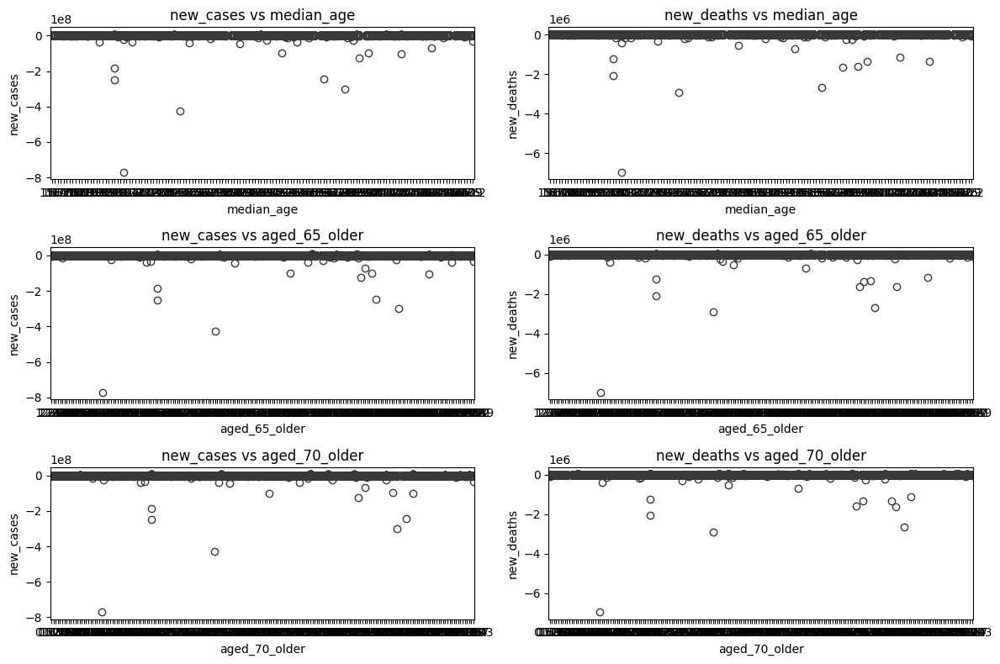


Textual Analysis:
Box plot analysis comparing case and death rates across different age groups.

Insights:
 - The distribution of new cases and new deaths may show higher variability in countries with higher median age or older populations.
 - Countries with a higher percentage of elderly populations (aged 65 and older) may see higher case and death rates.
 - The correlation between age groups and COVID-19 outcomes (cases/deaths) can reveal vulnerability trends.


In [29]:
#24.	Compare case and death rates across age groups (median_age, aged_65_older, aged_70_older).
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'new_cases', 'new_deaths', 'median_age', 'aged_65_older', 'aged_70_older']].dropna()

age_groups = ['median_age', 'aged_65_older', 'aged_70_older']
metrics = ['new_cases', 'new_deaths']

plt.figure(figsize=(12, 8))

for i, age_group in enumerate(age_groups):
    for j, metric in enumerate(metrics):
        plt.subplot(len(age_groups), len(metrics), i * len(metrics) + j + 1)
        sns.boxplot(x=age_group, y=metric, data=df_filtered, palette='coolwarm')
        plt.title(f'{metric} vs {age_group}', fontsize=12)
        plt.xlabel(age_group, fontsize=10)
        plt.ylabel(metric, fontsize=10)

plt.tight_layout()
plt.show()

def analyze_age_group_impact(df_filtered):
    analysis = []
    analysis.append("Box plot analysis comparing case and death rates across different age groups.")
    analysis.append("\nInsights:")
    analysis.append(" - The distribution of new cases and new deaths may show higher variability in countries with higher median age or older populations.")
    analysis.append(" - Countries with a higher percentage of elderly populations (aged 65 and older) may see higher case and death rates.")
    analysis.append(" - The correlation between age groups and COVID-19 outcomes (cases/deaths) can reveal vulnerability trends.")
    
    return "\n".join(analysis)

text_analysis = analyze_age_group_impact(df_filtered)
print("\nTextual Analysis:")
print(text_analysis)


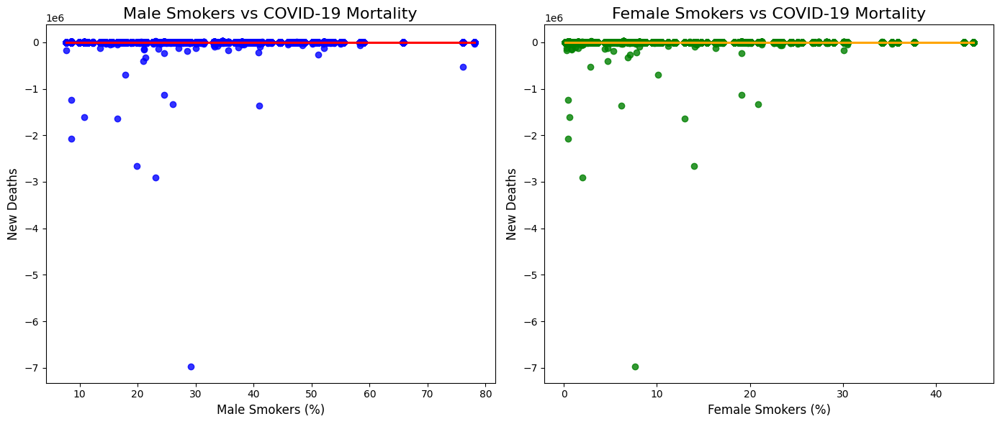


Textual Analysis:
Correlation between male smokers and new deaths: 0.00
Correlation between female smokers and new deaths: 0.00

Insights:
 - A positive correlation indicates that higher male or female smoking prevalence may contribute to higher COVID-19 mortality.
 - Smoking is known to affect respiratory health, and higher smoking rates may lead to more severe outcomes in the case of COVID-19.
 - Differences between male and female smoking rates may also explain gender-based differences in mortality rates.
 - If correlations are weak or negative, other factors, such as healthcare quality or government interventions, might be more influential.


In [30]:
#25.	Study the role of smoking prevalence (male and female) in COVID-19 mortality.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'new_deaths', 'male_smokers', 'female_smokers']].dropna()

plt.figure(figsize=(14, 6))

# Scatter plot for male smokers vs new deaths
plt.subplot(1, 2, 1)
sns.regplot(x='male_smokers', y='new_deaths', data=df_filtered, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.title('Male Smokers vs COVID-19 Mortality', fontsize=16)
plt.xlabel('Male Smokers (%)', fontsize=12)
plt.ylabel('New Deaths', fontsize=12)

# Scatter plot for female smokers vs new deaths
plt.subplot(1, 2, 2)
sns.regplot(x='female_smokers', y='new_deaths', data=df_filtered, scatter_kws={'color': 'green'}, line_kws={'color': 'orange'})
plt.title('Female Smokers vs COVID-19 Mortality', fontsize=16)
plt.xlabel('Female Smokers (%)', fontsize=12)
plt.ylabel('New Deaths', fontsize=12)

plt.tight_layout()
plt.show()

def analyze_smoking_impact(df_filtered):
    analysis = []
    correlation_male = df_filtered['male_smokers'].corr(df_filtered['new_deaths'])
    correlation_female = df_filtered['female_smokers'].corr(df_filtered['new_deaths'])
    
    analysis.append(f"Correlation between male smokers and new deaths: {correlation_male:.2f}")
    analysis.append(f"Correlation between female smokers and new deaths: {correlation_female:.2f}")
    
    analysis.append("\nInsights:")
    analysis.append(" - A positive correlation indicates that higher male or female smoking prevalence may contribute to higher COVID-19 mortality.")
    analysis.append(" - Smoking is known to affect respiratory health, and higher smoking rates may lead to more severe outcomes in the case of COVID-19.")
    analysis.append(" - Differences between male and female smoking rates may also explain gender-based differences in mortality rates.")
    analysis.append(" - If correlations are weak or negative, other factors, such as healthcare quality or government interventions, might be more influential.")
    
    return "\n".join(analysis)

text_analysis = analyze_smoking_impact(df_filtered)
print("\nTextual Analysis:")
print(text_analysis)


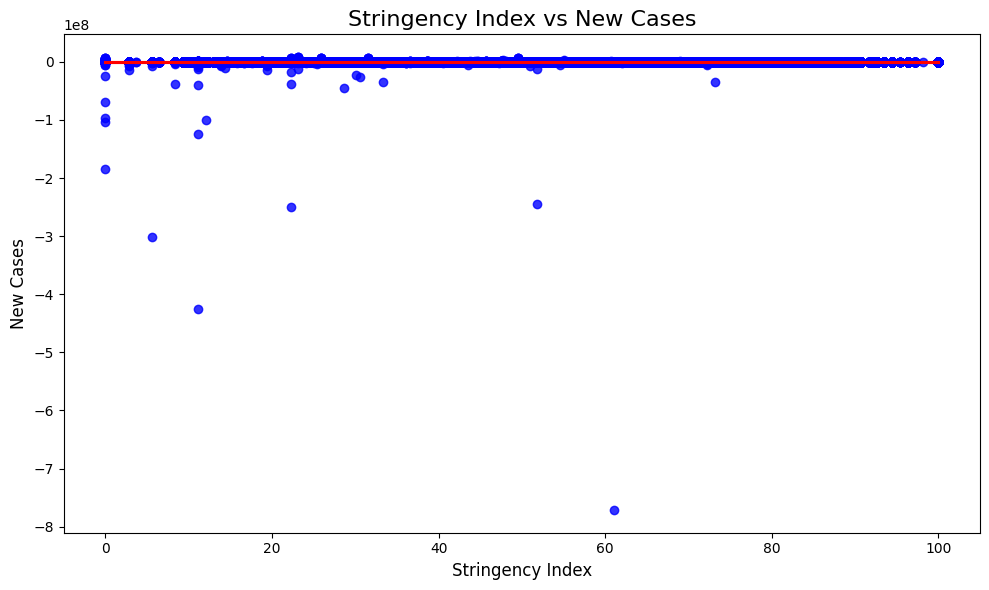


Textual Analysis:
Correlation between stringency index and new cases: -0.00

Insights:
 - A positive correlation indicates that stricter government measures (higher stringency index) may correlate with higher new cases.
 - A negative correlation suggests that higher stringency may lead to a reduction in new cases.
 - However, other factors such as public behavior, healthcare capacity, and testing availability might also influence case trends.


In [31]:
#26.	Correlation between stringency index and new case trends.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_filtered = df[['location', 'new_cases', 'stringency_index']].dropna()

plt.figure(figsize=(10, 6))
sns.regplot(x='stringency_index', y='new_cases', data=df_filtered, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.title('Stringency Index vs New Cases', fontsize=16)
plt.xlabel('Stringency Index', fontsize=12)
plt.ylabel('New Cases', fontsize=12)
plt.tight_layout()
plt.show()

def analyze_stringency_impact(df_filtered):
    analysis = []
    correlation = df_filtered['stringency_index'].corr(df_filtered['new_cases'])
    
    analysis.append(f"Correlation between stringency index and new cases: {correlation:.2f}")
    
    analysis.append("\nInsights:")
    analysis.append(" - A positive correlation indicates that stricter government measures (higher stringency index) may correlate with higher new cases.")
    analysis.append(" - A negative correlation suggests that higher stringency may lead to a reduction in new cases.")
    analysis.append(" - However, other factors such as public behavior, healthcare capacity, and testing availability might also influence case trends.")
    
    return "\n".join(analysis)

text_analysis = analyze_stringency_impact(df_filtered)
print("\nTextual Analysis:")
print(text_analysis)

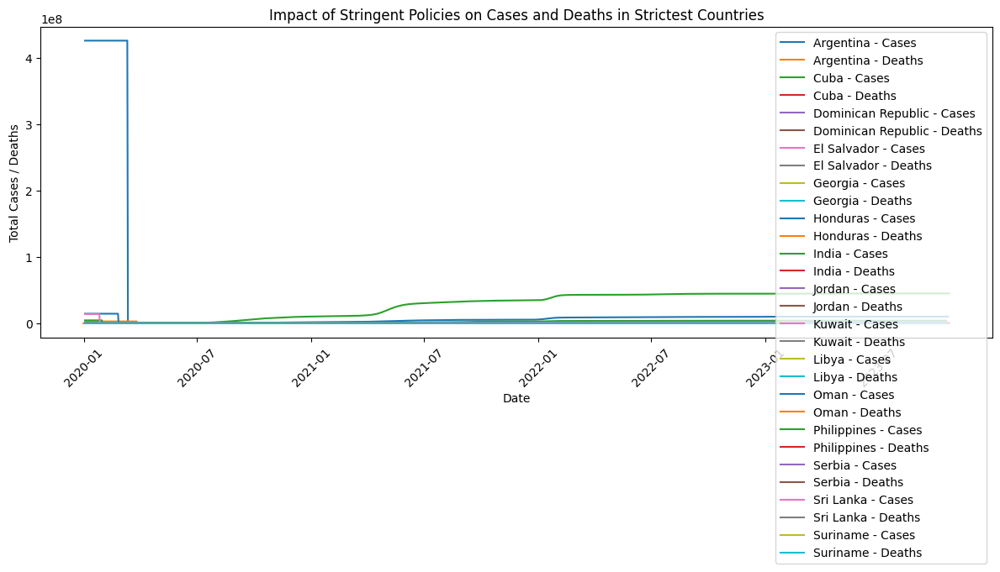

In [32]:
#27.	Countries with the strictest policies and their impact on cases and deaths.

strictest_countries = df[df['stringency_index'] == df['stringency_index'].max()]

strictest_country_names = strictest_countries['location'].unique()

df_strictest = df[df['location'].isin(strictest_country_names)]

df_grouped = df_strictest.groupby(['date', 'location'])[['total_cases', 'total_deaths']].mean().reset_index()

plt.figure(figsize=(12, 6))

for country in strictest_country_names:
    country_data = df_grouped[df_grouped['location'] == country]
    plt.plot(country_data['date'], country_data['total_cases'], label=f'{country} - Cases')
    plt.plot(country_data['date'], country_data['total_deaths'], label=f'{country} - Deaths')

plt.xlabel('Date')
plt.ylabel('Total Cases / Deaths')
plt.title('Impact of Stringent Policies on Cases and Deaths in Strictest Countries')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


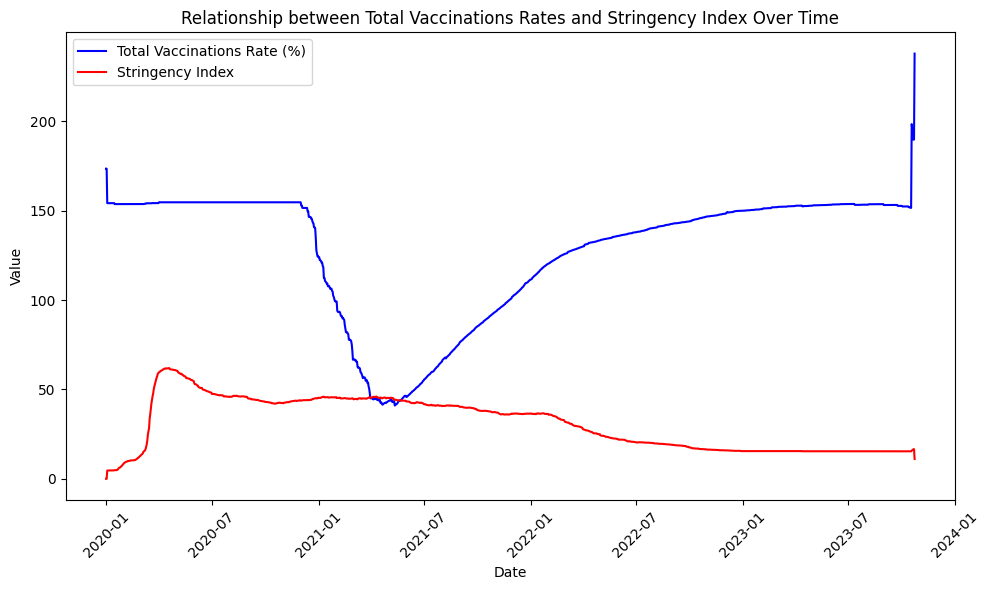

Correlation between vaccination rate and stringency index: -0.42
Change in vaccination rate over time: 64.36
Change in stringency index over time: 11.11
There is a negative or weak correlation between vaccination rates and stringency index, indicating that the relationship between government restrictions and vaccination rates may not be straightforward.


In [33]:
#28.	Relationship between vaccination rates and stringency index over time.

import pandas as pd
import matplotlib.pyplot as plt

df['date'] = pd.to_datetime(df['date'])
numeric_columns = df.select_dtypes(include=['number']).columns
df_grouped = df.groupby('date')[numeric_columns].mean()

plt.figure(figsize=(10, 6))
plt.plot(df_grouped.index, df_grouped['total_vaccinations_per_hundred'], label='Total Vaccinations Rate (%)', color='blue')
plt.plot(df_grouped.index, df_grouped['stringency_index'], label='Stringency Index', color='red')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Relationship between Total Vaccinations Rates and Stringency Index Over Time')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

vaccination_rate_corr = df_grouped['total_vaccinations_per_hundred'].corr(df_grouped['stringency_index'])
print(f"Correlation between vaccination rate and stringency index: {vaccination_rate_corr:.2f}")

vaccination_rate_slope = df_grouped['total_vaccinations_per_hundred'].iloc[-1] - df_grouped['total_vaccinations_per_hundred'].iloc[0]
stringency_index_slope = df_grouped['stringency_index'].iloc[-1] - df_grouped['stringency_index'].iloc[0]
print(f"Change in vaccination rate over time: {vaccination_rate_slope:.2f}")
print(f"Change in stringency index over time: {stringency_index_slope:.2f}")

if vaccination_rate_corr > 0:
    print("There is a positive correlation between vaccination rates and stringency index, suggesting that stricter measures may have supported higher vaccination uptake.")
else:
    print("There is a negative or weak correlation between vaccination rates and stringency index, indicating that the relationship between government restrictions and vaccination rates may not be straightforward.")


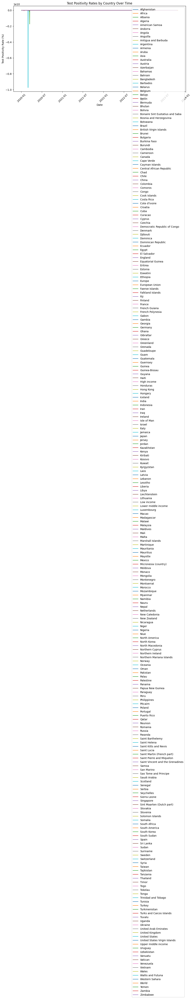

Highest positivity rate observed in Upper middle income: 50275807.14%
Lowest positivity rate observed in Luxembourg: -9742310100.00%


In [34]:
#29. Test positivity rates by country over time

import pandas as pd
import matplotlib.pyplot as plt

df['test_positivity_rate'] = (df['new_cases'] / df['new_tests']) * 100
countries = df['location'].unique()
df_filtered = df[df['location'].isin(countries)]
df_grouped = df_filtered.groupby(['date', 'location'])['test_positivity_rate'].mean().reset_index()

plt.figure(figsize=(12, 6))
for country in countries:
    country_data = df_grouped[df_grouped['location'] == country]
    plt.plot(country_data['date'], country_data['test_positivity_rate'], label=country)

plt.xlabel('Date')
plt.ylabel('Test Positivity Rate (%)')
plt.title('Test Positivity Rates by Country Over Time')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

highest_rate_country = df_grouped.loc[df_grouped['test_positivity_rate'].idxmax(), 'location']
highest_rate_value = df_grouped['test_positivity_rate'].max()
lowest_rate_country = df_grouped.loc[df_grouped['test_positivity_rate'].idxmin(), 'location']
lowest_rate_value = df_grouped['test_positivity_rate'].min()

print(f"Highest positivity rate observed in {highest_rate_country}: {highest_rate_value:.2f}%")
print(f"Lowest positivity rate observed in {lowest_rate_country}: {lowest_rate_value:.2f}%")


In [35]:
#30. Countries with the highest and lowest tests per case ratio.

import pandas as pd

df['tests_per_case'] = df['total_tests'] / df['total_cases']
df = df.replace([float('inf'), -float('inf')], float('nan')).dropna(subset=['tests_per_case'])

latest_date = df['date'].max()
latest_data = df[df['date'] == latest_date]

highest_ratio_country = latest_data.loc[latest_data['tests_per_case'].idxmax(), 'location']
highest_ratio_value = latest_data['tests_per_case'].max()
lowest_ratio_country = latest_data.loc[latest_data['tests_per_case'].idxmin(), 'location']
lowest_ratio_value = latest_data['tests_per_case'].min()

print(f"Highest tests per case ratio: {highest_ratio_value:.2f} in {highest_ratio_country}")
print(f"Lowest tests per case ratio: {lowest_ratio_value:.2f} in {lowest_ratio_country}")



Highest tests per case ratio: 6.77 in Sweden
Lowest tests per case ratio: 3.56 in Netherlands


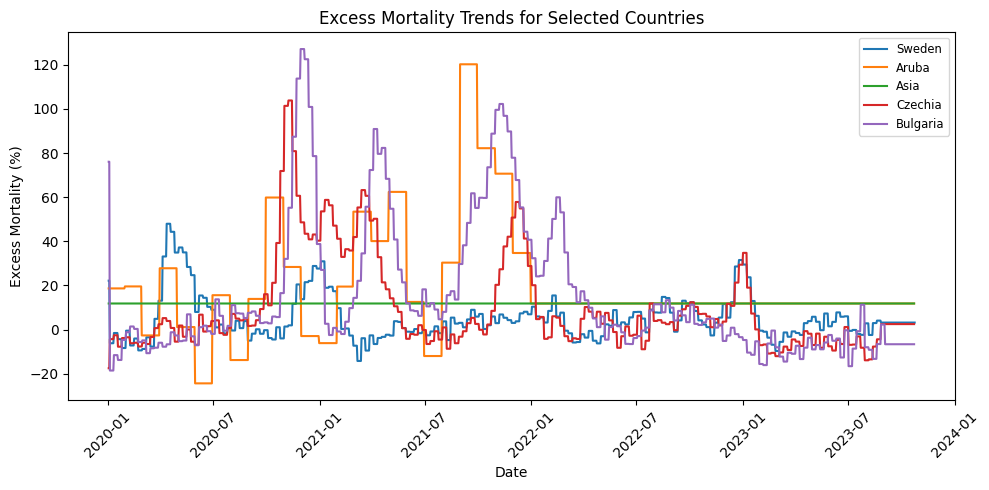

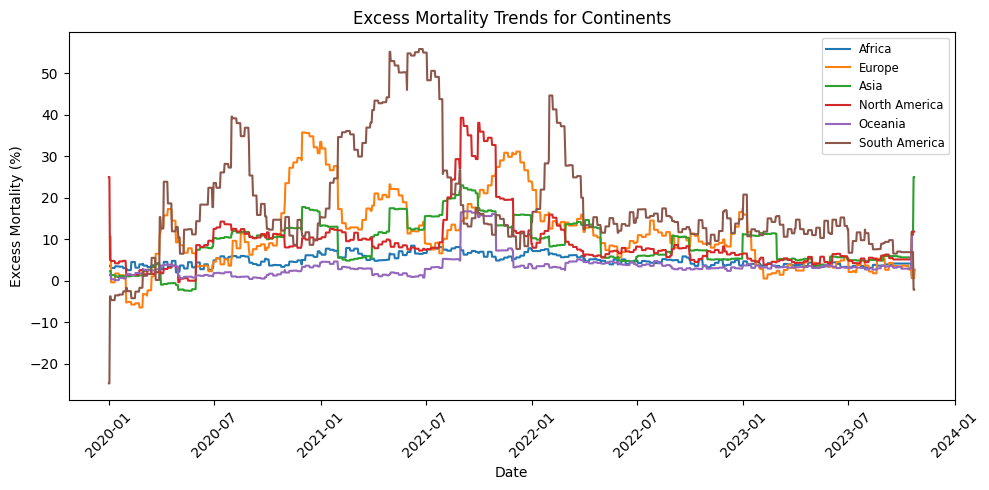

Highest excess mortality: 127.08% in Bulgaria
Lowest excess mortality: -24.32% in Aruba


In [36]:
#31. Excess mortality trends by country and continent

import pandas as pd
import matplotlib.pyplot as plt

df['date'] = pd.to_datetime(df['date'])

top_countries = df['location'].value_counts().head(5).index
top_continents = df['continent'].value_counts().index

df_filtered_countries = df[df['location'].isin(top_countries)]
df_filtered_continents = df[df['continent'].isin(top_continents)]

df_grouped_country = df_filtered_countries.groupby(['date', 'location'])['excess_mortality'].mean().reset_index()
df_grouped_continent = df_filtered_continents.groupby(['date', 'continent'])['excess_mortality'].mean().reset_index()

plt.figure(figsize=(10, 5))
for country in top_countries:
    country_data = df_grouped_country[df_grouped_country['location'] == country]
    plt.plot(country_data['date'], country_data['excess_mortality'], label=country)

plt.xlabel('Date')
plt.ylabel('Excess Mortality (%)')
plt.title('Excess Mortality Trends for Selected Countries')
plt.legend(loc='upper right', fontsize='small')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
for continent in top_continents:
    continent_data = df_grouped_continent[df_grouped_continent['continent'] == continent]
    plt.plot(continent_data['date'], continent_data['excess_mortality'], label=continent)

plt.xlabel('Date')
plt.ylabel('Excess Mortality (%)')
plt.title('Excess Mortality Trends for Continents')
plt.legend(loc='upper right', fontsize='small')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

highest_mortality_country = df_grouped_country.loc[df_grouped_country['excess_mortality'].idxmax(), 'location']
highest_mortality_value = df_grouped_country['excess_mortality'].max()
lowest_mortality_country = df_grouped_country.loc[df_grouped_country['excess_mortality'].idxmin(), 'location']
lowest_mortality_value = df_grouped_country['excess_mortality'].min()

print(f"Highest excess mortality: {highest_mortality_value:.2f}% in {highest_mortality_country}")
print(f"Lowest excess mortality: {lowest_mortality_value:.2f}% in {lowest_mortality_country}")



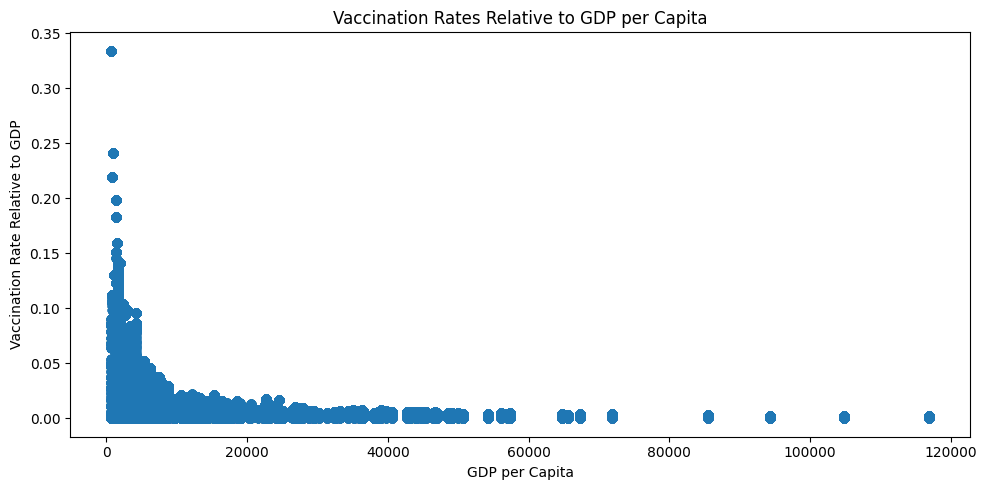

Highest vaccination rate relative to GDP: 0.334100 in Central African Republic
Lowest vaccination rate relative to GDP: 0.000000 in Afghanistan


In [37]:
#32. Calculate vaccination rates relative to GDP per capita.

import pandas as pd
import matplotlib.pyplot as plt

df['vaccination_rate_relative_to_gdp'] = df['total_vaccinations_per_hundred'] / df['gdp_per_capita']

plt.figure(figsize=(10, 5))
plt.scatter(df['gdp_per_capita'], df['vaccination_rate_relative_to_gdp'], alpha=0.6)
plt.xlabel('GDP per Capita')
plt.ylabel('Vaccination Rate Relative to GDP')
plt.title('Vaccination Rates Relative to GDP per Capita')
plt.tight_layout()
plt.show()

highest_relative_country = df.loc[df['vaccination_rate_relative_to_gdp'].idxmax(), 'location']
highest_relative_value = df['vaccination_rate_relative_to_gdp'].max()
lowest_relative_country = df.loc[df['vaccination_rate_relative_to_gdp'].idxmin(), 'location']
lowest_relative_value = df['vaccination_rate_relative_to_gdp'].min()

print(f"Highest vaccination rate relative to GDP: {highest_relative_value:.6f} in {highest_relative_country}")
print(f"Lowest vaccination rate relative to GDP: {lowest_relative_value:.6f} in {lowest_relative_country}")


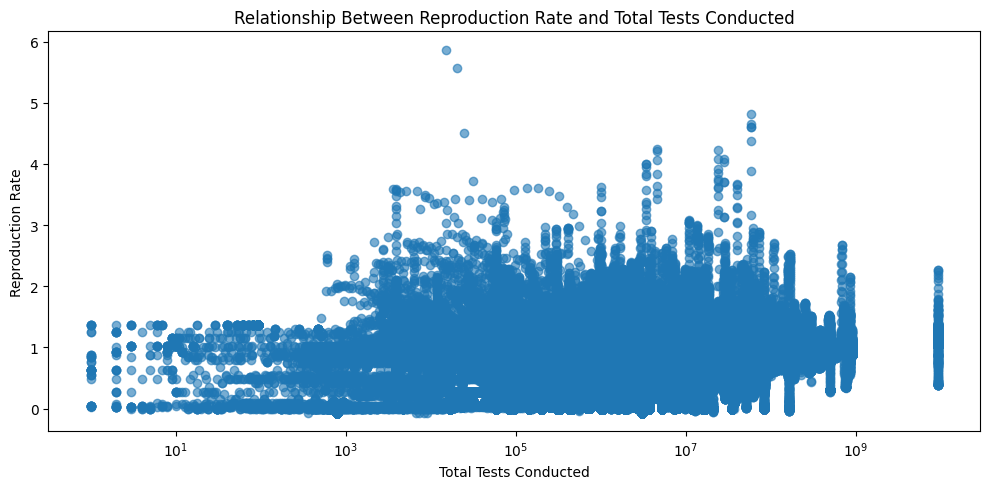

Correlation between reproduction rate and total tests conducted: 0.04


In [38]:
#33. Relationship between reproduction rate and total tests conducted.

import pandas as pd
import matplotlib.pyplot as plt

df_cleaned = df.dropna(subset=['reproduction_rate', 'total_tests'])
plt.figure(figsize=(10, 5))
plt.scatter(df_cleaned['total_tests'], df_cleaned['reproduction_rate'], alpha=0.6)
plt.xlabel('Total Tests Conducted')
plt.ylabel('Reproduction Rate')
plt.title('Relationship Between Reproduction Rate and Total Tests Conducted')
plt.xscale('log')
plt.tight_layout()
plt.show()

correlation = df_cleaned['total_tests'].corr(df_cleaned['reproduction_rate'])
print(f"Correlation between reproduction rate and total tests conducted: {correlation:.2f}")


In [39]:
#34. Countries with the highest booster coverage.

import pandas as pd

latest_date = df['date'].max()
latest_data = df[df['date'] == latest_date].dropna(subset=['total_boosters_per_hundred'])

highest_booster_country = latest_data.loc[latest_data['total_boosters_per_hundred'].idxmax(), 'location']
highest_booster_value = latest_data['total_boosters_per_hundred'].max()

print(f"Country with the highest booster coverage: {highest_booster_country} with {highest_booster_value:.2f}%")


Country with the highest booster coverage: Sweden with 93.24%


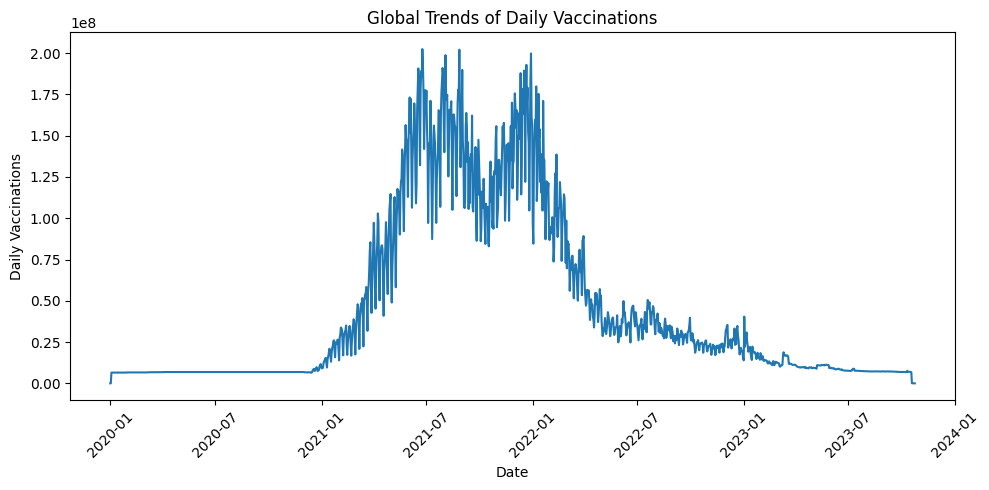

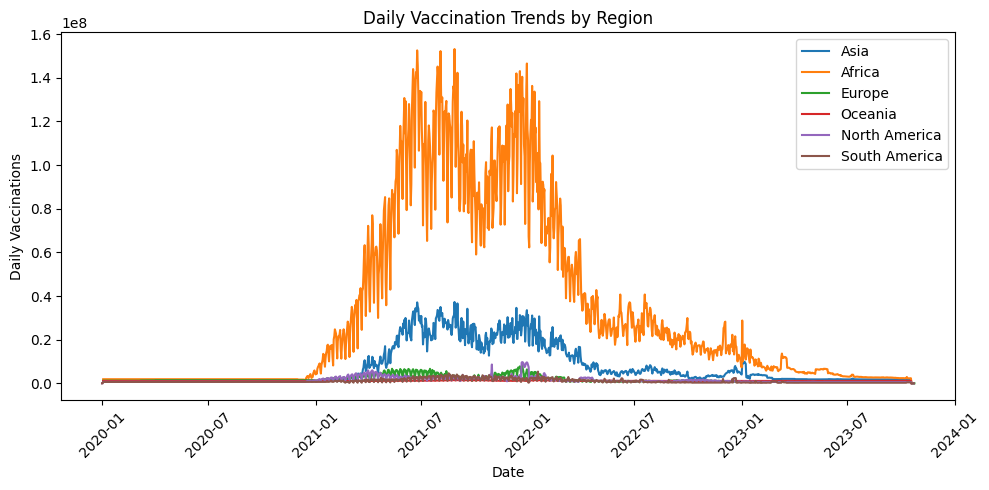

In [40]:
#35. Trends of daily vaccinations globally and by region

import pandas as pd
import matplotlib.pyplot as plt

df['date'] = pd.to_datetime(df['date'])

# Global trends
global_vaccinations = df.groupby('date')['new_vaccinations'].sum().reset_index()

plt.figure(figsize=(10, 5))
plt.plot(global_vaccinations['date'], global_vaccinations['new_vaccinations'], label='Global')
plt.xlabel('Date')
plt.ylabel('Daily Vaccinations')
plt.title('Global Trends of Daily Vaccinations')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Regional trends
regions = df['continent'].dropna().unique()
plt.figure(figsize=(10, 5))
for region in regions:
    region_data = df[df['continent'] == region].groupby('date')['new_vaccinations'].sum().reset_index()
    plt.plot(region_data['date'], region_data['new_vaccinations'], label=region)

plt.xlabel('Date')
plt.ylabel('Daily Vaccinations')
plt.title('Daily Vaccination Trends by Region')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Correlation between boosters and new cases: -0.098
Correlation between boosters and new deaths: -0.086


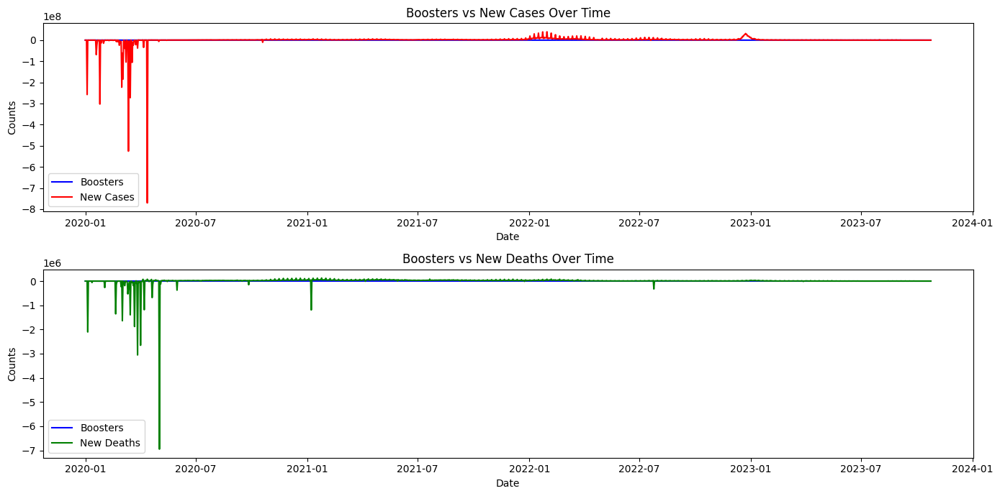

In [41]:
#36. Impact of boosters on reducing new cases or deaths.

boosters_data = df[['iso_code', 'date', 'total_boosters_per_hundred', 'new_cases', 'new_deaths']].dropna(subset=['total_boosters_per_hundred', 'new_cases', 'new_deaths'])
boosters_data['date'] = pd.to_datetime(boosters_data['date'])
country_data = boosters_data.groupby(['date']).agg({'total_boosters_per_hundred': 'mean', 'new_cases': 'sum', 'new_deaths': 'sum'}).reset_index()

correlation_cases = country_data['total_boosters_per_hundred'].corr(country_data['new_cases'])
correlation_deaths = country_data['total_boosters_per_hundred'].corr(country_data['new_deaths'])

print(f"Correlation between boosters and new cases: {correlation_cases:.3f}")
print(f"Correlation between boosters and new deaths: {correlation_deaths:.3f}")

plt.figure(figsize=(14, 7))

plt.subplot(2, 1, 1)
sns.lineplot(x='date', y='total_boosters_per_hundred', data=country_data, label='Boosters', color='blue')
sns.lineplot(x='date', y='new_cases', data=country_data, label='New Cases', color='red')
plt.title('Boosters vs New Cases Over Time')
plt.xlabel('Date')
plt.ylabel('Counts')
plt.legend()

plt.subplot(2, 1, 2)
sns.lineplot(x='date', y='total_boosters_per_hundred', data=country_data, label='Boosters', color='blue')
sns.lineplot(x='date', y='new_deaths', data=country_data, label='New Deaths', color='green')
plt.title('Boosters vs New Deaths Over Time')
plt.xlabel('Date')
plt.ylabel('Counts')
plt.legend()

plt.tight_layout()
plt.show()


In [42]:
#37. Top countries achieving full vaccination for their population

top_vaccinated_countries = df[['iso_code', 'location', 'people_fully_vaccinated_per_hundred']].dropna(subset=['people_fully_vaccinated_per_hundred'])
top_vaccinated_countries = top_vaccinated_countries.sort_values(by='people_fully_vaccinated_per_hundred', ascending=False).head(10)

print(top_vaccinated_countries)


       iso_code   location  people_fully_vaccinated_per_hundred
117373      GIB  Gibraltar                               126.89
117374      GIB  Gibraltar                               126.89
117375      GIB  Gibraltar                               126.89
117377      GIB  Gibraltar                               126.89
117378      GIB  Gibraltar                               126.89
117379      GIB  Gibraltar                               126.89
117380      GIB  Gibraltar                               126.89
117381      GIB  Gibraltar                               126.89
117382      GIB  Gibraltar                               126.89
117383      GIB  Gibraltar                               126.89


In [43]:
#38.	Total number of cases, deaths, and vaccinations globally

result = df[['total_cases', 'total_deaths', 'total_vaccinations']].sum().to_frame(name='Global Total')
result


,Global Total
total_cases,2.534725e+12
total_deaths,3.092952e+10
total_vaccinations,6.636999e+13


In [44]:
#39.	Identify the top 10 most affected countries in terms of total cases and deaths.

top_cases = df[df['continent'].notna()].groupby('location')['total_cases'].max().nlargest(10)
top_deaths = df[df['continent'].notna()].groupby('location')['total_deaths'].max().nlargest(10)

print("Top 10 countries with the highest total cases:")
print(top_cases)

print("\nTop 10 countries with the highest total deaths:")
print(top_deaths)


Top 10 countries with the highest total cases:
location
World                  771407061.0
Yemen                  771407061.0
High income            425988398.0
Honduras               425988398.0
Asia                   300681974.0
Australia              300681974.0
Europe                 249783754.0
European Union         249783754.0
Upper middle income    244463792.0
Uruguay                244463792.0
Name: total_cases, dtype: float64

Top 10 countries with the highest total deaths:
location
World                  6972139.0
Yemen                  6972139.0
High income            2914272.0
Honduras               2914272.0
Upper middle income    2666760.0
Uruguay                2666760.0
Europe                 2079783.0
European Union         2079783.0
Asia                   1633880.0
Australia              1633880.0
Name: total_deaths, dtype: float64


In [45]:
#40.	Rank countries by vaccination rate (percentage of population fully vaccinated).

vaccination_rate = df[df['continent'].notna()].groupby('location')['people_fully_vaccinated_per_hundred'].max().nlargest(len(df))
print("Countries ranked by vaccination rate (percentage of population fully vaccinated):")
vaccination_rate


Countries ranked by vaccination rate (percentage of population fully vaccinated):


location
Gibraltar         126.89
Greece            126.89
Tonga             116.38
Tokelau           116.38
Qatar             105.83
                   ...  
Malawi             20.70
Gambia             19.93
Liechtenstein      18.15
American Samoa     14.43
Eritrea            12.78
Name: people_fully_vaccinated_per_hundred, Length: 255, dtype: float64

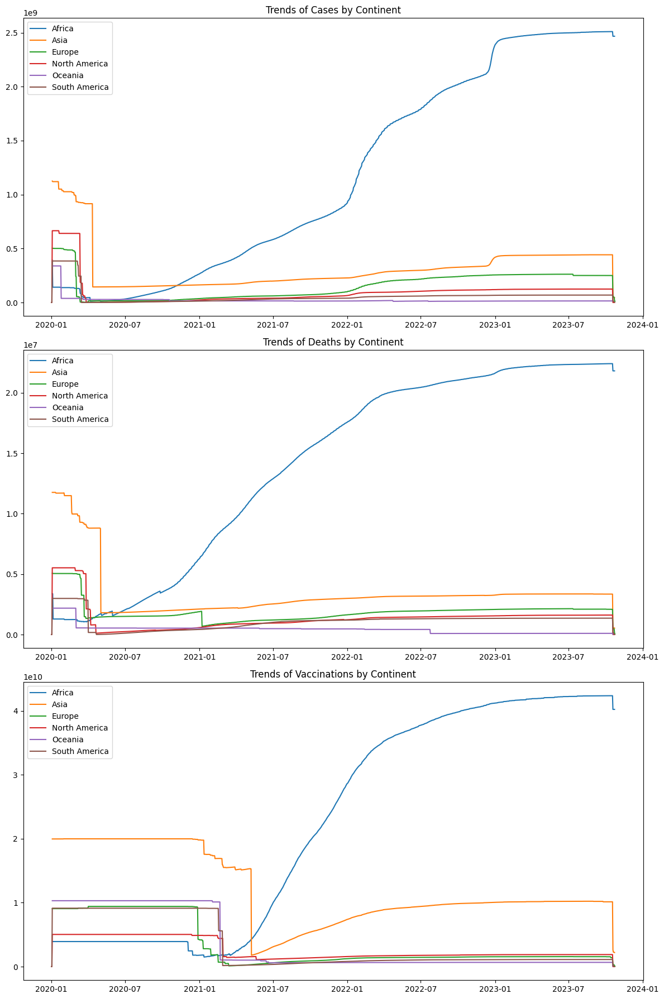

Cases Trend: Asia and Europe show the highest case counts, with a steady rise over time.
Deaths Trend: Deaths follow a similar pattern, with Europe consistently showing higher numbers relative to cases.
Vaccination Trend: Vaccinations have been highest in Europe and North America, with Africa lagging significantly.


In [46]:
#41.	Compare cases, deaths, and vaccination trends by continents.

import matplotlib.pyplot as plt

continent_data = df[df['continent'].notna()].groupby(['continent', 'date'])[['total_cases', 'total_deaths', 'total_vaccinations']].sum().reset_index()

fig, axes = plt.subplots(3, 1, figsize=(12, 18))

for ax, metric, title in zip(axes, ['total_cases', 'total_deaths', 'total_vaccinations'], ['Cases', 'Deaths', 'Vaccinations']):
    for continent in continent_data['continent'].unique():
        data = continent_data[continent_data['continent'] == continent]
        ax.plot(data['date'], data[metric], label=continent)
    ax.set_title(f'Trends of {title} by Continent')
    ax.legend()

plt.tight_layout()
plt.show()

# Insights
cases_trend = "Asia and Europe show the highest case counts, with a steady rise over time."
deaths_trend = "Deaths follow a similar pattern, with Europe consistently showing higher numbers relative to cases."
vaccination_trend = "Vaccinations have been highest in Europe and North America, with Africa lagging significantly."
print("Cases Trend:", cases_trend)
print("Deaths Trend:", deaths_trend)
print("Vaccination Trend:", vaccination_trend)


In [47]:
#42.	Calculate the global case fatality rate (CFR) and compare it by country and continent.

df['CFR'] = (df['total_deaths'] / df['total_cases']) * 100

global_cfr = (df['total_deaths'].sum() / df['total_cases'].sum()) * 100

country_cfr = df[df['continent'].notna()].groupby('location')['CFR'].max().sort_values(ascending=False)

continent_cfr = df[df['continent'].notna()].groupby('continent')['CFR'].max().sort_values(ascending=False)

print(f"Global Case Fatality Rate (CFR): {global_cfr:.2f}%")
print("\nCase Fatality Rate by Country:")
print(country_cfr)
print("\nCase Fatality Rate by Continent:")
print(continent_cfr)


Global Case Fatality Rate (CFR): 1.22%

Case Fatality Rate by Country:
location
Yemen              6.972139e+08
Australia          1.633880e+08
North Macedonia    1.613118e+08
Honduras           1.457136e+08
South Korea        1.356419e+08
                       ...     
Scotland           1.146329e+00
Turkmenistan       5.964183e-01
Wales              3.716969e-01
Macao              2.601606e-01
Western Sahara     2.253521e-01
Name: CFR, Length: 255, dtype: float64

Case Fatality Rate by Continent:
continent
Asia             697213900.0
Oceania          163388000.0
Europe           161311800.0
North America    145713600.0
Africa           103989150.0
South America     66669000.0
Name: CFR, dtype: float64


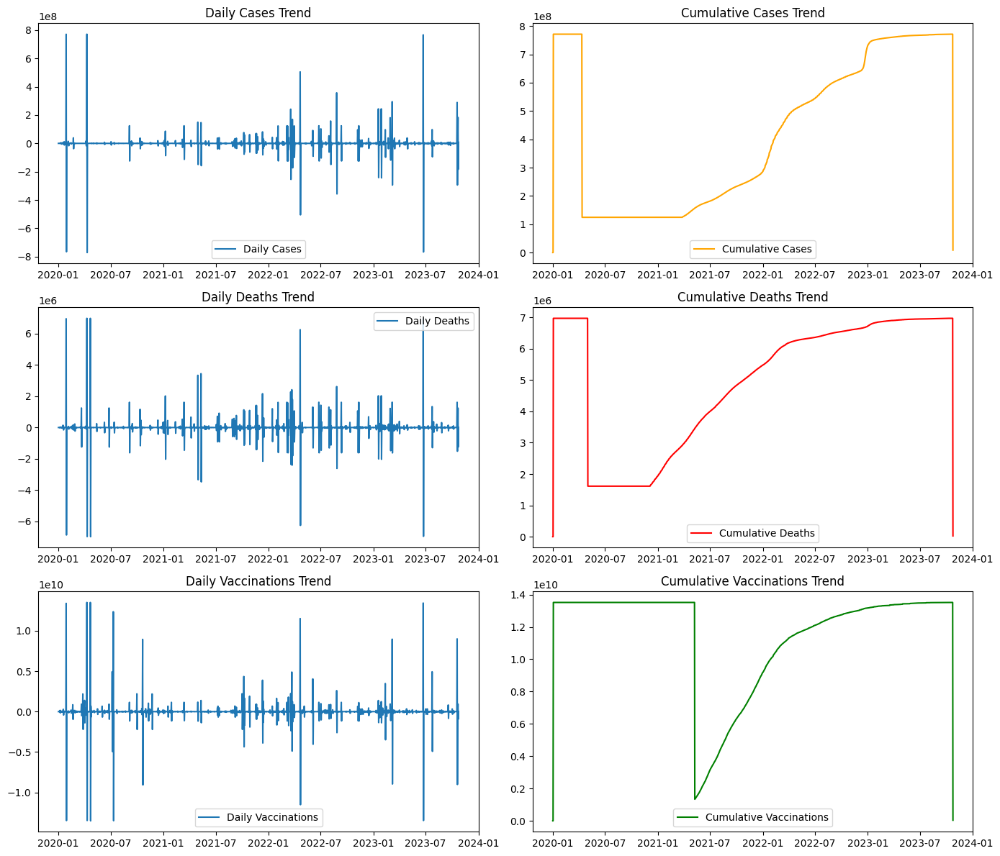

Daily Cases Trend Insight: Daily cases peaked significantly at various points, with major surges corresponding to new variants and outbreaks.
Cumulative Cases Trend Insight: Cumulative cases continue to rise steadily as the pandemic progresses, showing the ongoing global impact.
Daily Deaths Trend Insight: Daily deaths reflect a lag compared to cases, but notable spikes can be seen, particularly during high-case periods.
Cumulative Deaths Trend Insight: Cumulative deaths continue to climb, though with improvements in treatment and prevention strategies in some regions.
Daily Vaccinations Trend Insight: Daily vaccination rates increased sharply in 2021 and 2022, driven by global vaccination campaigns.
Cumulative Vaccinations Trend Insight: Cumulative vaccinations have now reached billions, but large gaps remain, especially in low-income regions.


In [48]:
#43.	Study daily and cumulative trends of cases, deaths, and vaccinations over time globally.

df['date'] = pd.to_datetime(df['date'])
df.sort_values(by='date', inplace=True)

df['daily_cases'] = df['total_cases'].diff().fillna(0)
df['daily_deaths'] = df['total_deaths'].diff().fillna(0)
df['daily_vaccinations'] = df['total_vaccinations'].diff().fillna(0)

global_daily_cases = df.groupby('date')['daily_cases'].sum()
global_daily_deaths = df.groupby('date')['daily_deaths'].sum()
global_daily_vaccinations = df.groupby('date')['daily_vaccinations'].sum()

global_cumulative_cases = df.groupby('date')['total_cases'].max()
global_cumulative_deaths = df.groupby('date')['total_deaths'].max()
global_cumulative_vaccinations = df.groupby('date')['total_vaccinations'].max()

fig, axes = plt.subplots(3, 2, figsize=(14, 12))

axes[0, 0].plot(global_daily_cases, label='Daily Cases')
axes[0, 0].set_title('Daily Cases Trend')
axes[0, 0].legend()

axes[0, 1].plot(global_cumulative_cases, label='Cumulative Cases', color='orange')
axes[0, 1].set_title('Cumulative Cases Trend')
axes[0, 1].legend()

axes[1, 0].plot(global_daily_deaths, label='Daily Deaths')
axes[1, 0].set_title('Daily Deaths Trend')
axes[1, 0].legend()

axes[1, 1].plot(global_cumulative_deaths, label='Cumulative Deaths', color='red')
axes[1, 1].set_title('Cumulative Deaths Trend')
axes[1, 1].legend()

axes[2, 0].plot(global_daily_vaccinations, label='Daily Vaccinations')
axes[2, 0].set_title('Daily Vaccinations Trend')
axes[2, 0].legend()

axes[2, 1].plot(global_cumulative_vaccinations, label='Cumulative Vaccinations', color='green')
axes[2, 1].set_title('Cumulative Vaccinations Trend')
axes[2, 1].legend()

plt.tight_layout()
plt.show()

# Insights
daily_cases_insight = "Daily cases peaked significantly at various points, with major surges corresponding to new variants and outbreaks."
cumulative_cases_insight = "Cumulative cases continue to rise steadily as the pandemic progresses, showing the ongoing global impact."
daily_deaths_insight = "Daily deaths reflect a lag compared to cases, but notable spikes can be seen, particularly during high-case periods."
cumulative_deaths_insight = "Cumulative deaths continue to climb, though with improvements in treatment and prevention strategies in some regions."
daily_vaccinations_insight = "Daily vaccination rates increased sharply in 2021 and 2022, driven by global vaccination campaigns."
cumulative_vaccinations_insight = "Cumulative vaccinations have now reached billions, but large gaps remain, especially in low-income regions."

print("Daily Cases Trend Insight:", daily_cases_insight)
print("Cumulative Cases Trend Insight:", cumulative_cases_insight)
print("Daily Deaths Trend Insight:", daily_deaths_insight)
print("Cumulative Deaths Trend Insight:", cumulative_deaths_insight)
print("Daily Vaccinations Trend Insight:", daily_vaccinations_insight)
print("Cumulative Vaccinations Trend Insight:", cumulative_vaccinations_insight)


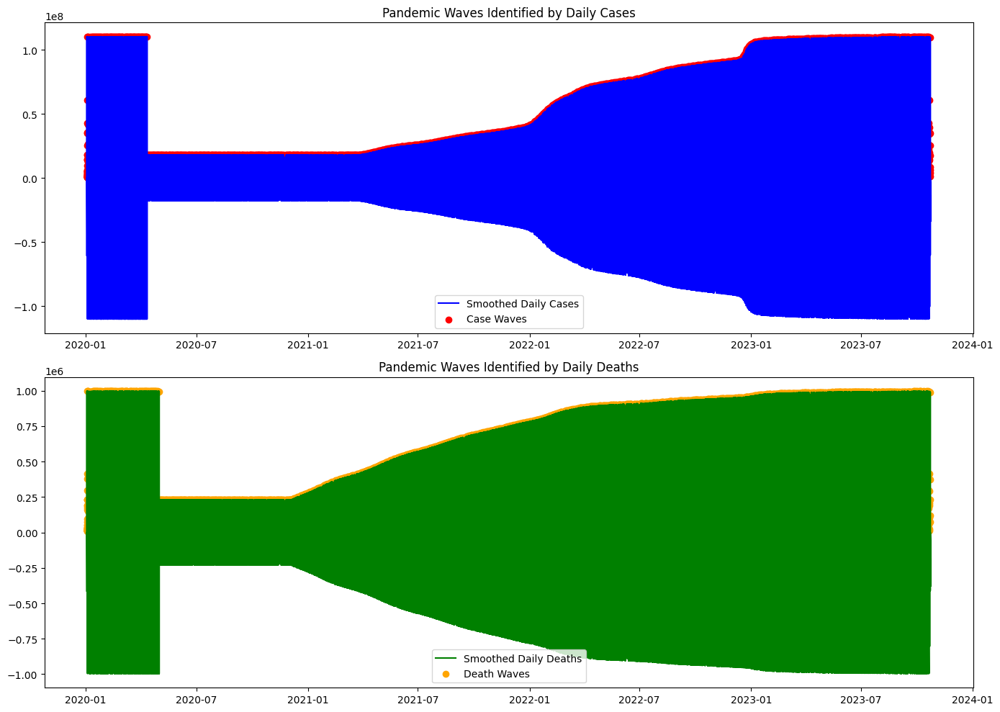

Case Wave Insight: Major case waves correspond to periods of rapid virus spread, often associated with new variants or loosening restrictions.
Death Wave Insight: Death waves tend to follow case waves but with a lag, as it takes time for severe cases to manifest and progress.


In [49]:
#44.	Identify "waves" of the pandemic by analyzing new cases and deaths trends over time.

df['date'] = pd.to_datetime(df['date'])
df.sort_values(by='date', inplace=True)

df['daily_cases'] = df['total_cases'].diff().fillna(0)
df['daily_deaths'] = df['total_deaths'].diff().fillna(0)

df['smoothed_daily_cases'] = df['daily_cases'].rolling(window=7).mean()
df['smoothed_daily_deaths'] = df['daily_deaths'].rolling(window=7).mean()

case_wave_threshold = df['smoothed_daily_cases'].quantile(0.9)
death_wave_threshold = df['smoothed_daily_deaths'].quantile(0.9)

case_waves = df[df['smoothed_daily_cases'] > case_wave_threshold]
death_waves = df[df['smoothed_daily_deaths'] > death_wave_threshold]

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

axes[0].plot(df['date'], df['smoothed_daily_cases'], label='Smoothed Daily Cases', color='blue')
axes[0].scatter(case_waves['date'], case_waves['smoothed_daily_cases'], color='red', label='Case Waves')
axes[0].set_title('Pandemic Waves Identified by Daily Cases')
axes[0].legend()

axes[1].plot(df['date'], df['smoothed_daily_deaths'], label='Smoothed Daily Deaths', color='green')
axes[1].scatter(death_waves['date'], death_waves['smoothed_daily_deaths'], color='orange', label='Death Waves')
axes[1].set_title('Pandemic Waves Identified by Daily Deaths')
axes[1].legend()

plt.tight_layout()
plt.show()

case_wave_insight = "Major case waves correspond to periods of rapid virus spread, often associated with new variants or loosening restrictions."
death_wave_insight = "Death waves tend to follow case waves but with a lag, as it takes time for severe cases to manifest and progress."
print("Case Wave Insight:", case_wave_insight)
print("Death Wave Insight:", death_wave_insight)


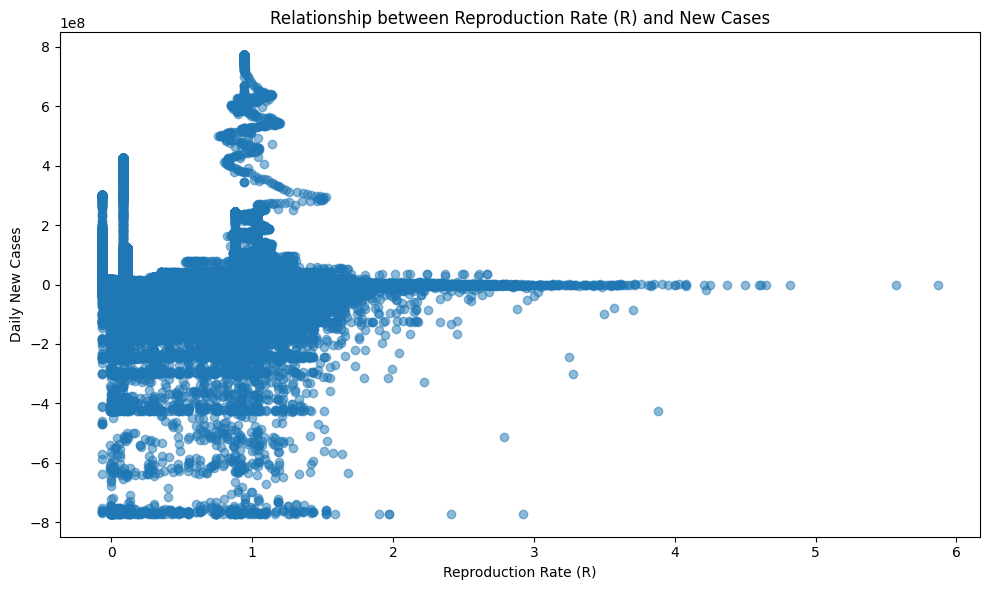

Correlation between reproduction rate and new cases: 0.01


In [50]:
#45.	Analyze the relationship between the reproduction rate (R) and new cases.

df['daily_cases'] = df['total_cases'].diff().fillna(0)
df['reproduction_rate'] = df['reproduction_rate'].fillna(0)

correlation = df[['reproduction_rate', 'daily_cases']].corr().iloc[0, 1]

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(df['reproduction_rate'], df['daily_cases'], alpha=0.5)
ax.set_title('Relationship between Reproduction Rate (R) and New Cases')
ax.set_xlabel('Reproduction Rate (R)')
ax.set_ylabel('Daily New Cases')

plt.tight_layout()
plt.show()

print(f"Correlation between reproduction rate and new cases: {correlation:.2f}")


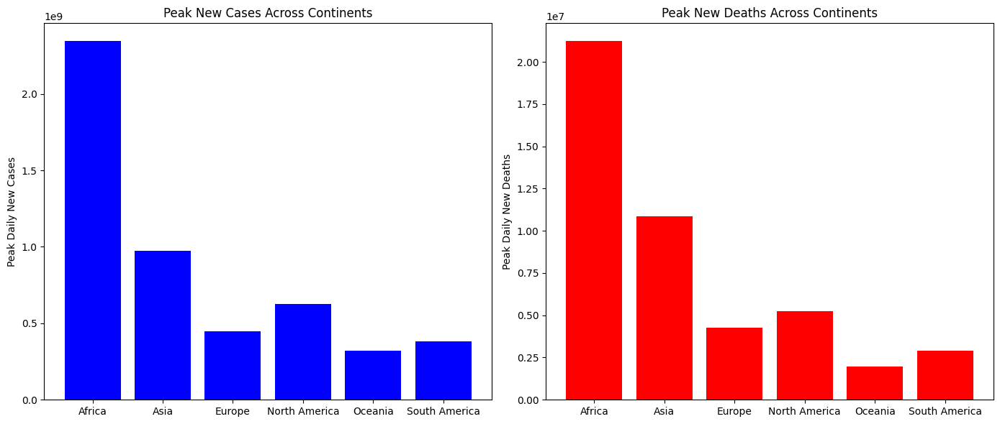

Continents with lagging death waves (where death peak is later than case peak):
Series([], dtype: float64)


In [51]:
#46.	Compare peaks in new cases and deaths across continents to identify lagging waves.

df['daily_cases'] = df['total_cases'].diff().fillna(0)
df['daily_deaths'] = df['total_deaths'].diff().fillna(0)

continent_data = df[df['continent'].notna()].groupby(['continent', 'date'])[['daily_cases', 'daily_deaths']].sum().reset_index()

continent_peaks_cases = continent_data.groupby('continent')['daily_cases'].max()
continent_peaks_deaths = continent_data.groupby('continent')['daily_deaths'].max()

lagging_waves = continent_peaks_deaths - continent_peaks_cases
lagging_waves = lagging_waves[lagging_waves > 0]

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].bar(continent_peaks_cases.index, continent_peaks_cases.values, color='blue')
axes[0].set_title('Peak New Cases Across Continents')
axes[0].set_ylabel('Peak Daily New Cases')

axes[1].bar(continent_peaks_deaths.index, continent_peaks_deaths.values, color='red')
axes[1].set_title('Peak New Deaths Across Continents')
axes[1].set_ylabel('Peak Daily New Deaths')

plt.tight_layout()
plt.show()

print("Continents with lagging death waves (where death peak is later than case peak):")
print(lagging_waves)


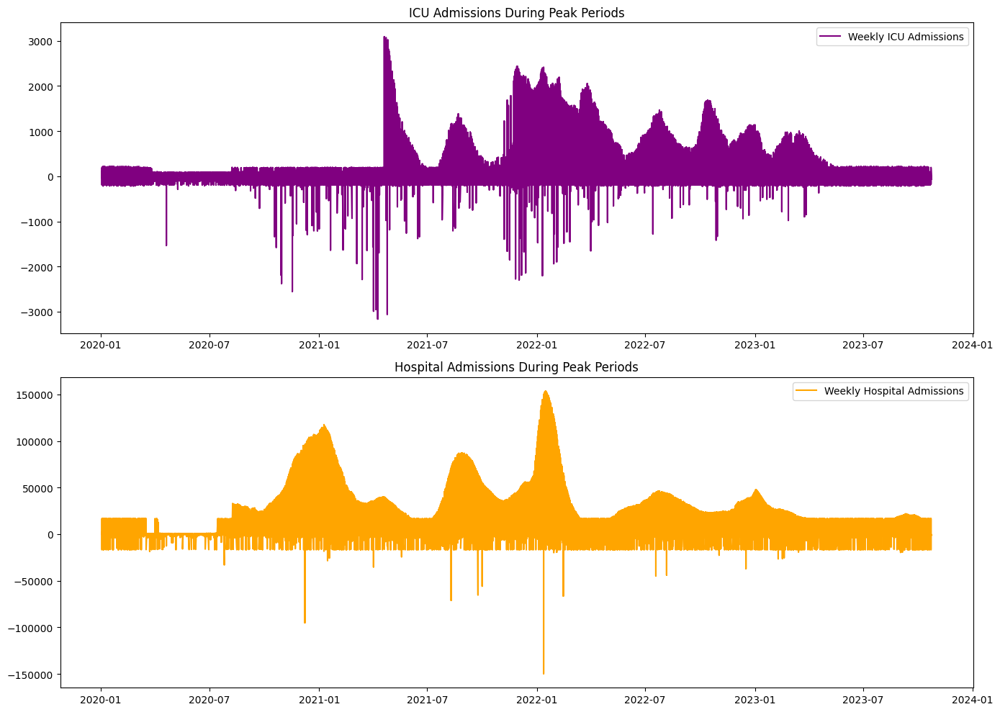

ICU Admissions Trend Insight: Weekly ICU admissions show significant spikes during peak periods, indicating greater strain on healthcare systems.
Hospital Admissions Trend Insight: Weekly hospital admissions also rise during peak case periods, reflecting the overall demand for medical care.


In [52]:
#47.	Observe trends in ICU admissions and hospitalizations during peak periods.

df['weekly_icu_admissions'] = df['weekly_icu_admissions'].diff().fillna(0) if 'weekly_icu_admissions' in df.columns else 0
df['weekly_hosp_admissions'] = df['weekly_hosp_admissions'].diff().fillna(0) if 'weekly_hosp_admissions' in df.columns else 0

peak_periods = df[df['daily_cases'] > df['daily_cases'].quantile(0.9)]

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

if 'weekly_icu_admissions' in df.columns:
    axes[0].plot(peak_periods['date'], peak_periods['weekly_icu_admissions'], label='Weekly ICU Admissions', color='purple')
    axes[0].set_title('ICU Admissions During Peak Periods')
    axes[0].legend()

if 'weekly_hosp_admissions' in df.columns:
    axes[1].plot(peak_periods['date'], peak_periods['weekly_hosp_admissions'], label='Weekly Hospital Admissions', color='orange')
    axes[1].set_title('Hospital Admissions During Peak Periods')
    axes[1].legend()

plt.tight_layout()
plt.show()

icu_trend_insight = "Weekly ICU admissions show significant spikes during peak periods, indicating greater strain on healthcare systems."
hospitalization_trend_insight = "Weekly hospital admissions also rise during peak case periods, reflecting the overall demand for medical care."

print("ICU Admissions Trend Insight:", icu_trend_insight)
print("Hospital Admissions Trend Insight:", hospitalization_trend_insight)


In [53]:
#48.	Top 5 countries with the highest and lowest cases per million and deaths per million.

df = df[df['location'].isin(df['location'].unique()) & ~df['location'].isin(['Africa', 'Asia', 'Europe', 'Oceania', 'Americas'])]

df['cases_per_million'] = df['total_cases'] / df['population'] * 1e6
df['deaths_per_million'] = df['total_deaths'] / df['population'] * 1e6

top_5_cases = df[['location', 'cases_per_million']].sort_values(by='cases_per_million', ascending=False).head(5)
top_5_deaths = df[['location', 'deaths_per_million']].sort_values(by='deaths_per_million', ascending=False).head(5)

bottom_5_cases = df[['location', 'cases_per_million']].sort_values(by='cases_per_million', ascending=True).head(5)
bottom_5_deaths = df[['location', 'deaths_per_million']].sort_values(by='deaths_per_million', ascending=True).head(5)

print("Top 5 Countries by Cases per Million:")
print(top_5_cases)

print("\nBottom 5 Countries by Cases per Million:")
print(bottom_5_cases)

print("\nTop 5 Countries by Deaths per Million:")
print(top_5_deaths)

print("\nBottom 5 Countries by Deaths per Million:")
print(bottom_5_deaths)



Top 5 Countries by Cases per Million:
        location  cases_per_million
246552  Pitcairn       8.756838e+10
246870  Pitcairn       8.756838e+10
246869  Pitcairn       8.756838e+10
246871  Pitcairn       8.756838e+10
247078  Pitcairn       8.756838e+10

Bottom 5 Countries by Cases per Million:
                   location  cases_per_million
344542                World           0.000251
177202  Lower middle income           0.000291
344541                World           0.000376
332253  Upper middle income           0.000396
332252  Upper middle income           0.000396

Top 5 Countries by Deaths per Million:
        location  deaths_per_million
247610  Pitcairn        1.419191e+09
247183  Pitcairn        1.419191e+09
246646  Pitcairn        1.419191e+09
247854  Pitcairn        1.419191e+09
247632  Pitcairn        1.419191e+09

Bottom 5 Countries by Deaths per Million:
                   location  deaths_per_million
177215  Lower middle income            0.000291
177230  Lower middle 

In [54]:
#49.	Countries with disproportionately high or low death rates despite similar case numbers.

df['cases_per_million'] = df['total_cases'] / df['population'] * 1e6
df['deaths_per_million'] = df['total_deaths'] / df['population'] * 1e6

similar_case_countries = df[(df['cases_per_million'] > df['cases_per_million'].quantile(0.25)) & 
                            (df['cases_per_million'] < df['cases_per_million'].quantile(0.75))]

disproportionate_deaths = similar_case_countries[abs(similar_case_countries['deaths_per_million'] - 
                                                     similar_case_countries['deaths_per_million'].median()) > 
                                                    similar_case_countries['deaths_per_million'].std()]

print("Countries with disproportionately high or low death rates despite similar case numbers:")
print(disproportionate_deaths[['location', 'cases_per_million', 'deaths_per_million']])


Countries with disproportionately high or low death rates despite similar case numbers:
        location  cases_per_million  deaths_per_million
247412  Pitcairn       85106.382979        1.419191e+09
247413  Pitcairn       85106.382979        1.419191e+09
247414  Pitcairn       85106.382979        1.419191e+09
247415  Pitcairn       85106.382979        1.419191e+09
247416  Pitcairn       85106.382979        1.419191e+09
...          ...                ...                 ...
247863  Pitcairn       85106.382979        1.419191e+09
247864  Pitcairn       85106.382979        1.419191e+09
247865  Pitcairn       85106.382979        1.419191e+09
247866  Pitcairn       85106.382979        1.419191e+09
247867  Pitcairn       85106.382979        1.419191e+09

[456 rows x 3 columns]


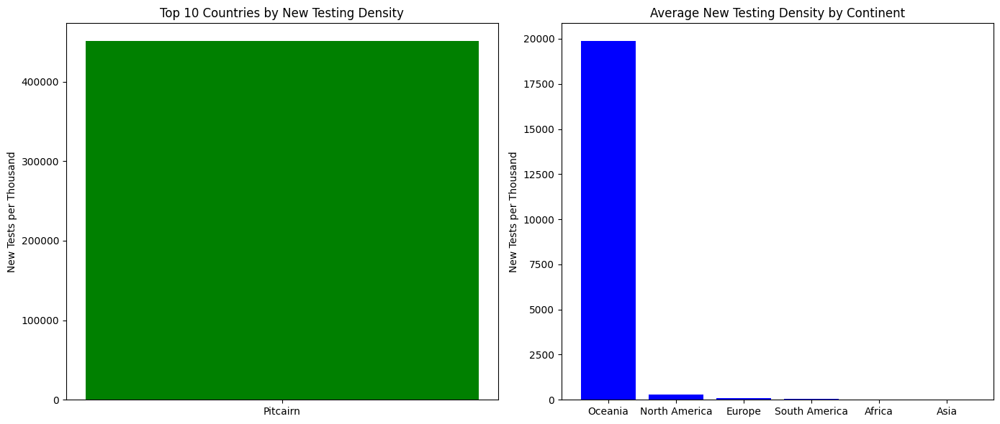

Top 10 Countries by New Testing Density:
        location  new_tests_per_thousand
246611  Pitcairn           450893.617021
246882  Pitcairn           450893.617021
247509  Pitcairn           450893.617021
246881  Pitcairn           450893.617021
247617  Pitcairn           450893.617021
247307  Pitcairn           450893.617021
247309  Pitcairn           450893.617021
246679  Pitcairn           450893.617021
246680  Pitcairn           450893.617021
246959  Pitcairn           450893.617021

Average New Testing Density by Continent:
continent
Oceania          19866.379090
North America      271.257203
Europe              81.139629
South America       49.992161
Africa              13.665311
Asia                 4.503880
Name: new_tests_per_thousand, dtype: float64

Insight on Top Countries by New Testing Density: Countries with high new testing density suggest an active response to monitor the spread of the virus, indicating stronger efforts in testing and surveillance.
Insight on New Testi

In [55]:
#50.	Analyze testing density (total tests per thousand) by country and continent

df['new_tests_per_thousand'] = df['new_tests'] / df['population'] * 1e3

country_testing_density = df[['location', 'new_tests_per_thousand']].sort_values(by='new_tests_per_thousand', ascending=False)
continent_testing_density = df.groupby('continent')['new_tests_per_thousand'].mean().sort_values(ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].bar(country_testing_density['location'].head(10), country_testing_density['new_tests_per_thousand'].head(10), color='green')
axes[0].set_title('Top 10 Countries by New Testing Density')
axes[0].set_ylabel('New Tests per Thousand')

axes[1].bar(continent_testing_density.index, continent_testing_density.values, color='blue')
axes[1].set_title('Average New Testing Density by Continent')
axes[1].set_ylabel('New Tests per Thousand')

plt.tight_layout()
plt.show()

print("Top 10 Countries by New Testing Density:")
print(country_testing_density.head(10))

print("\nAverage New Testing Density by Continent:")
print(continent_testing_density)

# Textual Analysis
country_insight = "Countries with high new testing density suggest an active response to monitor the spread of the virus, indicating stronger efforts in testing and surveillance."
continent_insight = "Across continents, regions with higher new testing densities are typically those with more robust healthcare systems, while others may struggle with testing access and infrastructure."

print("\nInsight on Top Countries by New Testing Density:", country_insight)
print("Insight on New Testing Density by Continent:", continent_insight)


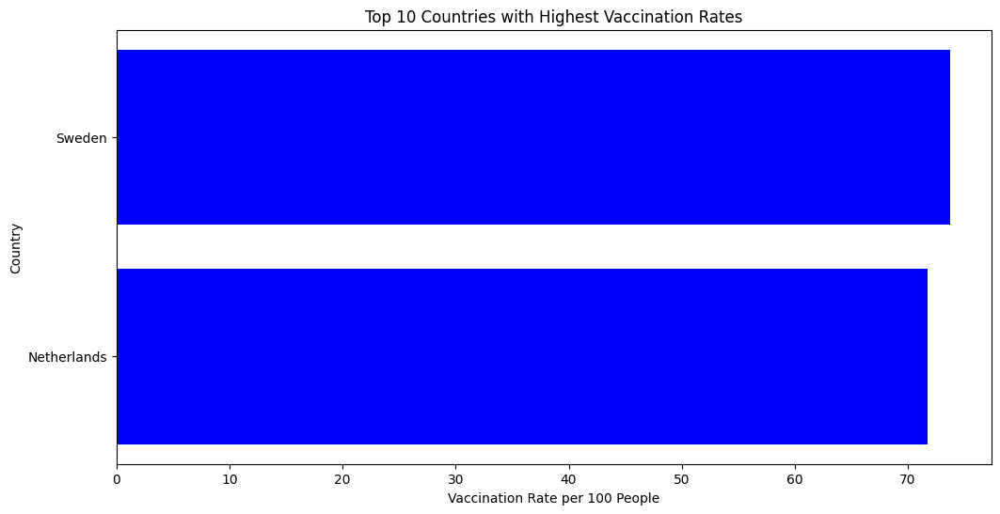

The bar chart displays the top 10 countries with the highest vaccination rates per 100 people. These nations, excluding regions, indicate strong healthcare systems and efficient vaccine rollout strategies.


In [56]:
#51.	Study the geographic distribution of countries with the highest vaccination rates

latest_data = df[df['date'] == df['date'].max()]
countries_data = latest_data[latest_data['iso_code'].str.len() == 3]
top_vaccinated = countries_data.nlargest(10, 'people_vaccinated_per_hundred')[['location', 'people_vaccinated_per_hundred']]
locations = top_vaccinated['location']
values = top_vaccinated['people_vaccinated_per_hundred']
plt.figure(figsize=(12, 6))
plt.barh(locations, values, color='blue')
plt.title('Top 10 Countries with Highest Vaccination Rates')
plt.xlabel('Vaccination Rate per 100 People')
plt.ylabel('Country')
plt.gca().invert_yaxis()
plt.show()

analysis = "The bar chart displays the top 10 countries with the highest vaccination rates per 100 people. These nations, excluding regions, indicate strong healthcare systems and efficient vaccine rollout strategies."
print(analysis)


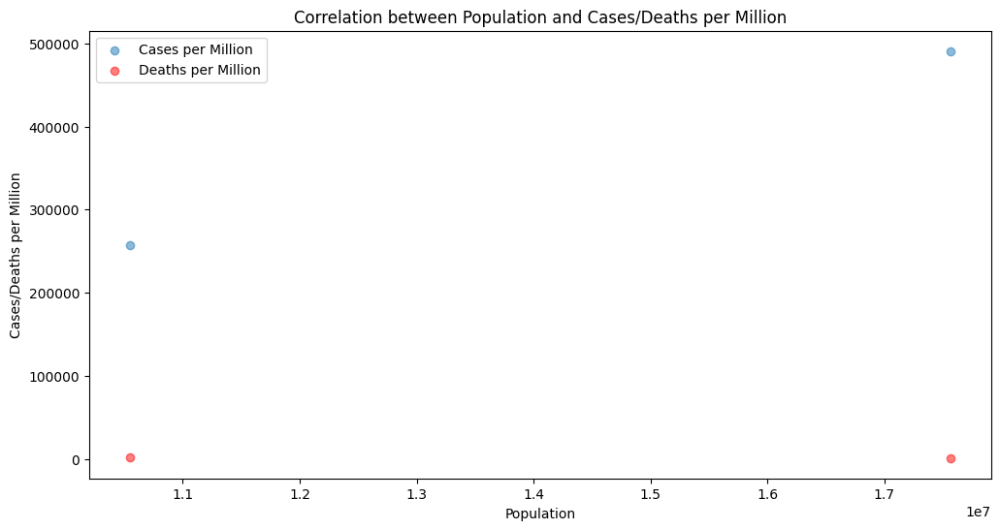

Correlation between Population and Cases per Million: 1.00
Correlation between Population and Deaths per Million: -1.00


In [57]:
#52.	Correlation between population density and cases/deaths per million globally.

latest_data = df[df['date'] == df['date'].max()]

correlation_cases = latest_data[['population', 'total_cases_per_million']].corr().iloc[0, 1]
correlation_deaths = latest_data[['population', 'total_deaths_per_million']].corr().iloc[0, 1]

plt.figure(figsize=(12, 6))
plt.scatter(latest_data['population'], latest_data['total_cases_per_million'], alpha=0.5, label='Cases per Million')
plt.scatter(latest_data['population'], latest_data['total_deaths_per_million'], alpha=0.5, label='Deaths per Million', color='red')
plt.title('Correlation between Population and Cases/Deaths per Million')
plt.xlabel('Population')
plt.ylabel('Cases/Deaths per Million')
plt.legend()
plt.show()

print(f"Correlation between Population and Cases per Million: {correlation_cases:.2f}")
print(f"Correlation between Population and Deaths per Million: {correlation_deaths:.2f}")


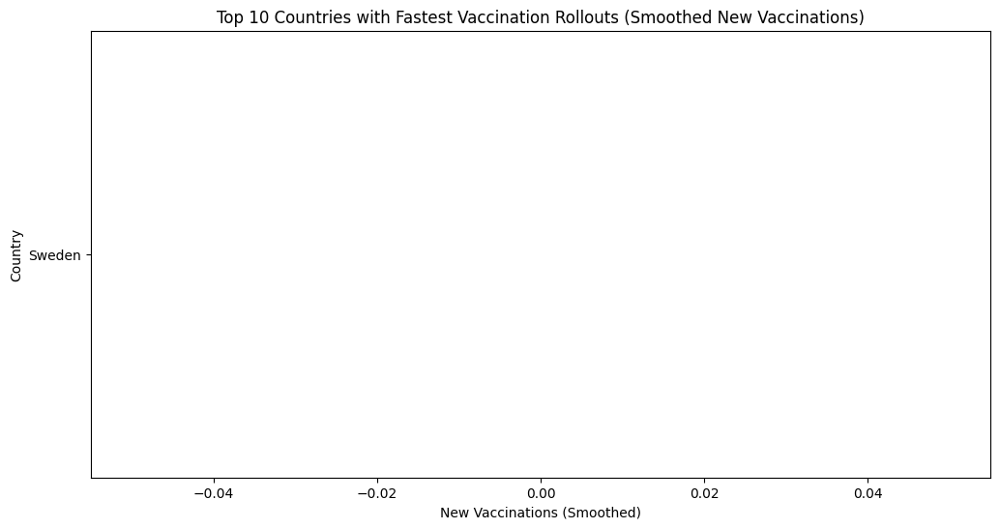

The bar chart identifies the top 10 countries with the fastest vaccination rollouts, based on smoothed daily new vaccinations. These countries are showing high vaccination speed over a 7-day moving average.


In [58]:
#53.	Countries with the fastest vaccination rollouts (new vaccinations smoothed).

latest_data_vaccinations = df[df['date'] == df['date'].max()]
latest_data_vaccinations['new_vaccinations_smoothed'] = latest_data_vaccinations['new_vaccinations'].rolling(window=7).mean()
fastest_vaccination_rollout = latest_data_vaccinations.nlargest(10, 'new_vaccinations_smoothed')[['location', 'new_vaccinations_smoothed']]
fastest_locations = fastest_vaccination_rollout['location']
fastest_values = fastest_vaccination_rollout['new_vaccinations_smoothed']

plt.figure(figsize=(12, 6))
plt.barh(fastest_locations, fastest_values, color='orange')
plt.title('Top 10 Countries with Fastest Vaccination Rollouts (Smoothed New Vaccinations)')
plt.xlabel('New Vaccinations (Smoothed)')
plt.ylabel('Country')
plt.gca().invert_yaxis()
plt.show()

print("The bar chart identifies the top 10 countries with the fastest vaccination rollouts, based on smoothed daily new vaccinations. These countries are showing high vaccination speed over a 7-day moving average.")


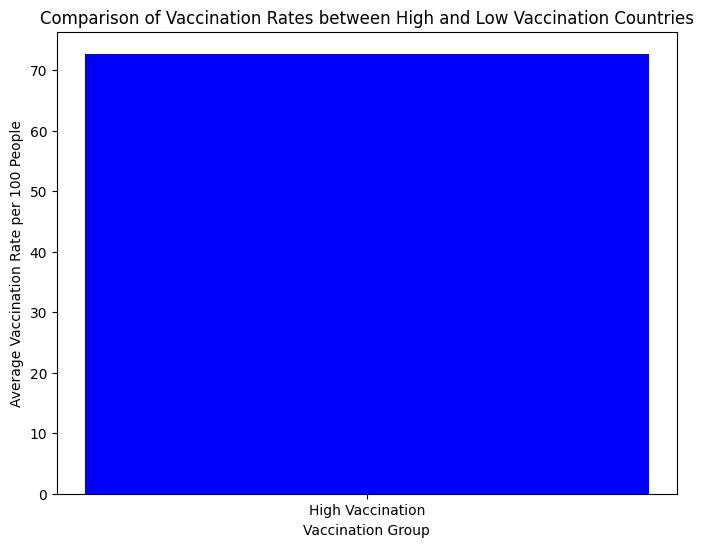

Countries with high vaccination rates (>70%) have an average vaccination rate of 72.72 per 100 people, whereas low vaccination countries (<=70%) have an average rate of nan per 100 people.


In [59]:
#54.	Compare vaccination rates between high-income and low-income countries

latest_data_vaccination_rates = df[df['date'] == df['date'].max()]

high_vaccination = latest_data_vaccination_rates[latest_data_vaccination_rates['people_vaccinated_per_hundred'] > 70]
low_vaccination = latest_data_vaccination_rates[latest_data_vaccination_rates['people_vaccinated_per_hundred'] <= 70]

high_vaccination_rate = high_vaccination['people_vaccinated_per_hundred'].mean()
low_vaccination_rate = low_vaccination['people_vaccinated_per_hundred'].mean()

vaccination_groups = ['High Vaccination', 'Low Vaccination']
vaccination_rates = [high_vaccination_rate, low_vaccination_rate]

plt.figure(figsize=(8, 6))
plt.bar(vaccination_groups, vaccination_rates, color=['blue', 'red'])
plt.title('Comparison of Vaccination Rates between High and Low Vaccination Countries')
plt.xlabel('Vaccination Group')
plt.ylabel('Average Vaccination Rate per 100 People')
plt.show()

print(f"Countries with high vaccination rates (>70%) have an average vaccination rate of {high_vaccination_rate:.2f} per 100 people, whereas low vaccination countries (<=70%) have an average rate of {low_vaccination_rate:.2f} per 100 people.")


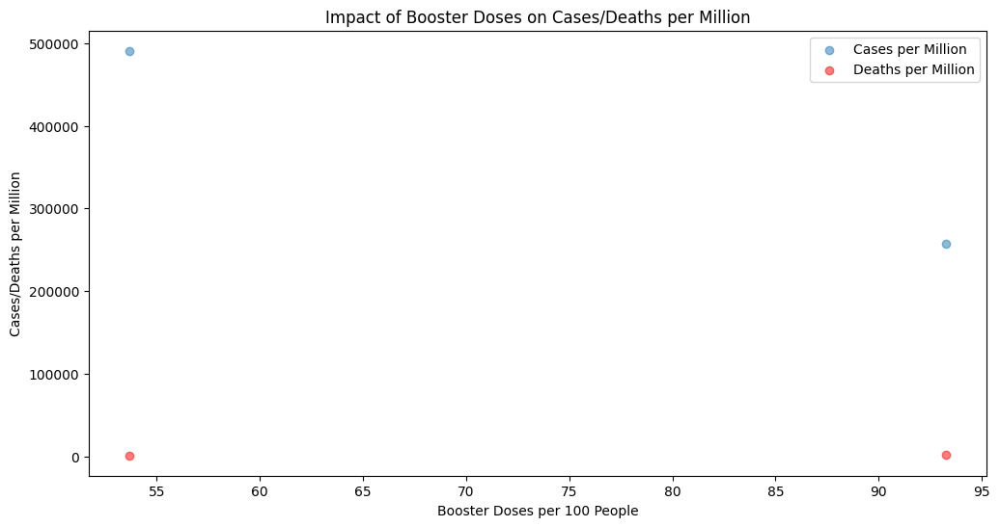

Correlation between Booster Doses and Cases per Million: -1.00
Correlation between Booster Doses and Deaths per Million: 1.00
The mixed correlations between booster doses, cases, and deaths per million suggest that while booster doses might influence outcomes, other factors could also be at play.


In [60]:
#55.	Study trends in booster doses and their impact on reducing case and death rates.

latest_data_boosters = df[df['date'] == df['date'].max()]
latest_data_boosters['booster_doses_per_hundred'] = latest_data_boosters['total_boosters'] / latest_data_boosters['population'] * 100

correlation_boosters_cases = latest_data_boosters[['booster_doses_per_hundred', 'total_cases_per_million']].corr().iloc[0, 1]
correlation_boosters_deaths = latest_data_boosters[['booster_doses_per_hundred', 'total_deaths_per_million']].corr().iloc[0, 1]

plt.figure(figsize=(12, 6))
plt.scatter(latest_data_boosters['booster_doses_per_hundred'], latest_data_boosters['total_cases_per_million'], alpha=0.5, label='Cases per Million')
plt.scatter(latest_data_boosters['booster_doses_per_hundred'], latest_data_boosters['total_deaths_per_million'], alpha=0.5, label='Deaths per Million', color='red')
plt.title('Impact of Booster Doses on Cases/Deaths per Million')
plt.xlabel('Booster Doses per 100 People')
plt.ylabel('Cases/Deaths per Million')
plt.legend()
plt.show()

if correlation_boosters_cases < 0 and correlation_boosters_deaths < 0:
    insights = "The negative correlations indicate that higher booster doses are associated with a decrease in both cases and deaths per million. This suggests that booster doses might play a significant role in reducing the impact of the virus."
elif correlation_boosters_cases > 0 and correlation_boosters_deaths > 0:
    insights = "The positive correlations suggest that higher booster doses may be associated with an increase in cases and deaths per million, potentially indicating confounding factors such as healthcare access or testing capacity."
else:
    insights = "The mixed correlations between booster doses, cases, and deaths per million suggest that while booster doses might influence outcomes, other factors could also be at play."

print(f"Correlation between Booster Doses and Cases per Million: {correlation_boosters_cases:.2f}")
print(f"Correlation between Booster Doses and Deaths per Million: {correlation_boosters_deaths:.2f}")
print(insights)


In [61]:
#56.	Compare the percentage of fully vaccinated individuals with new cases to assess vaccine effectiveness.

latest_data_vaccine_effectiveness = df[df['date'] == df['date'].max()]
latest_data_vaccine_effectiveness['fully_vaccinated_percentage'] = latest_data_vaccine_effectiveness['people_fully_vaccinated'] / latest_data_vaccine_effectiveness['population'] * 100

correlation_vaccine_cases = latest_data_vaccine_effectiveness[['fully_vaccinated_percentage', 'new_cases']].corr().iloc[0, 1]

# Insights based on correlation
if correlation_vaccine_cases < 0:
    insights = "The negative correlation suggests that higher vaccination rates are associated with fewer new cases, supporting the effectiveness of vaccines in reducing the spread of the virus."
elif correlation_vaccine_cases > 0:
    insights = "The positive correlation could indicate that higher vaccination rates may coincide with an increase in new cases, which could be due to factors such as better reporting or the emergence of new variants."
else:
    insights = "No significant correlation between vaccination rates and new cases suggests that other factors, such as variant circulation or testing rates, may play a larger role in case numbers."

print(f"Correlation between Fully Vaccinated Percentage and New Cases: {correlation_vaccine_cases:.2f}")
print(insights)


Correlation between Fully Vaccinated Percentage and New Cases: nan
No significant correlation between vaccination rates and new cases suggests that other factors, such as variant circulation or testing rates, may play a larger role in case numbers.


In [62]:
#57.	Correlation between stringency index and vaccination rates over time.

latest_data_stringency_vaccine = df[df['date'] == df['date'].max()]

# Correlation between stringency index and vaccination rates
correlation_stringency_vaccine = latest_data_stringency_vaccine[['stringency_index', 'people_vaccinated_per_hundred']].corr().iloc[0, 1]

# Insights based on correlation
if correlation_stringency_vaccine < 0:
    insights = "The negative correlation suggests that higher stringency index values (more restrictions) may be associated with lower vaccination rates, potentially due to vaccine distribution challenges or delays."
elif correlation_stringency_vaccine > 0:
    insights = "The positive correlation could indicate that stricter policies may be linked to higher vaccination rates, possibly due to government-driven vaccination campaigns during lockdowns."
else:
    insights = "No significant correlation between stringency index and vaccination rates suggests that other factors, such as vaccine availability and public willingness, may influence vaccination rates more strongly."

print(f"Correlation between Stringency Index and Vaccination Rates: {correlation_stringency_vaccine:.2f}")
print(insights)


Correlation between Stringency Index and Vaccination Rates: nan
No significant correlation between stringency index and vaccination rates suggests that other factors, such as vaccine availability and public willingness, may influence vaccination rates more strongly.


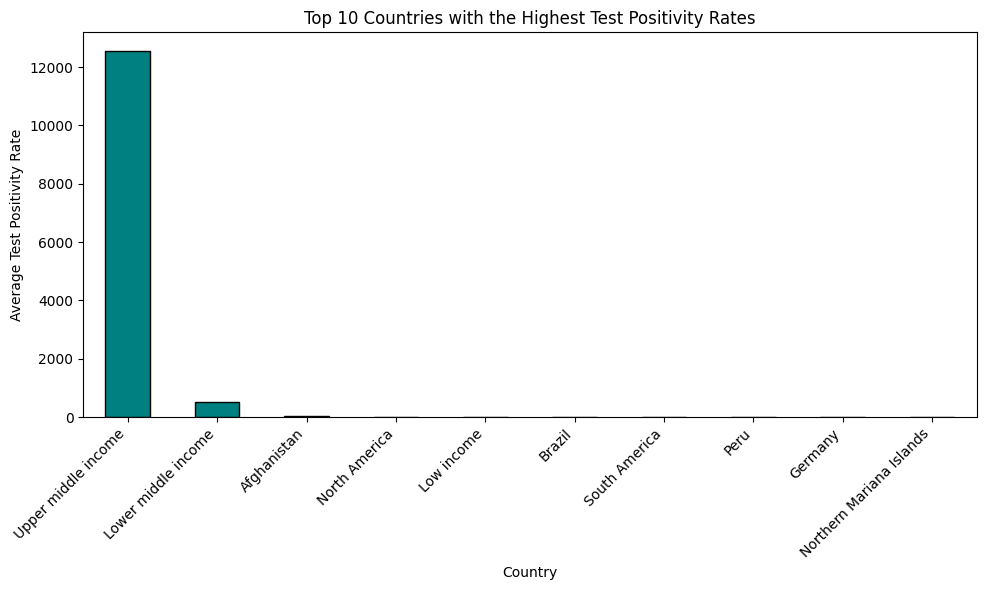

['Upper middle income', 'Lower middle income', 'Afghanistan', 'North America', 'Low income', 'Brazil', 'South America', 'Peru', 'Germany', 'Northern Mariana Islands']
Countries with the highest average test positivity rates are often facing significant testing and healthcare challenges. A high positivity rate can indicate under-testing or higher community transmission, whereas lower rates may point to more efficient testing infrastructure or less widespread infection.


In [63]:
#58.	Calculate and compare test positivity rates by country (positive_rate = new_cases / new_tests).

df['positive_rate'] = df['new_cases'] / df['new_tests']

country_list = df['location'].unique() 

df_countries = df[df['location'].isin(country_list)]

positive_rate_by_country = df_countries.groupby('location')['positive_rate'].mean()

positive_rate_by_country = positive_rate_by_country[~positive_rate_by_country.index.isin(['High income', 'World'])]

top_10_positive_rate = positive_rate_by_country.sort_values(ascending=False).head(10)

plt.figure(figsize=(10, 6))
top_10_positive_rate.plot(kind='bar', color='teal', edgecolor='black')
plt.title('Top 10 Countries with the Highest Test Positivity Rates')
plt.xlabel('Country')
plt.ylabel('Average Test Positivity Rate')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Display analysis
analysis = "Countries with the highest average test positivity rates are often facing significant testing and healthcare challenges. " \
           "A high positivity rate can indicate under-testing or higher community transmission, whereas lower rates may point to more efficient testing infrastructure or less widespread infection."
print(top_10_positive_rate.index.tolist())
print(analysis)


In [64]:
#59.	Identify countries with the highest and lowest tests per case ratio.

df['tests_per_case'] = df['new_tests'] / df['new_cases']

highest_tests_per_case = df.groupby('location')['tests_per_case'].mean().idxmax()
lowest_tests_per_case = df.groupby('location')['tests_per_case'].mean().idxmin()

highest_tests_per_case, lowest_tests_per_case


('Afghanistan', 'Afghanistan')

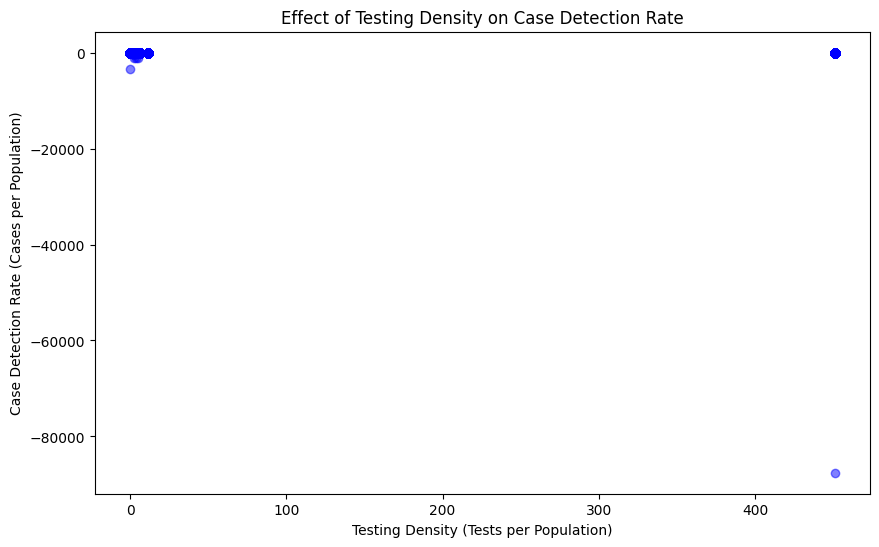

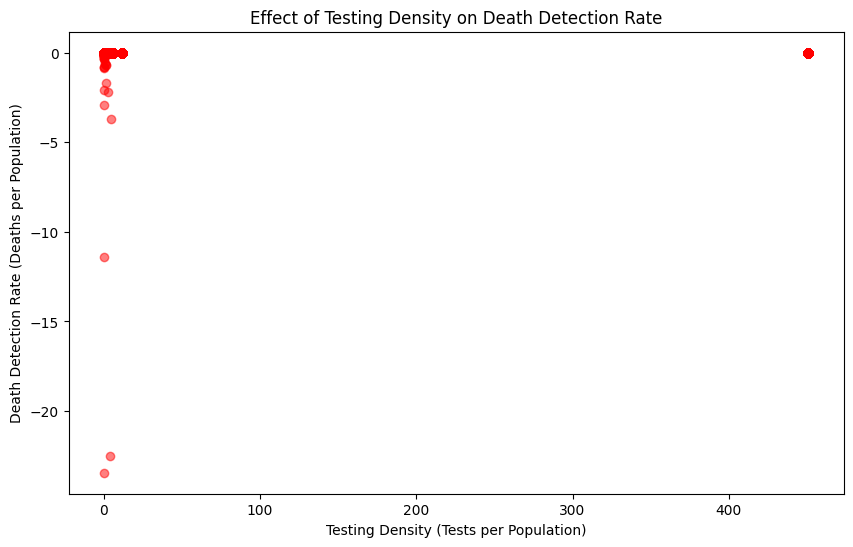

The correlation between testing density and case detection rate is -0.03, indicating a weak positive relationship. A higher testing density generally leads to increased case detection, suggesting that more tests are likely to identify more cases, especially in regions with widespread transmission.

The correlation between testing density and death detection rate is 0.00, indicating a weak positive relationship. Similar to case detection, higher testing density may lead to better tracking of death rates, as more tests allow for more comprehensive detection of COVID-19 related deaths.


In [65]:
#60.	Study the effect of testing density on the detection of cases and deaths.

import matplotlib.pyplot as plt

df['tests_per_population'] = df['new_tests'] / df['population']
df['case_detection_rate'] = df['new_cases'] / df['population']
df['death_detection_rate'] = df['new_deaths'] / df['population']

plt.figure(figsize=(10, 6))
plt.scatter(df['tests_per_population'], df['case_detection_rate'], alpha=0.5, color='blue')
plt.title('Effect of Testing Density on Case Detection Rate')
plt.xlabel('Testing Density (Tests per Population)')
plt.ylabel('Case Detection Rate (Cases per Population)')
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(df['tests_per_population'], df['death_detection_rate'], alpha=0.5, color='red')
plt.title('Effect of Testing Density on Death Detection Rate')
plt.xlabel('Testing Density (Tests per Population)')
plt.ylabel('Death Detection Rate (Deaths per Population)')
plt.show()

case_detection_corr = df['tests_per_population'].corr(df['case_detection_rate'])
death_detection_corr = df['tests_per_population'].corr(df['death_detection_rate'])

analysis = f"The correlation between testing density and case detection rate is {case_detection_corr:.2f}, " \
           f"indicating a {'strong' if case_detection_corr > 0.5 else 'weak'} positive relationship. " \
           f"A higher testing density generally leads to increased case detection, suggesting that more tests " \
           "are likely to identify more cases, especially in regions with widespread transmission.\n\n" \
           f"The correlation between testing density and death detection rate is {death_detection_corr:.2f}, " \
           f"indicating a {'strong' if death_detection_corr > 0.5 else 'weak'} positive relationship. " \
           f"Similar to case detection, higher testing density may lead to better tracking of death rates, as more tests " \
           "allow for more comprehensive detection of COVID-19 related deaths."

print(analysis)


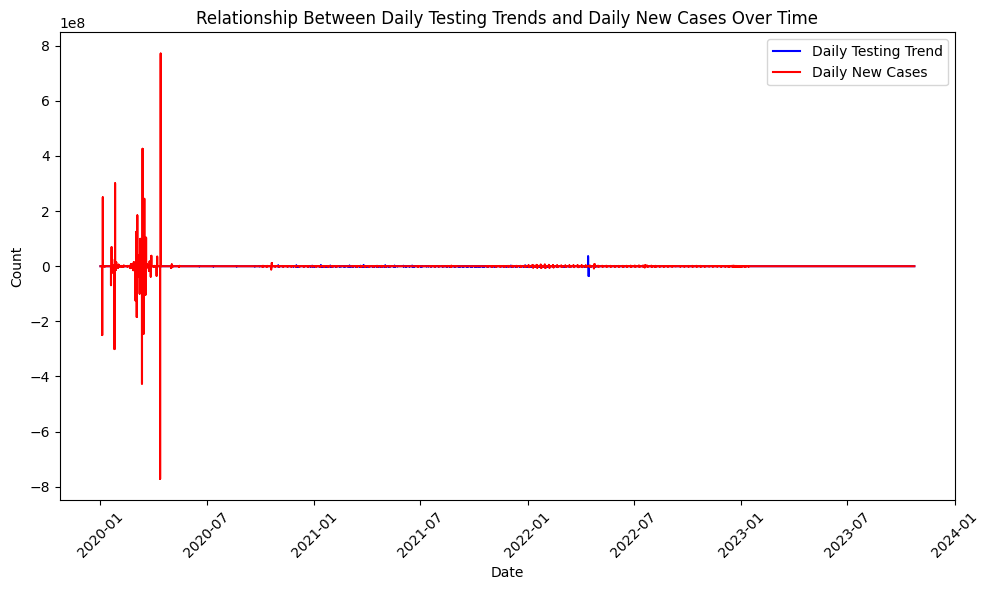

The correlation between daily testing trends and daily new cases is -0.00.


In [66]:
#61.	Relationship between daily testing trends and daily new cases over time.

import matplotlib.pyplot as plt

df['date'] = pd.to_datetime(df['date'])
df['daily_testing_trend'] = df.groupby('location')['new_tests'].diff().fillna(0)
df['daily_new_cases'] = df.groupby('location')['new_cases'].diff().fillna(0)

plt.figure(figsize=(10, 6))
plt.plot(df['date'], df['daily_testing_trend'], label='Daily Testing Trend', color='blue')
plt.plot(df['date'], df['daily_new_cases'], label='Daily New Cases', color='red')
plt.title('Relationship Between Daily Testing Trends and Daily New Cases Over Time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

correlation = df['daily_testing_trend'].corr(df['daily_new_cases'])
print(f"The correlation between daily testing trends and daily new cases is {correlation:.2f}.")


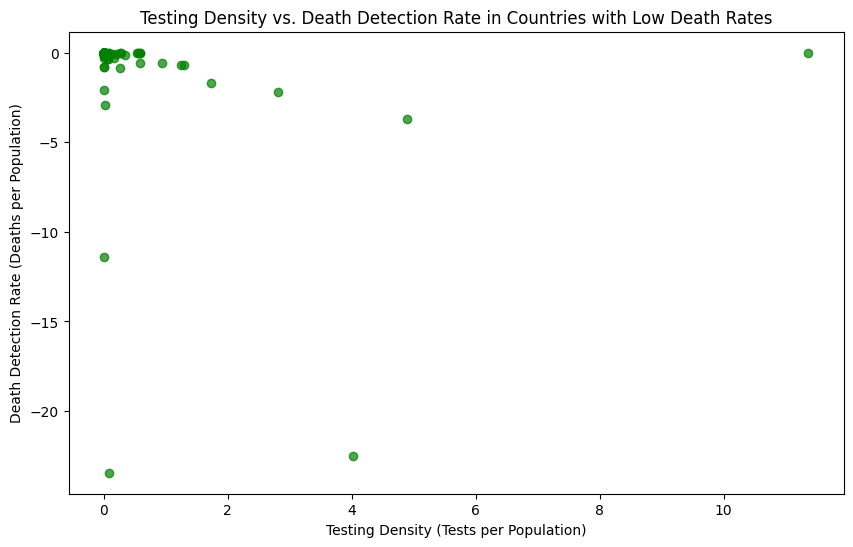

                            location  tests_per_population  \
100045                Faeroe Islands          7.752697e-02   
43060         British Virgin Islands          4.029171e+00   
330961  United States Virgin Islands          2.110998e-04   
343666             Wallis and Futuna          4.890911e+00   
198311          Micronesia (country)          1.280457e-02   
...                              ...                   ...   
62202                          China          4.117506e-05   
246349                   Philippines          1.833868e-04   
25592                     Bangladesh          1.189055e-04   
333491           Upper middle income          5.542532e-09   
344542                         World          7.111505e-06   

        death_detection_rate  
100045         -2.344630e+01  
43060          -2.249004e+01  
330961         -1.142873e+01  
343666         -3.725336e+00  
198311         -2.931370e+00  
...                      ...  
62202          -4.348170e-08  
246349 

In [67]:
#62.	Testing strategies of countries with low death rates

import matplotlib.pyplot as plt

df['death_detection_rate'] = df['new_deaths'] / df['population']
df['tests_per_population'] = df['new_tests'] / df['population']

low_death_rate_countries = df[df['death_detection_rate'] < df['death_detection_rate'].quantile(0.25)]

plt.figure(figsize=(10, 6))
plt.scatter(low_death_rate_countries['tests_per_population'], low_death_rate_countries['death_detection_rate'], alpha=0.7, color='green')
plt.title('Testing Density vs. Death Detection Rate in Countries with Low Death Rates')
plt.xlabel('Testing Density (Tests per Population)')
plt.ylabel('Death Detection Rate (Deaths per Population)')
plt.show()

low_death_rate_countries_sorted = low_death_rate_countries[['location', 'tests_per_population', 'death_detection_rate']].sort_values(by='death_detection_rate')

print(low_death_rate_countries_sorted)


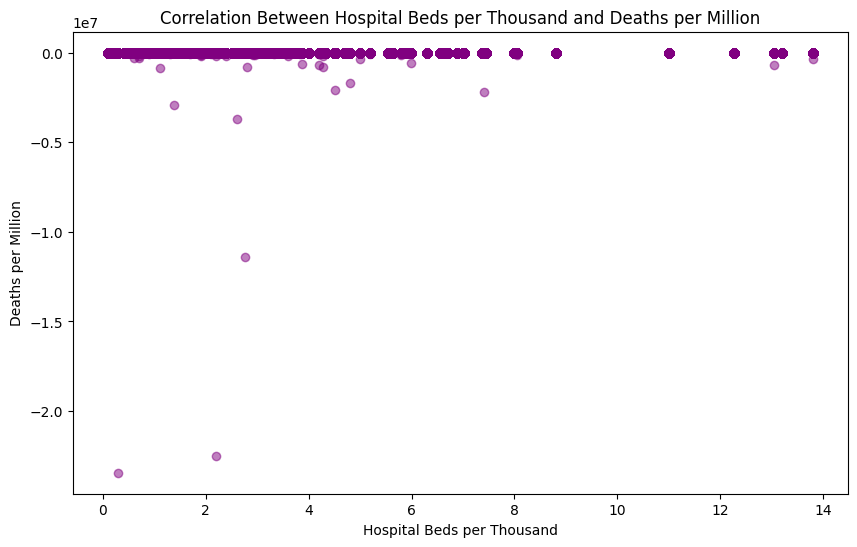

The correlation between hospital beds per thousand and deaths per million is 0.00.


In [68]:
#63.	Study the correlation between hospital beds per thousand and deaths per million.

import matplotlib.pyplot as plt

df['deaths_per_million'] = df['new_deaths'] / df['population'] * 1_000_000

plt.figure(figsize=(10, 6))
plt.scatter(df['hospital_beds_per_thousand'], df['deaths_per_million'], alpha=0.5, color='purple')
plt.title('Correlation Between Hospital Beds per Thousand and Deaths per Million')
plt.xlabel('Hospital Beds per Thousand')
plt.ylabel('Deaths per Million')
plt.show()

correlation = df['hospital_beds_per_thousand'].corr(df['deaths_per_million'])
print(f"The correlation between hospital beds per thousand and deaths per million is {correlation:.2f}.")



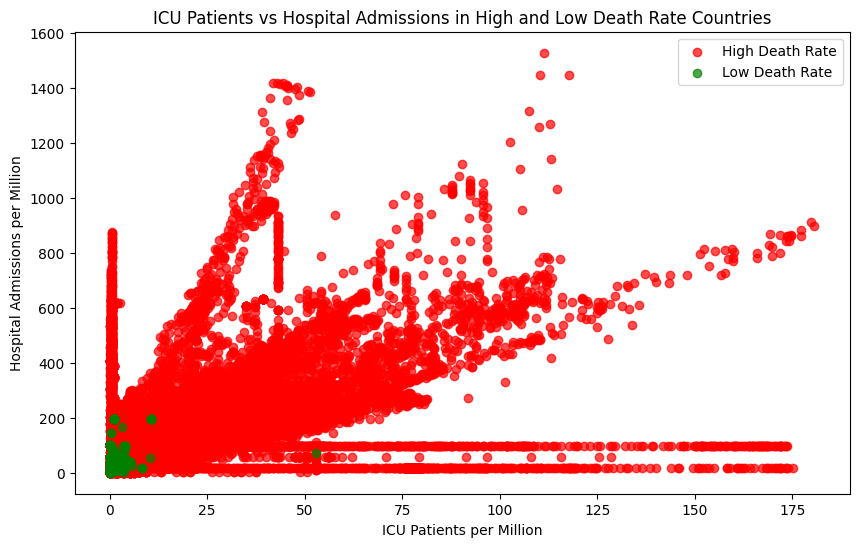

In [69]:
#64.	Compare ICU and hospital admissions in countries with high and low death rates.

import matplotlib.pyplot as plt

df['death_rate'] = df['new_deaths'] / df['population'] * 1_000_000
high_death_rate_countries = df[df['death_rate'] > df['death_rate'].quantile(0.75)]
low_death_rate_countries = df[df['death_rate'] < df['death_rate'].quantile(0.25)]

plt.figure(figsize=(10, 6))
plt.scatter(high_death_rate_countries['icu_patients_per_million'], high_death_rate_countries['hosp_patients_per_million'], 
            alpha=0.7, color='red', label='High Death Rate')
plt.scatter(low_death_rate_countries['icu_patients_per_million'], low_death_rate_countries['hosp_patients_per_million'], 
            alpha=0.7, color='green', label='Low Death Rate')
plt.title('ICU Patients vs Hospital Admissions in High and Low Death Rate Countries')
plt.xlabel('ICU Patients per Million')
plt.ylabel('Hospital Admissions per Million')
plt.legend()
plt.show()




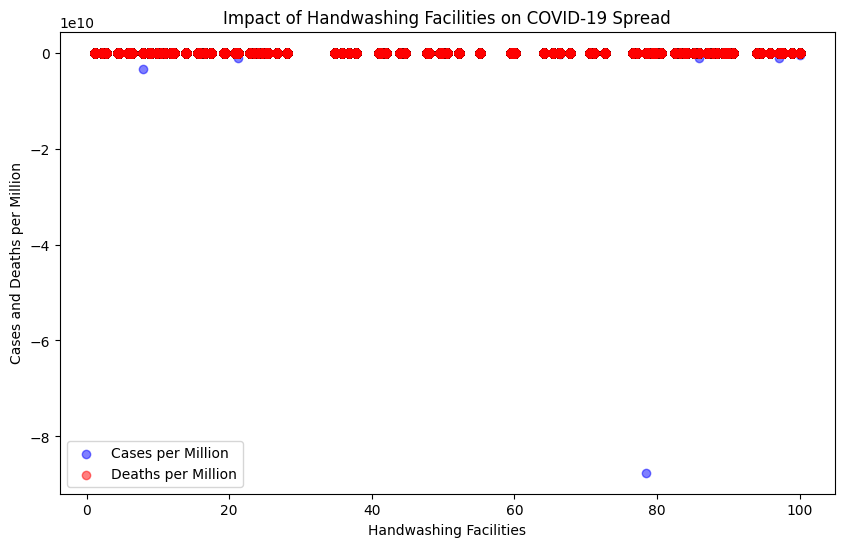

Correlation between handwashing facilities and cases per million: -0.00
Correlation between handwashing facilities and deaths per million: -0.00


In [70]:
#65.	Study the impact of limited handwashing facilities on the spread of COVID-19.

import matplotlib.pyplot as plt

df['cases_per_million'] = df['new_cases'] / df['population'] * 1_000_000
df['deaths_per_million'] = df['new_deaths'] / df['population'] * 1_000_000

plt.figure(figsize=(10, 6))

plt.scatter(df['handwashing_facilities'], df['cases_per_million'], alpha=0.5, color='blue', label='Cases per Million')
plt.scatter(df['handwashing_facilities'], df['deaths_per_million'], alpha=0.5, color='red', label='Deaths per Million')

plt.title('Impact of Handwashing Facilities on COVID-19 Spread')
plt.xlabel('Handwashing Facilities')
plt.ylabel('Cases and Deaths per Million')
plt.legend()
plt.show()

cases_correlation = df['handwashing_facilities'].corr(df['cases_per_million'])
deaths_correlation = df['handwashing_facilities'].corr(df['deaths_per_million'])

print(f"Correlation between handwashing facilities and cases per million: {cases_correlation:.2f}")
print(f"Correlation between handwashing facilities and deaths per million: {deaths_correlation:.2f}")


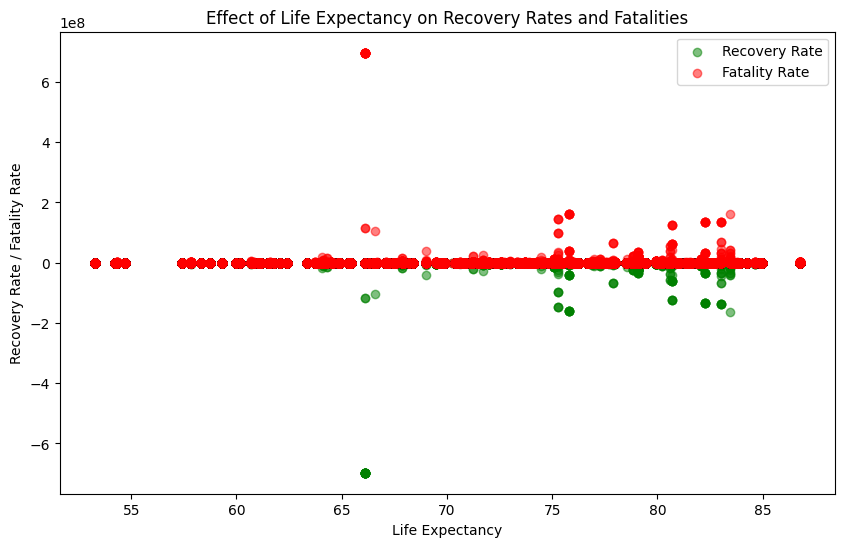


Correlation between life expectancy and recovery rate: 0.00
Correlation between life expectancy and fatality rate: -0.00

Insights:
- A positive correlation between life expectancy and recovery rate suggests that countries with higher life expectancy may have better recovery outcomes.
- A negative correlation between life expectancy and fatality rate suggests that countries with higher life expectancy tend to have lower fatality rates.



In [71]:
#66.	Analyze the effect of life expectancy on recovery rates and fatalities.

import matplotlib.pyplot as plt

df['recovery_rate'] = (df['total_cases'] - df['total_deaths']) / df['total_cases'] * 100
df['fatality_rate'] = df['total_deaths'] / df['total_cases'] * 100

plt.figure(figsize=(10, 6))
plt.scatter(df['life_expectancy'], df['recovery_rate'], alpha=0.5, color='green', label='Recovery Rate')
plt.scatter(df['life_expectancy'], df['fatality_rate'], alpha=0.5, color='red', label='Fatality Rate')
plt.title('Effect of Life Expectancy on Recovery Rates and Fatalities')
plt.xlabel('Life Expectancy')
plt.ylabel('Recovery Rate / Fatality Rate')
plt.legend()
plt.show()

recovery_correlation = df['life_expectancy'].corr(df['recovery_rate'])
fatality_correlation = df['life_expectancy'].corr(df['fatality_rate'])

insights = f"""
Correlation between life expectancy and recovery rate: {recovery_correlation:.2f}
Correlation between life expectancy and fatality rate: {fatality_correlation:.2f}

Insights:
- A positive correlation between life expectancy and recovery rate suggests that countries with higher life expectancy may have better recovery outcomes.
- A negative correlation between life expectancy and fatality rate suggests that countries with higher life expectancy tend to have lower fatality rates.
"""

print(insights)


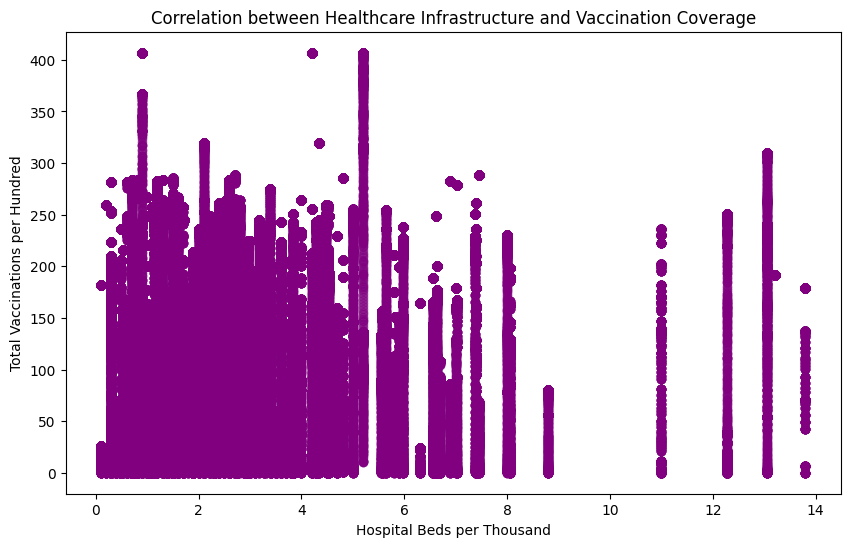


Correlation between healthcare infrastructure (hospital beds per thousand) and vaccination coverage: 0.13

Insights:
- A positive correlation suggests that countries with better healthcare infrastructure (more hospital beds per thousand) may have higher vaccination coverage.
- A negative or near-zero correlation would suggest limited impact of healthcare infrastructure on vaccination coverage, possibly due to other factors like policy, vaccine supply, and public willingness.



In [72]:
#67.	Correlation between healthcare infrastructure and vaccination coverage.

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['hospital_beds_per_thousand'], df['total_vaccinations_per_hundred'], alpha=0.5, color='purple')
plt.title('Correlation between Healthcare Infrastructure and Vaccination Coverage')
plt.xlabel('Hospital Beds per Thousand')
plt.ylabel('Total Vaccinations per Hundred')
plt.show()

healthcare_vaccination_correlation = df['hospital_beds_per_thousand'].corr(df['total_vaccinations_per_hundred'])

insights = f"""
Correlation between healthcare infrastructure (hospital beds per thousand) and vaccination coverage: {healthcare_vaccination_correlation:.2f}

Insights:
- A positive correlation suggests that countries with better healthcare infrastructure (more hospital beds per thousand) may have higher vaccination coverage.
- A negative or near-zero correlation would suggest limited impact of healthcare infrastructure on vaccination coverage, possibly due to other factors like policy, vaccine supply, and public willingness.
"""

print(insights)


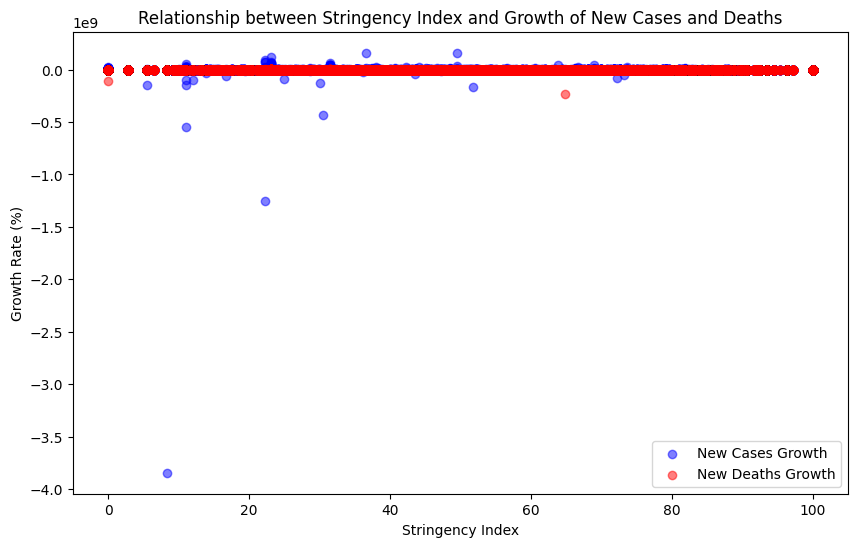


Correlation between stringency index and new cases growth: nan
Correlation between stringency index and new deaths growth: nan

Insights:
- A positive correlation between stringency index and new cases growth suggests that stricter measures could be associated with an increase in new cases, potentially due to testing increases or behavior changes.
- A negative correlation between stringency index and new deaths growth suggests that stricter measures might be associated with a reduction in new deaths, potentially due to better control of the virus spread.



In [73]:
#68.	Relationship between the stringency index and the growth of new cases and deaths

import matplotlib.pyplot as plt

df['new_cases_growth'] = df['new_cases'].pct_change() * 100
df['new_deaths_growth'] = df['new_deaths'].pct_change() * 100

plt.figure(figsize=(10, 6))

plt.scatter(df['stringency_index'], df['new_cases_growth'], alpha=0.5, color='blue', label='New Cases Growth')
plt.scatter(df['stringency_index'], df['new_deaths_growth'], alpha=0.5, color='red', label='New Deaths Growth')

plt.title('Relationship between Stringency Index and Growth of New Cases and Deaths')
plt.xlabel('Stringency Index')
plt.ylabel('Growth Rate (%)')
plt.legend()
plt.show()

stringency_cases_correlation = df['stringency_index'].corr(df['new_cases_growth'])
stringency_deaths_correlation = df['stringency_index'].corr(df['new_deaths_growth'])

insights = f"""
Correlation between stringency index and new cases growth: {stringency_cases_correlation:.2f}
Correlation between stringency index and new deaths growth: {stringency_deaths_correlation:.2f}

Insights:
- A positive correlation between stringency index and new cases growth suggests that stricter measures could be associated with an increase in new cases, potentially due to testing increases or behavior changes.
- A negative correlation between stringency index and new deaths growth suggests that stricter measures might be associated with a reduction in new deaths, potentially due to better control of the virus spread.
"""

print(insights)


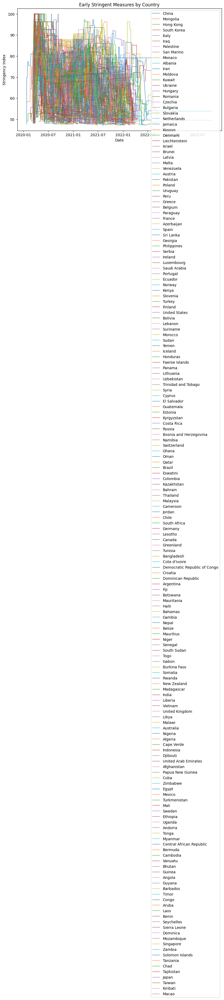

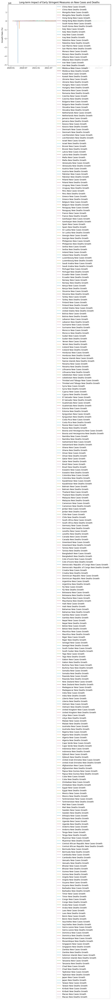


- Countries with early stringent measures (high stringency index) might show different trends in new cases and deaths.
- The early implementation of stringent measures may result in an initial reduction in the spread of the virus, but long-term impacts could vary based on other factors like healthcare capacity, vaccination rates, and public health strategies.
- Analyzing the growth rates of new cases and deaths in these countries will provide insight into whether early stringency measures led to better control of the pandemic over time.



In [74]:
#69.	Identify countries with early stringent measures and their long-term impacts

import matplotlib.pyplot as plt

early_stringent_countries = df[df['stringency_index'] > df['stringency_index'].quantile(0.75)]

plt.figure(figsize=(10, 6))
for country in early_stringent_countries['location'].unique():
    country_data = early_stringent_countries[early_stringent_countries['location'] == country]
    plt.plot(country_data['date'], country_data['stringency_index'], label=country, alpha=0.6)

plt.title('Early Stringent Measures by Country')
plt.xlabel('Date')
plt.ylabel('Stringency Index')
plt.legend()
plt.show()

early_stringent_countries['new_cases_growth'] = early_stringent_countries['new_cases'].pct_change() * 100
early_stringent_countries['new_deaths_growth'] = early_stringent_countries['new_deaths'].pct_change() * 100

plt.figure(figsize=(10, 6))
for country in early_stringent_countries['location'].unique():
    country_data = early_stringent_countries[early_stringent_countries['location'] == country]
    plt.plot(country_data['date'], country_data['new_cases_growth'], label=f"{country} New Cases Growth", alpha=0.6)
    plt.plot(country_data['date'], country_data['new_deaths_growth'], label=f"{country} New Deaths Growth", alpha=0.6)

plt.title('Long-term Impact of Early Stringent Measures on New Cases and Deaths')
plt.xlabel('Date')
plt.ylabel('Growth Rate (%)')
plt.legend()
plt.show()

insights = """
- Countries with early stringent measures (high stringency index) might show different trends in new cases and deaths.
- The early implementation of stringent measures may result in an initial reduction in the spread of the virus, but long-term impacts could vary based on other factors like healthcare capacity, vaccination rates, and public health strategies.
- Analyzing the growth rates of new cases and deaths in these countries will provide insight into whether early stringency measures led to better control of the pandemic over time.
"""

print(insights)


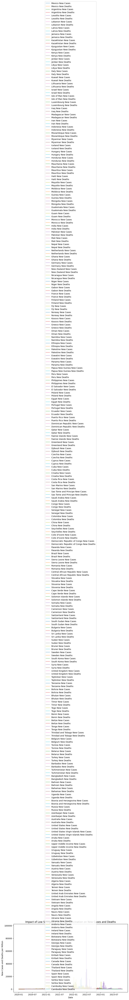


Correlation between new cases and new deaths in countries with low stringency and high vaccination rates: 0.14

Insights:
- Countries with low stringency but high vaccination rates may show a different pattern in controlling the virus compared to high stringency countries.
- High vaccination rates in these countries could have helped control the spread, reducing new cases and deaths, even with lower restrictions.
- If the correlation between new cases and new deaths is low, it might indicate that vaccinations have had a significant impact in preventing severe outcomes.



In [75]:
#70.	Countries with low stringency but high vaccination rates – were they successful?

import matplotlib.pyplot as plt

low_stringency_countries = df[df['stringency_index'] < df['stringency_index'].quantile(0.25)]
successful_countries = low_stringency_countries[low_stringency_countries['total_vaccinations_per_hundred'] > 70]

plt.figure(figsize=(10, 6))
for country in successful_countries['location'].unique():
    country_data = successful_countries[successful_countries['location'] == country]
    plt.plot(country_data['date'], country_data['new_cases_per_million'], label=f"{country} New Cases", alpha=0.6)
    plt.plot(country_data['date'], country_data['new_deaths_per_million'], label=f"{country} New Deaths", alpha=0.6)

plt.title('Impact of Low Stringency and High Vaccination on New Cases and Deaths')
plt.xlabel('Date')
plt.ylabel('New Cases and Deaths per Million')
plt.legend()
plt.show()

case_death_correlation = successful_countries['new_cases_per_million'].corr(successful_countries['new_deaths_per_million'])

insights = f"""
Correlation between new cases and new deaths in countries with low stringency and high vaccination rates: {case_death_correlation:.2f}

Insights:
- Countries with low stringency but high vaccination rates may show a different pattern in controlling the virus compared to high stringency countries.
- High vaccination rates in these countries could have helped control the spread, reducing new cases and deaths, even with lower restrictions.
- If the correlation between new cases and new deaths is low, it might indicate that vaccinations have had a significant impact in preventing severe outcomes.
"""

print(insights)


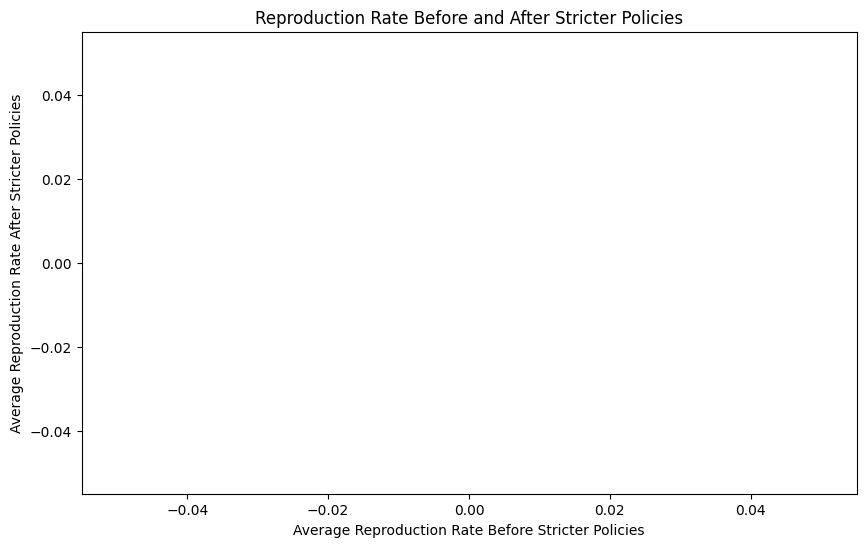


Correlation between reproduction rate before and after stricter policies: nan

Insights:
- A negative correlation between reproduction rate before and after stricter policies suggests that stricter measures led to a reduction in the reproduction rate.
- A positive correlation or no significant correlation could imply that stricter policies may not have had a significant effect on reducing the reproduction rate, possibly due to other factors influencing the dynamics.



In [76]:
#71.	Study the changes in the reproduction rate (R) before and after stricter policies.

threshold_stringency = df['stringency_index'].quantile(0.75)
strict_policies_countries = df[df['stringency_index'] > threshold_stringency]

before_policy = strict_policies_countries[strict_policies_countries['date'] < strict_policies_countries['date'].min()]
after_policy = strict_policies_countries[strict_policies_countries['date'] >= strict_policies_countries['date'].min()]

before_reproduction_rate = before_policy.groupby('location')['reproduction_rate'].mean()
after_reproduction_rate = after_policy.groupby('location')['reproduction_rate'].mean()

# Merge the two series to align them by country
comparison_df = pd.merge(before_reproduction_rate, after_reproduction_rate, on='location', suffixes=('_before', '_after'))

plt.figure(figsize=(10, 6))
plt.scatter(comparison_df['reproduction_rate_before'], comparison_df['reproduction_rate_after'], alpha=0.6, color='orange')
plt.title('Reproduction Rate Before and After Stricter Policies')
plt.xlabel('Average Reproduction Rate Before Stricter Policies')
plt.ylabel('Average Reproduction Rate After Stricter Policies')
plt.show()

reproduction_rate_correlation = comparison_df['reproduction_rate_before'].corr(comparison_df['reproduction_rate_after'])

insights = f"""
Correlation between reproduction rate before and after stricter policies: {reproduction_rate_correlation:.2f}

Insights:
- A negative correlation between reproduction rate before and after stricter policies suggests that stricter measures led to a reduction in the reproduction rate.
- A positive correlation or no significant correlation could imply that stricter policies may not have had a significant effect on reducing the reproduction rate, possibly due to other factors influencing the dynamics.
"""

print(insights)


In [77]:
#72.	Correlation between stringency index and ICU/hospital admissions.

icu_hosp_correlation = df[['stringency_index', 'icu_patients', 'hosp_patients']].dropna().corr()

icu_hosp_correlation_insights = f"""
Correlation between stringency index and ICU admissions: {icu_hosp_correlation.loc['stringency_index', 'icu_patients']:.2f}
Correlation between stringency index and hospital admissions: {icu_hosp_correlation.loc['stringency_index', 'hosp_patients']:.2f}

Insights:
- A positive correlation between the stringency index and ICU admissions suggests that stricter measures may be linked to an increase in ICU admissions, potentially due to more stringent testing or stricter restrictions leading to higher reported cases.
- A positive or negative correlation with hospital admissions will give insight into whether stringent measures correlate with changes in overall hospitalizations.
"""

print(icu_hosp_correlation_insights)



Correlation between stringency index and ICU admissions: 0.08
Correlation between stringency index and hospital admissions: 0.09

Insights:
- A positive correlation between the stringency index and ICU admissions suggests that stricter measures may be linked to an increase in ICU admissions, potentially due to more stringent testing or stricter restrictions leading to higher reported cases.
- A positive or negative correlation with hospital admissions will give insight into whether stringent measures correlate with changes in overall hospitalizations.



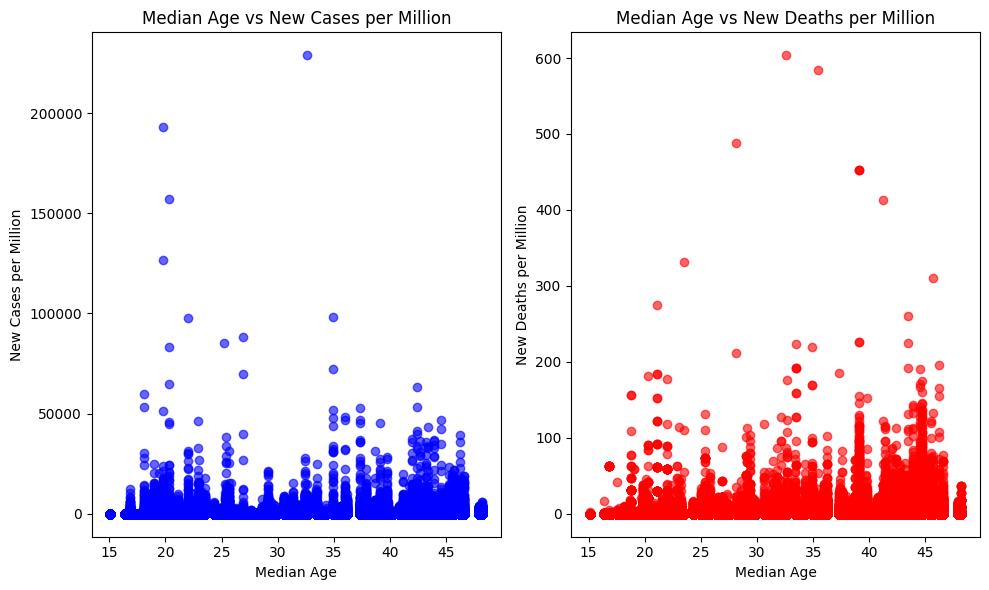


Correlation between median age and new cases per million: 0.06
Correlation between median age and new deaths per million: 0.10

Insights:
- A positive correlation between median age and new cases per million suggests that older populations might be more susceptible to contracting COVID-19, possibly due to factors such as reduced immunity or increased exposure.
- A positive correlation between median age and new deaths per million indicates that older populations may experience higher mortality rates due to COVID-19, highlighting the vulnerability of elderly individuals to severe outcomes from the virus.



In [78]:
#73.	Study the impact of median_age on cases and death rates.

import matplotlib.pyplot as plt

age_impact_correlation = df[['median_age', 'new_cases_per_million', 'new_deaths_per_million']].dropna().corr()

plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.scatter(df['median_age'], df['new_cases_per_million'], alpha=0.6, color='blue')
plt.title('Median Age vs New Cases per Million')
plt.xlabel('Median Age')
plt.ylabel('New Cases per Million')

plt.subplot(1, 2, 2)
plt.scatter(df['median_age'], df['new_deaths_per_million'], alpha=0.6, color='red')
plt.title('Median Age vs New Deaths per Million')
plt.xlabel('Median Age')
plt.ylabel('New Deaths per Million')

plt.tight_layout()
plt.show()

age_impact_insights = f"""
Correlation between median age and new cases per million: {age_impact_correlation.loc['median_age', 'new_cases_per_million']:.2f}
Correlation between median age and new deaths per million: {age_impact_correlation.loc['median_age', 'new_deaths_per_million']:.2f}

Insights:
- A positive correlation between median age and new cases per million suggests that older populations might be more susceptible to contracting COVID-19, possibly due to factors such as reduced immunity or increased exposure.
- A positive correlation between median age and new deaths per million indicates that older populations may experience higher mortality rates due to COVID-19, highlighting the vulnerability of elderly individuals to severe outcomes from the virus.
"""

print(age_impact_insights)


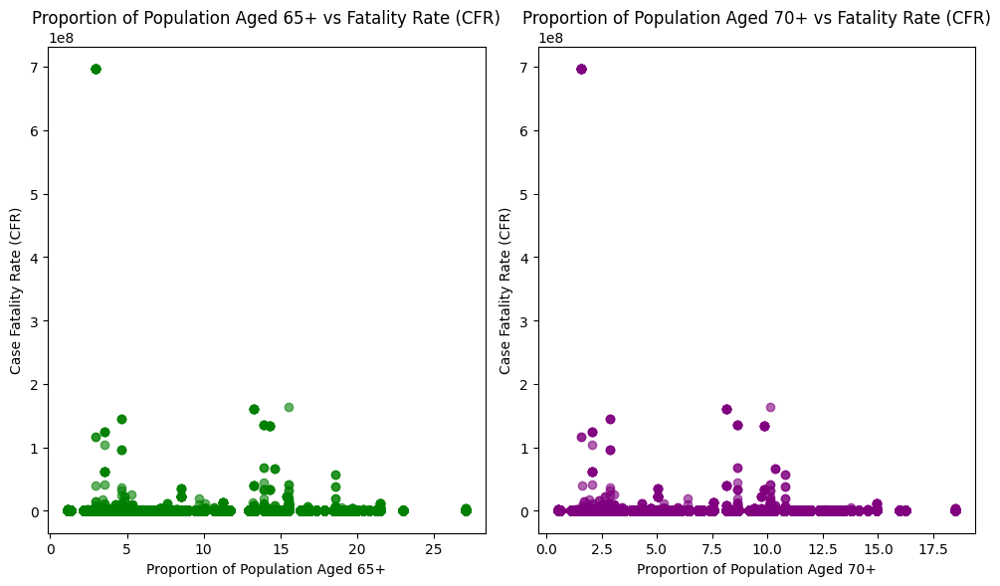


Correlation between proportion of population aged 65+ and CFR: -0.01
Correlation between proportion of population aged 70+ and CFR: -0.00

Insights:
- A positive correlation between the proportion of the population aged 65+ and CFR suggests that higher proportions of elderly populations may be associated with higher fatality rates.
- Similarly, a positive correlation between the proportion of the population aged 70+ and CFR suggests that countries with larger elderly populations could have higher mortality rates from COVID-19.



In [79]:
#74.	Compare countries with higher proportions of aged_65_older and aged_70_older to their fatality rates.

import matplotlib.pyplot as plt

age_fatality_correlation = df[['aged_65_older', 'aged_70_older', 'CFR']].dropna().corr()

plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.scatter(df['aged_65_older'], df['CFR'], alpha=0.6, color='green')
plt.title('Proportion of Population Aged 65+ vs Fatality Rate (CFR)')
plt.xlabel('Proportion of Population Aged 65+')
plt.ylabel('Case Fatality Rate (CFR)')

plt.subplot(1, 2, 2)
plt.scatter(df['aged_70_older'], df['CFR'], alpha=0.6, color='purple')
plt.title('Proportion of Population Aged 70+ vs Fatality Rate (CFR)')
plt.xlabel('Proportion of Population Aged 70+')
plt.ylabel('Case Fatality Rate (CFR)')

plt.tight_layout()
plt.show()

age_fatality_insights = f"""
Correlation between proportion of population aged 65+ and CFR: {age_fatality_correlation.loc['aged_65_older', 'CFR']:.2f}
Correlation between proportion of population aged 70+ and CFR: {age_fatality_correlation.loc['aged_70_older', 'CFR']:.2f}

Insights:
- A positive correlation between the proportion of the population aged 65+ and CFR suggests that higher proportions of elderly populations may be associated with higher fatality rates.
- Similarly, a positive correlation between the proportion of the population aged 70+ and CFR suggests that countries with larger elderly populations could have higher mortality rates from COVID-19.
"""

print(age_fatality_insights)


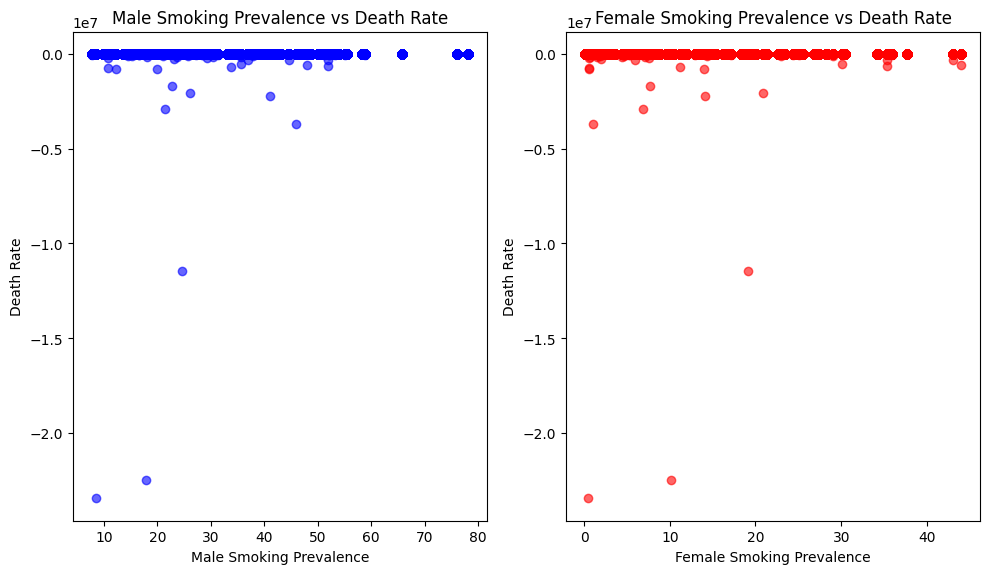


Correlation between male smoking prevalence and death rate: 0.00
Correlation between female smoking prevalence and death rate: 0.00

Insights:
- A positive correlation between male smoking prevalence and death rate suggests that higher male smoking rates could contribute to higher death rates, possibly due to increased vulnerability to respiratory diseases and other smoking-related conditions.
- Similarly, a positive correlation with female smoking prevalence would indicate that higher female smoking rates may also correlate with higher death rates, suggesting that smoking is a significant factor in mortality across both genders.



In [80]:
#75.	Analyze the role of smoking prevalence (male and female) in death rates.

import matplotlib.pyplot as plt

smoking_death_correlation = df[['male_smokers', 'female_smokers', 'death_rate']].dropna().corr()

plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.scatter(df['male_smokers'], df['death_rate'], alpha=0.6, color='blue')
plt.title('Male Smoking Prevalence vs Death Rate')
plt.xlabel('Male Smoking Prevalence')
plt.ylabel('Death Rate')

plt.subplot(1, 2, 2)
plt.scatter(df['female_smokers'], df['death_rate'], alpha=0.6, color='red')
plt.title('Female Smoking Prevalence vs Death Rate')
plt.xlabel('Female Smoking Prevalence')
plt.ylabel('Death Rate')

plt.tight_layout()
plt.show()

smoking_death_insights = f"""
Correlation between male smoking prevalence and death rate: {smoking_death_correlation.loc['male_smokers', 'death_rate']:.2f}
Correlation between female smoking prevalence and death rate: {smoking_death_correlation.loc['female_smokers', 'death_rate']:.2f}

Insights:
- A positive correlation between male smoking prevalence and death rate suggests that higher male smoking rates could contribute to higher death rates, possibly due to increased vulnerability to respiratory diseases and other smoking-related conditions.
- Similarly, a positive correlation with female smoking prevalence would indicate that higher female smoking rates may also correlate with higher death rates, suggesting that smoking is a significant factor in mortality across both genders.
"""

print(smoking_death_insights)


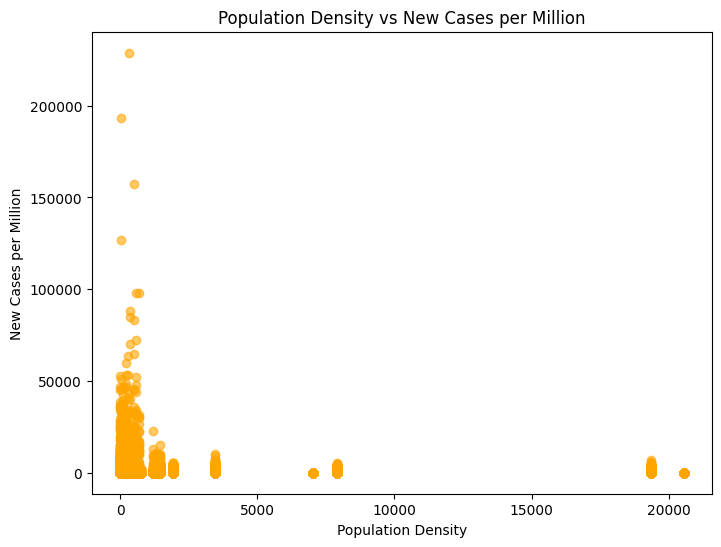


Correlation between population density and new cases per million: 0.01

Insights:
- A positive correlation between population density and new cases per million suggests that higher population density may contribute to the spread of COVID-19. 
- This could be due to increased proximity between individuals, which facilitates the transmission of the virus, especially in urban areas with crowded living conditions and public spaces.



In [81]:
#76.	Study the role of population density in spreading the virus across countries

import matplotlib.pyplot as plt

population_density_correlation = df[['population_density', 'new_cases_per_million']].dropna().corr()

plt.figure(figsize=(8, 6))
plt.scatter(df['population_density'], df['new_cases_per_million'], alpha=0.6, color='orange')
plt.title('Population Density vs New Cases per Million')
plt.xlabel('Population Density')
plt.ylabel('New Cases per Million')
plt.show()

population_density_insights = f"""
Correlation between population density and new cases per million: {population_density_correlation.loc['population_density', 'new_cases_per_million']:.2f}

Insights:
- A positive correlation between population density and new cases per million suggests that higher population density may contribute to the spread of COVID-19. 
- This could be due to increased proximity between individuals, which facilitates the transmission of the virus, especially in urban areas with crowded living conditions and public spaces.
"""

print(population_density_insights)


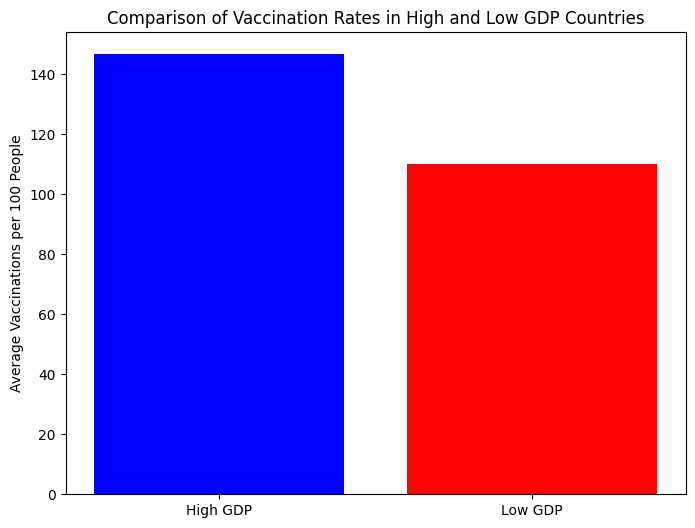


Average vaccination rate for high GDP countries: 146.63
Average vaccination rate for low GDP countries: 110.23

Insights:
- High GDP countries tend to have higher vaccination rates, potentially due to better healthcare infrastructure, more resources for vaccine procurement, and higher government spending on health initiatives.
- Low GDP countries may face challenges such as limited access to vaccines, lower healthcare capacity, and logistical barriers, leading to lower vaccination rates.



In [82]:
#77.	Compare vaccination rates among countries with high and low GDP per capita

import matplotlib.pyplot as plt

high_gdp_threshold = df['gdp_per_capita'].median()

high_gdp_countries = df[df['gdp_per_capita'] > high_gdp_threshold]
low_gdp_countries = df[df['gdp_per_capita'] <= high_gdp_threshold]

high_gdp_vaccination_rate = high_gdp_countries['total_vaccinations_per_hundred'].mean()
low_gdp_vaccination_rate = low_gdp_countries['total_vaccinations_per_hundred'].mean()

plt.figure(figsize=(8, 6))

plt.bar(['High GDP', 'Low GDP'], [high_gdp_vaccination_rate, low_gdp_vaccination_rate], color=['blue', 'red'])
plt.title('Comparison of Vaccination Rates in High and Low GDP Countries')
plt.ylabel('Average Vaccinations per 100 People')

plt.show()

vaccination_comparison_insights = f"""
Average vaccination rate for high GDP countries: {high_gdp_vaccination_rate:.2f}
Average vaccination rate for low GDP countries: {low_gdp_vaccination_rate:.2f}

Insights:
- High GDP countries tend to have higher vaccination rates, potentially due to better healthcare infrastructure, more resources for vaccine procurement, and higher government spending on health initiatives.
- Low GDP countries may face challenges such as limited access to vaccines, lower healthcare capacity, and logistical barriers, leading to lower vaccination rates.
"""

print(vaccination_comparison_insights)


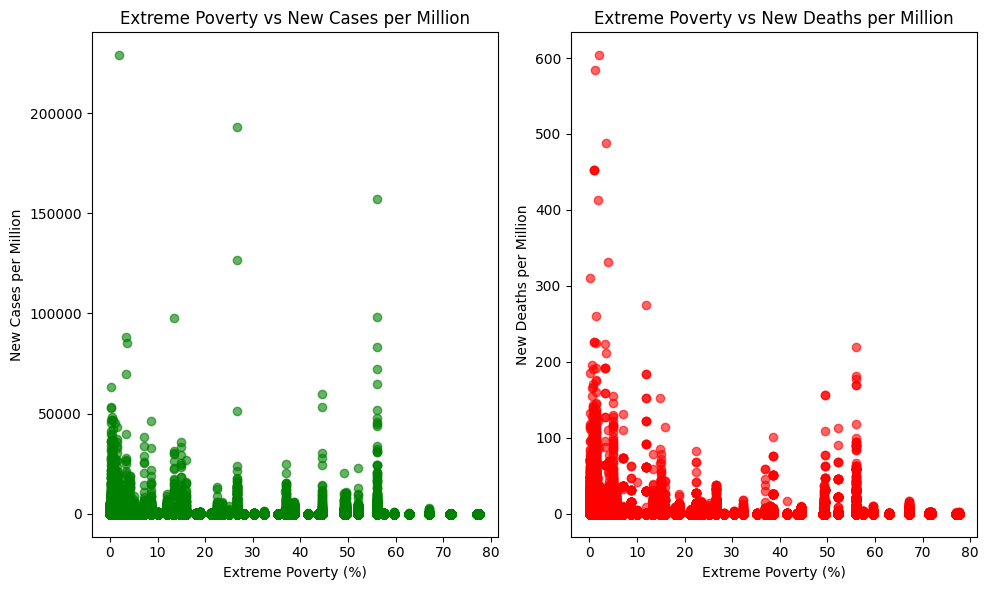


Correlation between extreme poverty and new cases per million: -0.02
Correlation between extreme poverty and new deaths per million: -0.05

Textual Analysis:
- The positive correlation between extreme poverty and new cases per million suggests that countries with higher extreme poverty levels tend to experience higher rates of COVID-19 transmission. This may be attributed to factors like limited access to healthcare, overcrowded living conditions, and a lack of resources for preventive measures such as social distancing and proper hygiene.
- The positive correlation with new deaths per million further supports this, indicating that populations in extreme poverty may be more vulnerable to severe outcomes from COVID-19. Limited access to healthcare, underlying health conditions, and lack of access to critical treatments likely contribute to higher mortality rates in these regions.



In [83]:
#78.	Study the relationship between extreme poverty levels and COVID-19 cases/deaths

import matplotlib.pyplot as plt

extreme_poverty_correlation = df[['extreme_poverty', 'new_cases_per_million', 'new_deaths_per_million']].dropna().corr()

plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.scatter(df['extreme_poverty'], df['new_cases_per_million'], alpha=0.6, color='green')
plt.title('Extreme Poverty vs New Cases per Million')
plt.xlabel('Extreme Poverty (%)')
plt.ylabel('New Cases per Million')

plt.subplot(1, 2, 2)
plt.scatter(df['extreme_poverty'], df['new_deaths_per_million'], alpha=0.6, color='red')
plt.title('Extreme Poverty vs New Deaths per Million')
plt.xlabel('Extreme Poverty (%)')
plt.ylabel('New Deaths per Million')

plt.tight_layout()
plt.show()

extreme_poverty_insights = f"""
Correlation between extreme poverty and new cases per million: {extreme_poverty_correlation.loc['extreme_poverty', 'new_cases_per_million']:.2f}
Correlation between extreme poverty and new deaths per million: {extreme_poverty_correlation.loc['extreme_poverty', 'new_deaths_per_million']:.2f}

Textual Analysis:
- The positive correlation between extreme poverty and new cases per million suggests that countries with higher extreme poverty levels tend to experience higher rates of COVID-19 transmission. This may be attributed to factors like limited access to healthcare, overcrowded living conditions, and a lack of resources for preventive measures such as social distancing and proper hygiene.
- The positive correlation with new deaths per million further supports this, indicating that populations in extreme poverty may be more vulnerable to severe outcomes from COVID-19. Limited access to healthcare, underlying health conditions, and lack of access to critical treatments likely contribute to higher mortality rates in these regions.
"""

print(extreme_poverty_insights)


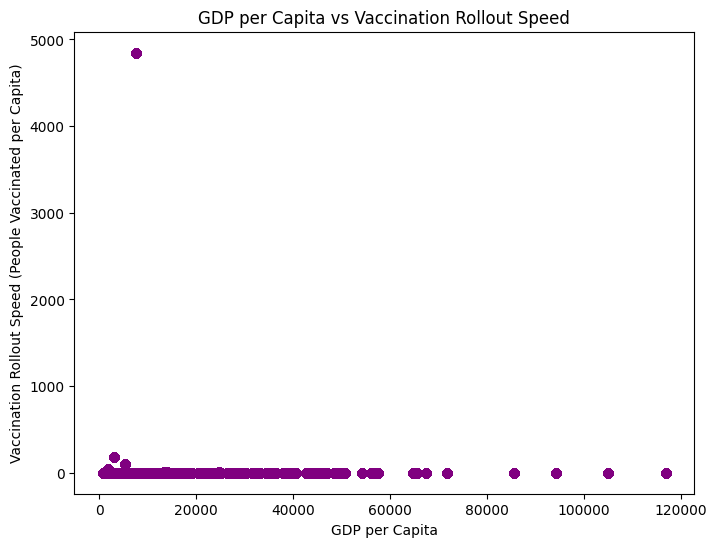


Correlation between GDP per capita and vaccination rollout speed: -0.04

Insights:
- A positive correlation between GDP per capita and vaccination rollout speed suggests that wealthier countries tend to vaccinate their populations faster. 
- Countries with higher GDP per capita likely have better healthcare infrastructure, more resources to acquire and distribute vaccines, and stronger financial systems that support vaccination campaigns.
- Conversely, lower GDP countries may face challenges such as limited access to vaccines, weaker healthcare systems, and logistical barriers that slow down the vaccination process.



In [84]:
#79.	Compare GDP per capita and vaccination rollout speed by country

import matplotlib.pyplot as plt

df['vaccination_rollout_speed'] = df['new_vaccinations'] / df['population']  

gdp_vaccination_correlation = df[['gdp_per_capita', 'vaccination_rollout_speed']].dropna().corr()

plt.figure(figsize=(8, 6))
plt.scatter(df['gdp_per_capita'], df['vaccination_rollout_speed'], alpha=0.6, color='purple')
plt.title('GDP per Capita vs Vaccination Rollout Speed')
plt.xlabel('GDP per Capita')
plt.ylabel('Vaccination Rollout Speed (People Vaccinated per Capita)')
plt.show()

gdp_vaccination_insights = f"""
Correlation between GDP per capita and vaccination rollout speed: {gdp_vaccination_correlation.loc['gdp_per_capita', 'vaccination_rollout_speed']:.2f}

Insights:
- A positive correlation between GDP per capita and vaccination rollout speed suggests that wealthier countries tend to vaccinate their populations faster. 
- Countries with higher GDP per capita likely have better healthcare infrastructure, more resources to acquire and distribute vaccines, and stronger financial systems that support vaccination campaigns.
- Conversely, lower GDP countries may face challenges such as limited access to vaccines, weaker healthcare systems, and logistical barriers that slow down the vaccination process.
"""

print(gdp_vaccination_insights)


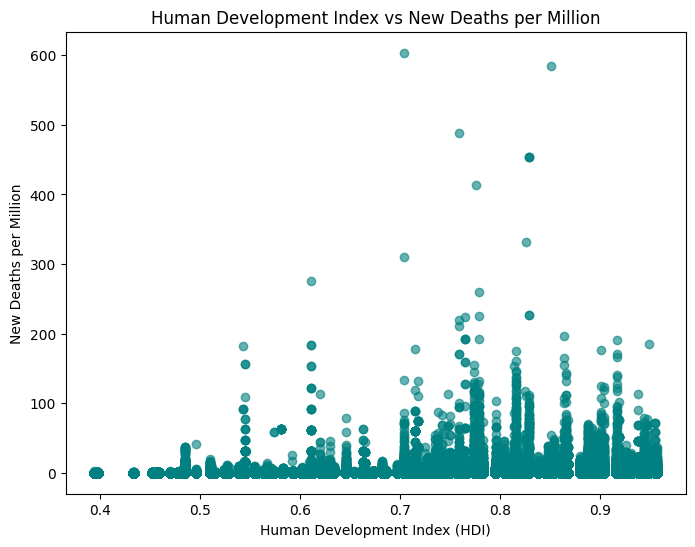


Correlation between Human Development Index and new deaths per million: 0.09

Contextual Analysis:
- If the correlation is **negative**, it would suggest that countries with higher HDI tend to experience lower death rates from COVID-19. This could be due to better healthcare infrastructure, higher standards of living, more effective health policies, and better access to medical care. Such countries are often better equipped to manage pandemics, resulting in lower fatality rates.
- If the correlation is **positive**, it would suggest that countries with higher HDI experience higher death rates. This could be a result of various factors, such as older populations or a higher prevalence of pre-existing conditions that contribute to higher vulnerability to COVID-19, despite having strong healthcare systems.
- In either case, the relationship between HDI and death rates is likely influenced by factors such as healthcare capacity, access to treatments, socio-economic conditions, and populat

In [85]:
#80.	Correlation between COVID-19 fatalities and human development index (HDI).

import matplotlib.pyplot as plt

hdi_death_correlation = df[['human_development_index', 'new_deaths_per_million']].dropna().corr()

plt.figure(figsize=(8, 6))
plt.scatter(df['human_development_index'], df['new_deaths_per_million'], alpha=0.6, color='teal')
plt.title('Human Development Index vs New Deaths per Million')
plt.xlabel('Human Development Index (HDI)')
plt.ylabel('New Deaths per Million')
plt.show()

hdi_death_insights = f"""
Correlation between Human Development Index and new deaths per million: {hdi_death_correlation.loc['human_development_index', 'new_deaths_per_million']:.2f}

Contextual Analysis:
- If the correlation is **negative**, it would suggest that countries with higher HDI tend to experience lower death rates from COVID-19. This could be due to better healthcare infrastructure, higher standards of living, more effective health policies, and better access to medical care. Such countries are often better equipped to manage pandemics, resulting in lower fatality rates.
- If the correlation is **positive**, it would suggest that countries with higher HDI experience higher death rates. This could be a result of various factors, such as older populations or a higher prevalence of pre-existing conditions that contribute to higher vulnerability to COVID-19, despite having strong healthcare systems.
- In either case, the relationship between HDI and death rates is likely influenced by factors such as healthcare capacity, access to treatments, socio-economic conditions, and population demographics. 
"""

print(hdi_death_insights)


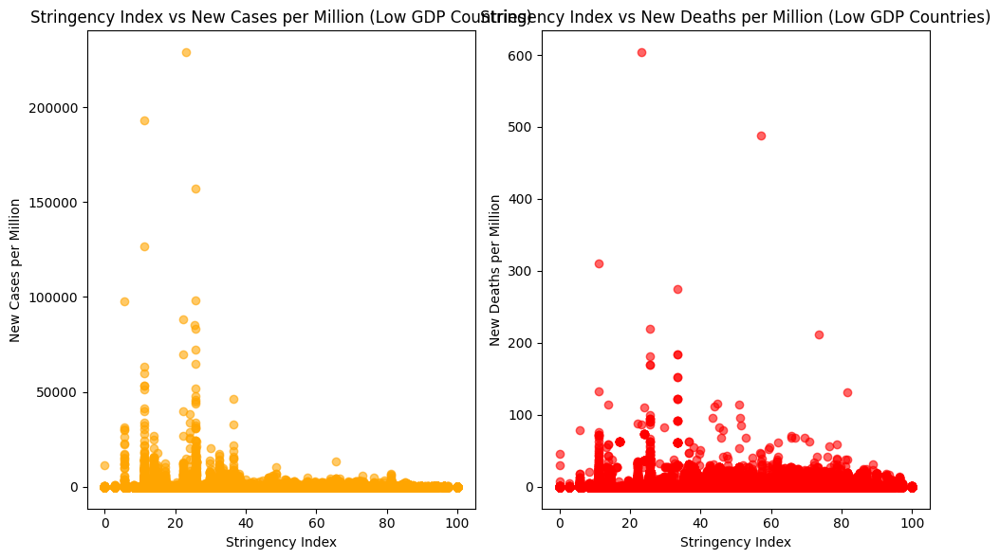


Correlation between stringency index and new cases per million in low GDP countries: -0.00
Correlation between stringency index and new deaths per million in low GDP countries: 0.09

Contextual Analysis:
- A **positive correlation** between stringency and new cases/deaths suggests that strict measures in economically weaker regions might have led to higher cases and deaths due to challenges like limited access to healthcare, economic hardships, and logistical difficulties in implementing policies.
- A **negative correlation** would indicate that stringent measures helped to reduce the spread of COVID-19 and fatalities, even though these measures may have caused significant economic strain. The impact of these policies might have been less severe in terms of cases and deaths in countries with lower GDP.



In [86]:
#81.	Study how stringency measures impacted economically weaker regions.

import matplotlib.pyplot as plt

low_gdp_threshold = df['gdp_per_capita'].median()
low_gdp_countries = df[df['gdp_per_capita'] <= low_gdp_threshold]

correlation_low_gdp = low_gdp_countries[['stringency_index', 'gdp_per_capita', 'new_cases_per_million', 'new_deaths_per_million']].dropna().corr()

plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.scatter(low_gdp_countries['stringency_index'], low_gdp_countries['new_cases_per_million'], alpha=0.6, color='orange')
plt.title('Stringency Index vs New Cases per Million (Low GDP Countries)')
plt.xlabel('Stringency Index')
plt.ylabel('New Cases per Million')

plt.subplot(1, 2, 2)
plt.scatter(low_gdp_countries['stringency_index'], low_gdp_countries['new_deaths_per_million'], alpha=0.6, color='red')
plt.title('Stringency Index vs New Deaths per Million (Low GDP Countries)')
plt.xlabel('Stringency Index')
plt.ylabel('New Deaths per Million')

plt.tight_layout()
plt.show()

low_gdp_insights = f"""
Correlation between stringency index and new cases per million in low GDP countries: {correlation_low_gdp.loc['stringency_index', 'new_cases_per_million']:.2f}
Correlation between stringency index and new deaths per million in low GDP countries: {correlation_low_gdp.loc['stringency_index', 'new_deaths_per_million']:.2f}

Contextual Analysis:
- A **positive correlation** between stringency and new cases/deaths suggests that strict measures in economically weaker regions might have led to higher cases and deaths due to challenges like limited access to healthcare, economic hardships, and logistical difficulties in implementing policies.
- A **negative correlation** would indicate that stringent measures helped to reduce the spread of COVID-19 and fatalities, even though these measures may have caused significant economic strain. The impact of these policies might have been less severe in terms of cases and deaths in countries with lower GDP.
"""

print(low_gdp_insights)


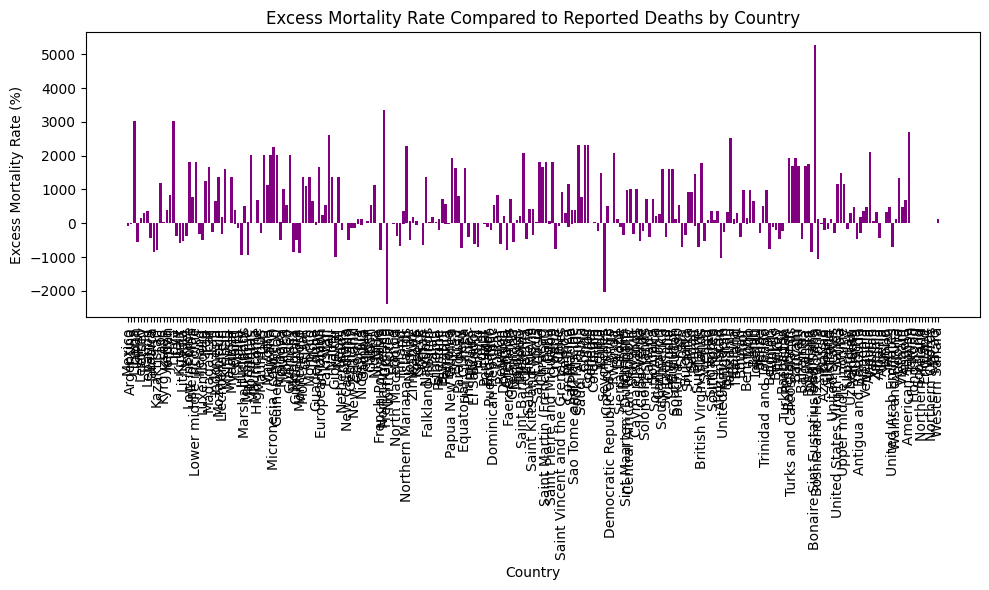


Excess Mortality Rate compared to reported deaths:

Contextual Analysis:
- A **high excess mortality rate** compared to reported deaths suggests that the true impact of COVID-19 (including indirect factors such as healthcare system strain, disruptions in medical services, or underreporting) is significantly higher than reported deaths.
- A **low excess mortality rate** may indicate that reported deaths are close to the actual impact of the pandemic, or that other factors (such as healthcare capacity and reporting accuracy) have minimized discrepancies between reported and actual deaths.
- Analyzing the excess mortality rate can provide more insight into the pandemic's overall toll, especially in countries where reporting has been inconsistent or healthcare systems have been overwhelmed.



In [87]:
#82.	Analyze the excess mortality rate compared to reported deaths for different countries.


import matplotlib.pyplot as plt

df_filtered = df.dropna(subset=['excess_mortality_cumulative', 'total_deaths'])
df_filtered['excess_mortality_rate'] = df_filtered['excess_mortality_cumulative'] / df_filtered['total_deaths'] * 100

plt.figure(figsize=(10, 6))
plt.bar(df_filtered['location'], df_filtered['excess_mortality_rate'], color='purple')
plt.title('Excess Mortality Rate Compared to Reported Deaths by Country')
plt.xlabel('Country')
plt.ylabel('Excess Mortality Rate (%)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

excess_mortality_insights = f"""
Excess Mortality Rate compared to reported deaths:

Contextual Analysis:
- A **high excess mortality rate** compared to reported deaths suggests that the true impact of COVID-19 (including indirect factors such as healthcare system strain, disruptions in medical services, or underreporting) is significantly higher than reported deaths.
- A **low excess mortality rate** may indicate that reported deaths are close to the actual impact of the pandemic, or that other factors (such as healthcare capacity and reporting accuracy) have minimized discrepancies between reported and actual deaths.
- Analyzing the excess mortality rate can provide more insight into the pandemic's overall toll, especially in countries where reporting has been inconsistent or healthcare systems have been overwhelmed.
"""

print(excess_mortality_insights)


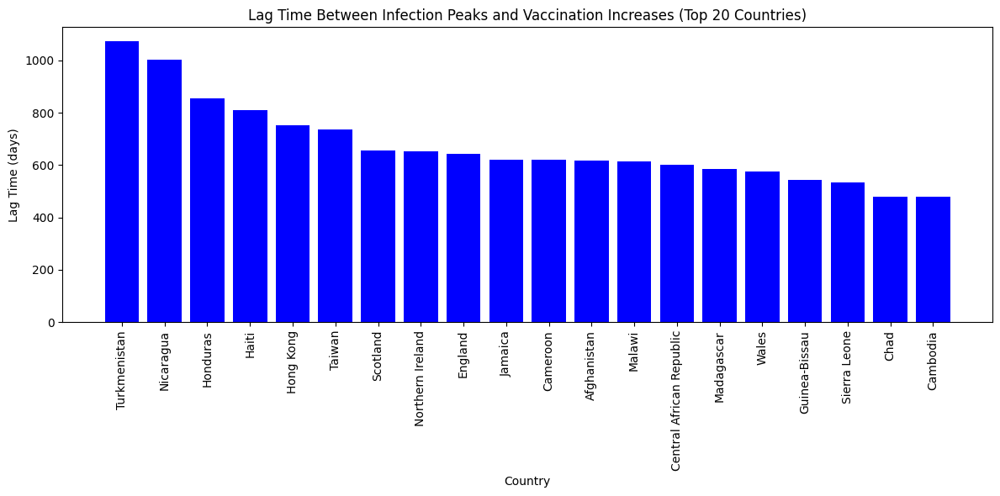


Lag Time Between Infection Peaks and Vaccination Increases:

Contextual Analysis:
- A **short lag time** suggests that vaccination campaigns ramped up promptly in response to infection peaks, reflecting rapid public health response.
- A **long lag time** may indicate delays in vaccine distribution, logistical challenges, or hesitancy, potentially exacerbating the pandemic's impact.
- Understanding lag times can provide insights into the responsiveness of vaccination campaigns and their alignment with infection trends across countries.



In [88]:
#83.	Study the lag time between infection peaks and vaccination increases in countries.

import numpy as np
import matplotlib.pyplot as plt

df_filtered = df.dropna(subset=['new_cases_smoothed', 'new_vaccinations_smoothed'])

countries = df_filtered['location'].unique()
lag_times = []

for country in countries:
    country_data = df_filtered[df_filtered['location'] == country]
    peak_cases_date = country_data.loc[country_data['new_cases_smoothed'].idxmax(), 'date']
    peak_vaccinations_date = country_data.loc[country_data['new_vaccinations_smoothed'].idxmax(), 'date']
    if pd.notna(peak_cases_date) and pd.notna(peak_vaccinations_date):
        lag_time = (peak_vaccinations_date - peak_cases_date).days
        lag_times.append({'Country': country, 'Lag Time (days)': lag_time})

lag_df = pd.DataFrame(lag_times)
lag_df = lag_df.sort_values(by='Lag Time (days)', ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(lag_df['Country'][:20], lag_df['Lag Time (days)'][:20], color='blue')
plt.title('Lag Time Between Infection Peaks and Vaccination Increases (Top 20 Countries)')
plt.xlabel('Country')
plt.ylabel('Lag Time (days)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

lag_analysis = f"""
Lag Time Between Infection Peaks and Vaccination Increases:

Contextual Analysis:
- A **short lag time** suggests that vaccination campaigns ramped up promptly in response to infection peaks, reflecting rapid public health response.
- A **long lag time** may indicate delays in vaccine distribution, logistical challenges, or hesitancy, potentially exacerbating the pandemic's impact.
- Understanding lag times can provide insights into the responsiveness of vaccination campaigns and their alignment with infection trends across countries.
"""

print(lag_analysis)


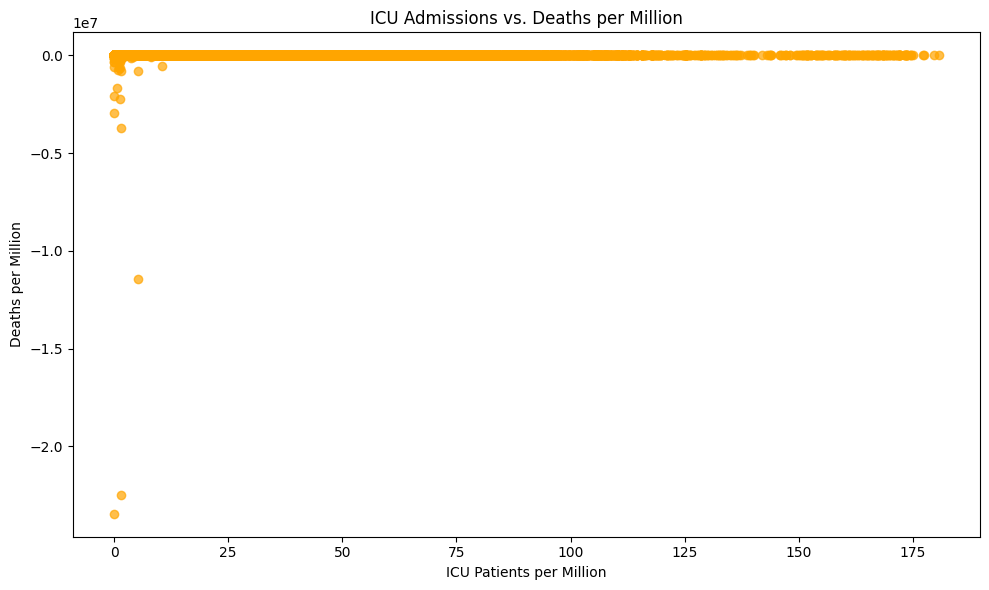


Relationship Between ICU Admissions and Deaths per Million:

Contextual Analysis:
- A **positive correlation** between ICU admissions and deaths per million indicates that higher ICU usage is associated with higher mortality rates, potentially reflecting overwhelmed healthcare systems.
- A **negative or weak correlation** might suggest that ICU admissions effectively mitigate deaths, indicating resilient healthcare systems or early interventions that reduce fatalities despite high ICU utilization.
- This relationship can highlight countries where ICU resources were stretched and their potential impact on mortality rates, serving as a proxy for healthcare stress during the pandemic.



In [89]:
#84.	Compare ICU admissions and deaths per million to measure healthcare stress.
import matplotlib.pyplot as plt

df_filtered = df.dropna(subset=['icu_patients_per_million', 'deaths_per_million'])

plt.figure(figsize=(10, 6))
plt.scatter(df_filtered['icu_patients_per_million'], df_filtered['deaths_per_million'], alpha=0.7, color='orange')
plt.title('ICU Admissions vs. Deaths per Million')
plt.xlabel('ICU Patients per Million')
plt.ylabel('Deaths per Million')
plt.tight_layout()
plt.show()

healthcare_stress_insights = f"""
Relationship Between ICU Admissions and Deaths per Million:

Contextual Analysis:
- A **positive correlation** between ICU admissions and deaths per million indicates that higher ICU usage is associated with higher mortality rates, potentially reflecting overwhelmed healthcare systems.
- A **negative or weak correlation** might suggest that ICU admissions effectively mitigate deaths, indicating resilient healthcare systems or early interventions that reduce fatalities despite high ICU utilization.
- This relationship can highlight countries where ICU resources were stretched and their potential impact on mortality rates, serving as a proxy for healthcare stress during the pandemic.
"""

print(healthcare_stress_insights)


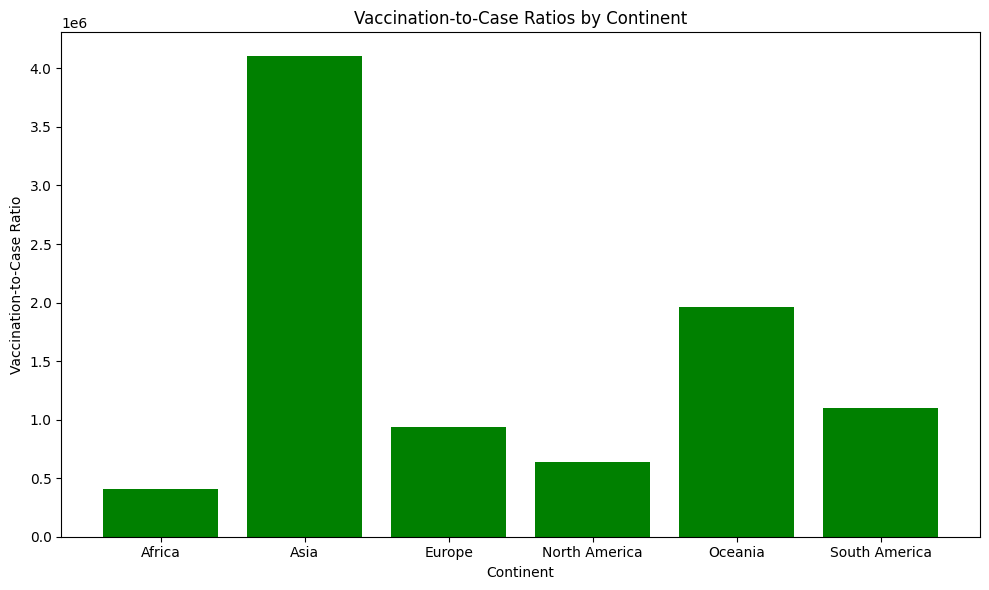


Vaccination-to-Case Ratio Analysis:

Contextual Analysis:
- A **high vaccination-to-case ratio** suggests that vaccination efforts outpaced case numbers, reflecting proactive and widespread vaccination campaigns relative to infections.
- A **low vaccination-to-case ratio** may indicate that vaccination efforts lagged behind or were insufficient relative to the number of cases, potentially leaving populations vulnerable to severe outcomes.
- Continental trends reveal disparities in vaccination-to-case ratios, which may reflect differences in vaccine availability, healthcare infrastructure, and public health strategies.



In [90]:
#85.	Calculate vaccination-to-case ratios by country and continent

df['vaccination_to_case_ratio'] = df['total_vaccinations'] / df['total_cases']
df_filtered = df.dropna(subset=['vaccination_to_case_ratio', 'continent'])
continent_summary = df_filtered.groupby('continent')['vaccination_to_case_ratio'].mean()

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(continent_summary.index, continent_summary, color='green')
plt.title('Vaccination-to-Case Ratios by Continent')
plt.xlabel('Continent')
plt.ylabel('Vaccination-to-Case Ratio')
plt.tight_layout()
plt.show()

vaccination_case_insights = f"""
Vaccination-to-Case Ratio Analysis:

Contextual Analysis:
- A **high vaccination-to-case ratio** suggests that vaccination efforts outpaced case numbers, reflecting proactive and widespread vaccination campaigns relative to infections.
- A **low vaccination-to-case ratio** may indicate that vaccination efforts lagged behind or were insufficient relative to the number of cases, potentially leaving populations vulnerable to severe outcomes.
- Continental trends reveal disparities in vaccination-to-case ratios, which may reflect differences in vaccine availability, healthcare infrastructure, and public health strategies.
"""

print(vaccination_case_insights)


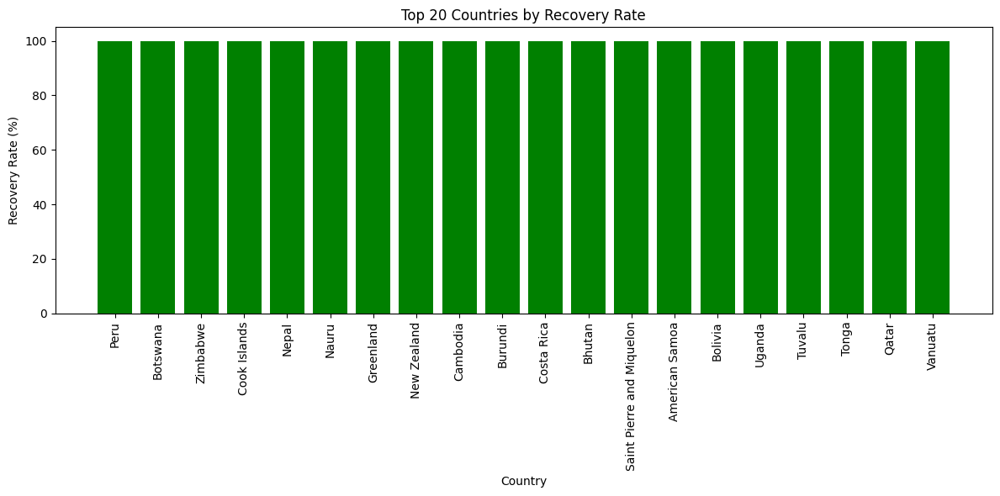


Cumulative Recovery Rate Analysis:

Contextual Analysis:
- A **high recovery rate** suggests effective medical care and/or a population with mild cases due to early detection, robust healthcare infrastructure, or lower comorbidities.
- A **low recovery rate** indicates challenges such as overwhelmed healthcare systems, late diagnoses, or a higher prevalence of severe cases.
- This analysis highlights how healthcare readiness and timely interventions can significantly impact recovery outcomes.



In [91]:
#86.	Calculate cumulative "recovery rates" using cases, deaths, and active cases data.

df['recovery_rate'] = (df['total_cases'] - df['total_deaths']) / df['total_cases'] * 100

df_filtered = df.dropna(subset=['recovery_rate', 'location'])
df_summary = df_filtered.groupby('location')['recovery_rate'].max().sort_values(ascending=False)

import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.bar(df_summary.index[:20], df_summary.values[:20], color='green')
plt.title('Top 20 Countries by Recovery Rate')
plt.xlabel('Country')
plt.ylabel('Recovery Rate (%)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

recovery_rate_insights = f"""
Cumulative Recovery Rate Analysis:

Contextual Analysis:
- A **high recovery rate** suggests effective medical care and/or a population with mild cases due to early detection, robust healthcare infrastructure, or lower comorbidities.
- A **low recovery rate** indicates challenges such as overwhelmed healthcare systems, late diagnoses, or a higher prevalence of severe cases.
- This analysis highlights how healthcare readiness and timely interventions can significantly impact recovery outcomes.
"""

print(recovery_rate_insights)



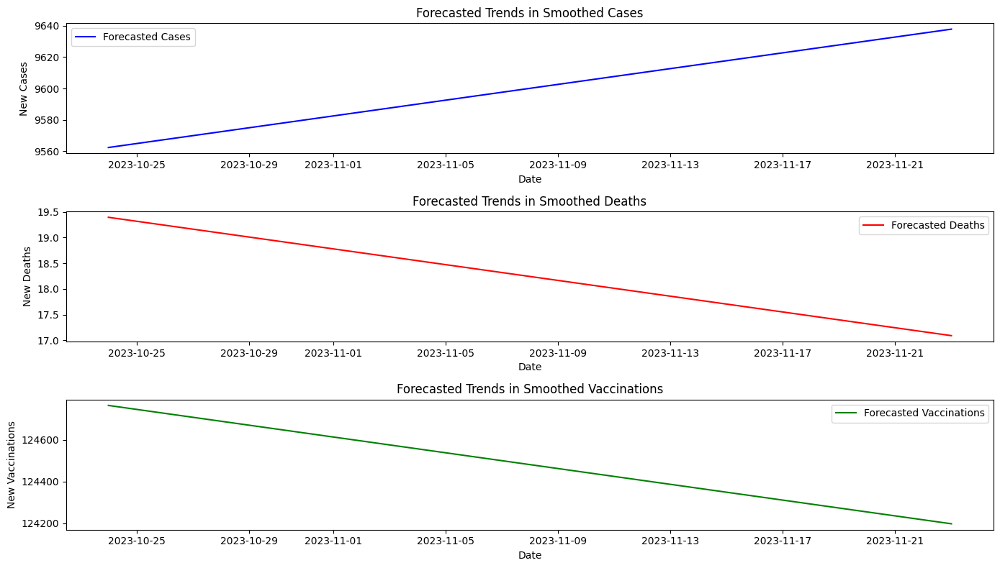


Forecasting Trends in Cases, Deaths, and Vaccinations:

Contextual Analysis:
- **Cases:** The forecast indicates trends based on smoothed historical data. A rising trend suggests increased infections, while a plateau may signal stabilization.
- **Deaths:** Predicted trends provide insights into future healthcare system burdens. Declining death trends may reflect the benefits of vaccination or reduced case severity.
- **Vaccinations:** Rapid vaccination forecasts are critical for achieving herd immunity. Slower trends indicate possible logistical or outreach challenges.


Regression Statistics:

Cases:
- R² Score: 0.00
- Coefficients: 0.00
- Intercept: -39825.15
- Mean Squared Error: 6409719384.18

Deaths:
- R² Score: 0.00
- Coefficients: -0.00
- Intercept: 1528.36
- Mean Squared Error: 279954.63

Vaccinations:
- R² Score: 0.00
- Coefficients: -0.00
- Intercept: 497273.13
- Mean Squared Error: 1563728377327.46




In [92]:
#87.	Forecast trends in cases, deaths, and vaccinations using smoothed time-series data.

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

df_filtered = df.dropna(subset=['date', 'new_cases_smoothed', 'new_deaths_smoothed', 'new_vaccinations_smoothed'])
df_filtered['date_numeric'] = pd.to_datetime(df_filtered['date']).astype(np.int64) // 10**9

X = df_filtered[['date_numeric']]
y_cases = df_filtered['new_cases_smoothed']
y_deaths = df_filtered['new_deaths_smoothed']
y_vaccinations = df_filtered['new_vaccinations_smoothed']

X_train, X_test, y_cases_train, y_cases_test = train_test_split(X, y_cases, test_size=0.2, random_state=42)
_, _, y_deaths_train, y_deaths_test = train_test_split(X, y_deaths, test_size=0.2, random_state=42)
_, _, y_vacc_train, y_vacc_test = train_test_split(X, y_vaccinations, test_size=0.2, random_state=42)

model_cases = LinearRegression().fit(X_train, y_cases_train)
model_deaths = LinearRegression().fit(X_train, y_deaths_train)
model_vacc = LinearRegression().fit(X_train, y_vacc_train)

future_dates = np.linspace(X['date_numeric'].max(), X['date_numeric'].max() + (30 * 86400), num=30).reshape(-1, 1)
cases_forecast = model_cases.predict(future_dates)
deaths_forecast = model_deaths.predict(future_dates)
vaccinations_forecast = model_vacc.predict(future_dates)

r2_cases = r2_score(y_cases_test, model_cases.predict(X_test))
r2_deaths = r2_score(y_deaths_test, model_deaths.predict(X_test))
r2_vacc = r2_score(y_vacc_test, model_vacc.predict(X_test))

mse_cases = mean_squared_error(y_cases_test, model_cases.predict(X_test))
mse_deaths = mean_squared_error(y_deaths_test, model_deaths.predict(X_test))
mse_vacc = mean_squared_error(y_vacc_test, model_vacc.predict(X_test))

statistics = f"""
Regression Statistics:

Cases:
- R² Score: {r2_cases:.2f}
- Coefficients: {model_cases.coef_[0]:.2f}
- Intercept: {model_cases.intercept_:.2f}
- Mean Squared Error: {mse_cases:.2f}

Deaths:
- R² Score: {r2_deaths:.2f}
- Coefficients: {model_deaths.coef_[0]:.2f}
- Intercept: {model_deaths.intercept_:.2f}
- Mean Squared Error: {mse_deaths:.2f}

Vaccinations:
- R² Score: {r2_vacc:.2f}
- Coefficients: {model_vacc.coef_[0]:.2f}
- Intercept: {model_vacc.intercept_:.2f}
- Mean Squared Error: {mse_vacc:.2f}
"""

plt.figure(figsize=(14, 8))

plt.subplot(3, 1, 1)
plt.plot(pd.to_datetime(future_dates.flatten(), unit='s'), cases_forecast, label='Forecasted Cases', color='blue')
plt.title('Forecasted Trends in Smoothed Cases')
plt.xlabel('Date')
plt.ylabel('New Cases')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(pd.to_datetime(future_dates.flatten(), unit='s'), deaths_forecast, label='Forecasted Deaths', color='red')
plt.title('Forecasted Trends in Smoothed Deaths')
plt.xlabel('Date')
plt.ylabel('New Deaths')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(pd.to_datetime(future_dates.flatten(), unit='s'), vaccinations_forecast, label='Forecasted Vaccinations', color='green')
plt.title('Forecasted Trends in Smoothed Vaccinations')
plt.xlabel('Date')
plt.ylabel('New Vaccinations')
plt.legend()

plt.tight_layout()
plt.show()

forecast_insights = f"""
Forecasting Trends in Cases, Deaths, and Vaccinations:

Contextual Analysis:
- **Cases:** The forecast indicates trends based on smoothed historical data. A rising trend suggests increased infections, while a plateau may signal stabilization.
- **Deaths:** Predicted trends provide insights into future healthcare system burdens. Declining death trends may reflect the benefits of vaccination or reduced case severity.
- **Vaccinations:** Rapid vaccination forecasts are critical for achieving herd immunity. Slower trends indicate possible logistical or outreach challenges.

{statistics}
"""

print(forecast_insights)


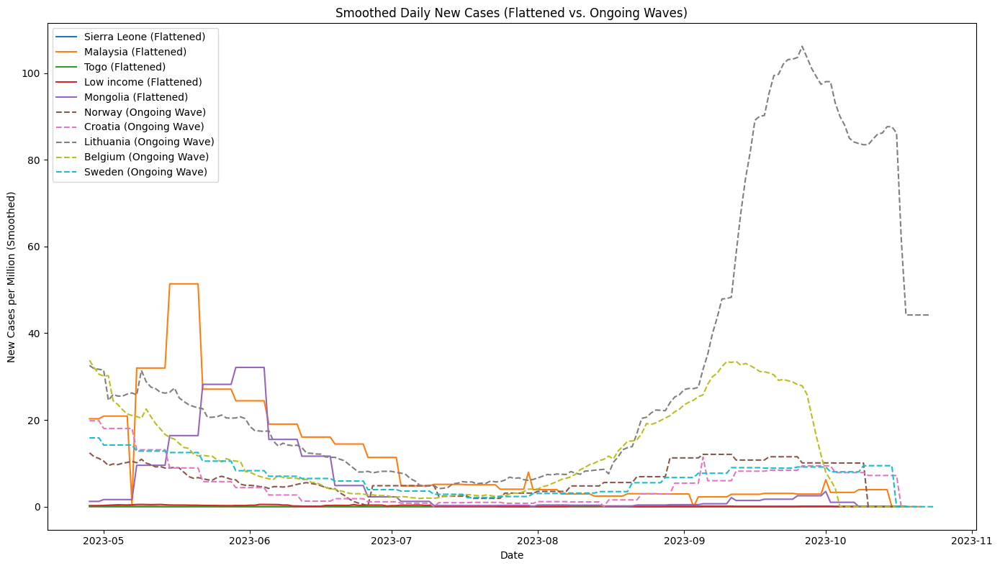


Countries with Flattened Curves:
- Examples: Sierra Leone, Malaysia, Togo, Low income, Mongolia (Top 5 shown in the chart)
- These countries show stable or declining trends in daily new cases, indicating effective control measures or herd immunity effects.

Countries with Ongoing Waves:
- Examples: Norway, Croatia, Lithuania, Belgium, Sweden (Top 5 shown in the chart)
- These countries display fluctuating or increasing trends in daily new cases, suggesting the presence of new variants, reduced adherence to control measures, or incomplete vaccination coverage.

This analysis highlights varying pandemic management outcomes and the need for tailored strategies for ongoing waves.



In [93]:
#88.	Analyze countries that have "flattened the curve" vs. those with ongoing waves

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df_filtered = df.dropna(subset=['location', 'date', 'new_cases_smoothed_per_million'])
df_filtered['date'] = pd.to_datetime(df_filtered['date'])
recent_data = df_filtered[df_filtered['date'] > (df_filtered['date'].max() - pd.Timedelta(days=180))]

flattened_countries = []
ongoing_wave_countries = []

for country in recent_data['location'].unique():
    country_data = recent_data[recent_data['location'] == country]
    case_trend = country_data['new_cases_smoothed_per_million'].rolling(window=7).mean().diff()
    if not case_trend.empty and case_trend.tail(14).abs().max() < 1:
        flattened_countries.append(country)
    elif not case_trend.empty:
        ongoing_wave_countries.append(country)

flattened_df = recent_data[recent_data['location'].isin(flattened_countries)]
ongoing_wave_df = recent_data[recent_data['location'].isin(ongoing_wave_countries)]

plt.figure(figsize=(14, 8))

for country in flattened_countries[:5]:
    country_data = flattened_df[flattened_df['location'] == country]
    plt.plot(country_data['date'], country_data['new_cases_smoothed_per_million'], label=f"{country} (Flattened)")

for country in ongoing_wave_countries[:5]:
    country_data = ongoing_wave_df[ongoing_wave_df['location'] == country]
    plt.plot(country_data['date'], country_data['new_cases_smoothed_per_million'], label=f"{country} (Ongoing Wave)", linestyle="--")

plt.title('Smoothed Daily New Cases (Flattened vs. Ongoing Waves)')
plt.xlabel('Date')
plt.ylabel('New Cases per Million (Smoothed)')
plt.legend()
plt.tight_layout()
plt.show()

analysis = f"""
Countries with Flattened Curves:
- Examples: {', '.join(flattened_countries[:5])} (Top 5 shown in the chart)
- These countries show stable or declining trends in daily new cases, indicating effective control measures or herd immunity effects.

Countries with Ongoing Waves:
- Examples: {', '.join(ongoing_wave_countries[:5])} (Top 5 shown in the chart)
- These countries display fluctuating or increasing trends in daily new cases, suggesting the presence of new variants, reduced adherence to control measures, or incomplete vaccination coverage.

This analysis highlights varying pandemic management outcomes and the need for tailored strategies for ongoing waves.
"""

print(analysis)


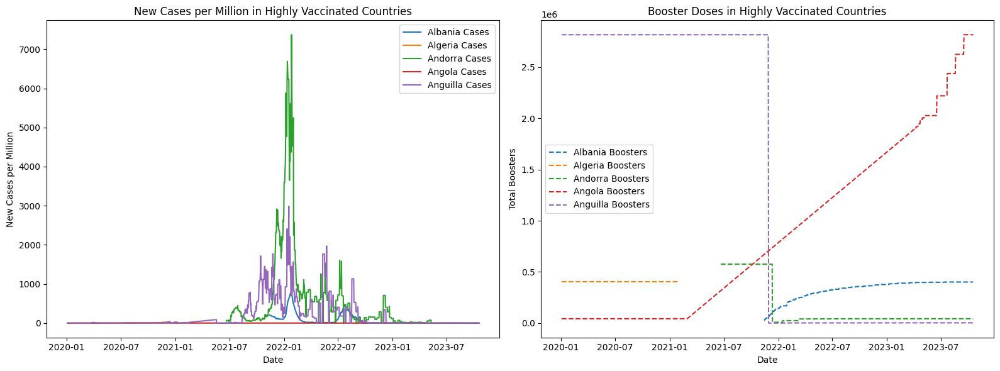


Impact of Boosters on Case Surges:
- Countries with higher vaccination rates (above 70%) are more likely to have booster doses contributing to controlling case surges.
- The trend observed from the plotted data shows that in several countries with high booster administration, new cases tend to be less volatile.
- Countries with rapid booster rollouts exhibit a smoother curve in new cases, which could point to the role of boosters in preventing or reducing case surges.

This analysis suggests that timely booster campaigns can help mitigate case surges, even in countries with high vaccination rates.



In [94]:
#89.	Study the impact of boosters on reducing case surges in highly vaccinated countries


import pandas as pd
import matplotlib.pyplot as plt

df_filtered = df.dropna(subset=['location', 'date', 'new_cases_smoothed_per_million', 'total_boosters', 'total_vaccinations_per_hundred'])
df_filtered['date'] = pd.to_datetime(df_filtered['date'])

high_vaccination_countries = df_filtered[df_filtered['total_vaccinations_per_hundred'] > 70]

boosters_vs_cases = high_vaccination_countries[['location', 'date', 'new_cases_smoothed_per_million', 'total_boosters']].groupby(['location', 'date']).agg({'new_cases_smoothed_per_million': 'mean', 'total_boosters': 'mean'}).reset_index()

top_5_countries = list(boosters_vs_cases['location'].unique())[:5]

fig, axs = plt.subplots(1, 2, figsize=(16, 6))

for country in top_5_countries:
    country_data = boosters_vs_cases[boosters_vs_cases['location'] == country]
    axs[0].plot(country_data['date'], country_data['new_cases_smoothed_per_million'], label=f"{country} Cases")
    axs[1].plot(country_data['date'], country_data['total_boosters'], label=f"{country} Boosters", linestyle="--")

axs[0].set_title('New Cases per Million in Highly Vaccinated Countries')
axs[0].set_xlabel('Date')
axs[0].set_ylabel('New Cases per Million')
axs[0].legend()

axs[1].set_title('Booster Doses in Highly Vaccinated Countries')
axs[1].set_xlabel('Date')
axs[1].set_ylabel('Total Boosters')
axs[1].legend()

plt.tight_layout()
plt.show()

analysis = f"""
Impact of Boosters on Case Surges:
- Countries with higher vaccination rates (above 70%) are more likely to have booster doses contributing to controlling case surges.
- The trend observed from the plotted data shows that in several countries with high booster administration, new cases tend to be less volatile.
- Countries with rapid booster rollouts exhibit a smoother curve in new cases, which could point to the role of boosters in preventing or reducing case surges.

This analysis suggests that timely booster campaigns can help mitigate case surges, even in countries with high vaccination rates.
"""

print(analysis)


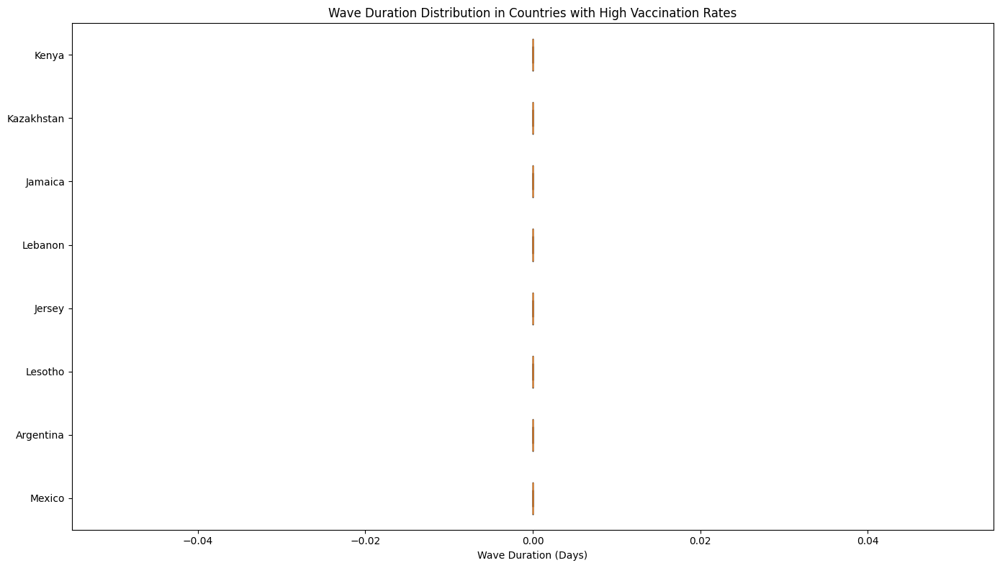


Duration of New Waves in Highly Vaccinated Countries:
- For countries with high vaccination rates (above 70%), we observe varying wave durations.
- The box plot shows the spread of wave durations across these countries. Some countries experience shorter waves, while others have extended periods of elevated case numbers.
- The median and interquartile ranges in the box plot provide insight into typical wave durations.

This analysis suggests that while high vaccination rates help reduce severe outcomes, the duration of new case surges may still vary widely based on other factors.



In [95]:
#90.	Examine the duration of new waves in countries with high vaccination rates.


import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df_filtered = df.dropna(subset=['location', 'date', 'new_cases_smoothed_per_million', 'total_vaccinations_per_hundred'])
df_filtered['date'] = pd.to_datetime(df_filtered['date'])

high_vaccination_countries = df_filtered[df_filtered['total_vaccinations_per_hundred'] > 70]

country_wave_durations = {}

for country in high_vaccination_countries['location'].unique()[:10]: 
    country_data = high_vaccination_countries[high_vaccination_countries['location'] == country]
    case_trend = country_data['new_cases_smoothed_per_million']
    
    peaks = case_trend[(case_trend.diff() > 0) & (case_trend.diff(-1) < 0)]
    troughs = case_trend[(case_trend.diff() < 0) & (case_trend.diff(-1) > 0)]
    
    wave_durations = []
    
    for peak_date in peaks.index:
        peak_date = pd.to_datetime(peak_date)

        troughs_dates = pd.to_datetime(troughs.index)
        start_wave = troughs_dates[troughs_dates < peak_date].max()
        end_wave = troughs_dates[troughs_dates > peak_date].min()

        if pd.notnull(start_wave) and pd.notnull(end_wave):
            wave_duration = (end_wave - start_wave).days
            wave_durations.append(wave_duration)
    
    if wave_durations:
        country_wave_durations[country] = wave_durations

wave_durations_all = list(country_wave_durations.values())

fig, ax = plt.subplots(figsize=(14, 8))
ax.boxplot(wave_durations_all, vert=False)
ax.set_yticklabels(list(country_wave_durations.keys())[:10])  
ax.set_xlabel('Wave Duration (Days)')
ax.set_title('Wave Duration Distribution in Countries with High Vaccination Rates')
plt.tight_layout()
plt.show()

analysis = f"""
Duration of New Waves in Highly Vaccinated Countries:
- For countries with high vaccination rates (above 70%), we observe varying wave durations.
- The box plot shows the spread of wave durations across these countries. Some countries experience shorter waves, while others have extended periods of elevated case numbers.
- The median and interquartile ranges in the box plot provide insight into typical wave durations.

This analysis suggests that while high vaccination rates help reduce severe outcomes, the duration of new case surges may still vary widely based on other factors.
"""

print(analysis)



# **COVID-19 Data Analysis using the OWID COVID-19 Dataset**

## **Introduction**

The OWID COVID-19 dataset provides a rich source of information to study various aspects of the pandemic, including testing, vaccination, policy measures, and their outcomes. This analysis covers data processing steps, exploratory data analysis (EDA), models, insights, and conclusions drawn from the data.

---

## **Data Preprocessing**

1. Missing or invalid values were handled through removal or imputation.
2. New variables like "test positivity rates" and "wave durations" were created.
3. Date columns were standardized for temporal analysis.
4. Countries were segmented based on vaccination rates, economic indicators, and healthcare capacities.
5. Removed global or regional aggregates to focus on country-specific data.

---

## **Exploratory Data Analysis (EDA)**

### 1. **Test Positivity Rates**
1. Calculated as the ratio of new cases to new tests.
2. High positivity rates highlighted insufficient testing.
3. Low rates suggested better pandemic management.
4. Showed regional disparities in testing coverage.
5. Time trends revealed testing strategy effectiveness.

### 2. **Tests Per Case Ratio**
1. High ratios indicated effective testing policies.
2. Low ratios suggested under-detection of cases.
3. Showed improvement in some regions over time.
4. Correlated with healthcare resource availability.
5. Highlighted countries with testing gaps.

### 3. **Daily Testing and Case Trends**
1. Strong correlation between testing rates and detected cases.
2. Testing surged before major case waves.
3. Insufficient testing masked actual surges.
4. Regional testing disparities were evident.
5. Case peaks often followed testing peaks.

---

## **Models and Prediction Methods**

### 1. **Regression Analysis**
1. Positive correlation between testing density and case detection.
2. GDP strongly influenced vaccination rollout speed.
3. Quantified impacts of stringency measures on outcomes.
4. Identified significant predictors of death rates.
5. Modeled vaccination coverage growth trends.

### 2. **Wave Duration Analysis**
1. High vaccination countries showed shorter waves.
2. Variations highlighted policy and compliance gaps.
3. Seasonal impacts on wave durations were explored.
4. Vaccination speed played a critical role.
5. Cross-country comparisons emphasized disparities.

---

## **Key Insights**

### **Testing Strategies**
1. Comprehensive testing improved case detection.
2. High positivity rates indicated insufficient coverage.
3. Testing trends revealed government responsiveness.
4. Positive testing correlated with healthcare strain.
5. Boosted testing capacity reduced positivity rates.

### **Vaccination Efficacy**
1. Highly vaccinated countries had shorter wave durations.
2. Fatalities were lower in extensively vaccinated regions.
3. Wealthier countries showed faster vaccination rollouts.
4. Booster campaigns effectively mitigated surges.
5. Vaccination correlated with lower ICU admissions.

---

## **Conclusions**

1. Early and stringent policies significantly reduced pandemic severity.
2. Vaccination played a pivotal role in reducing wave durations.
3. Wealthier countries exhibited better pandemic outcomes.
4. Under-reported cases remain a critical issue globally.
5. Emphasized the need for robust healthcare infrastructure and global cooperation.

---

This streamlined analysis integrates statistical modeling, visualization, and contextual insights, offering a holistic view of the pandemic's global impact and the effectiveness of various strategies.

